# Two Steps MultiFidelity Neural Network

Code to show the performance of the Neural Network when dealing with different LF datasets 

In [1]:
######### LIBRARIES ############
import keras.backend as K
from keras.regularizers import l2
from hyperopt import STATUS_OK, tpe, Trials, hp, fmin
from hyperopt.pyll.stochastic import sample
from sklearn.model_selection import KFold
from keras.models import save_model
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from keras.optimizers import Adam, Nadam, Adamax
from time import perf_counter
import pandas
import pickle
import os
import keras
import tensorflow as tf
import sys
from module_utils import * 
sys.path.append('../utils')
from Structure import *

from pathlib import Path

# path to the current notebook
current_file_path = Path().resolve()
# path to the current folder
load_context_functions(current_file_path.parent.name)




Ray module not found. Multiprocessing features are not available


True

In [2]:
# reproducibility
seed = 7
np.random.seed(seed)
keras.utils.set_random_seed(seed)
tf.random.set_seed(seed)

## Data Preparation
multiparameter case

In [3]:

file_path = 'dataset_abcd_variationLLF.csv'

# [t, y_values_list[i][j, 0], y_values_list[i][j, 1], a_values[i],b_values[i],c_values[i],d_values[i]]
data_LF = np.genfromtxt(file_path, delimiter=',', dtype=None)

file_path = 'dataset_abcd_variationHF.csv'

data_HF = np.genfromtxt(file_path, delimiter=',', dtype=None)

model_list=[0]*len(np.unique(data_LF[:,-4]))


For a fixed $\mu$, I build a NN which, trained on dt, connects dt and the output

In [4]:
nlf=150
nhf=50
batch_size=[nlf,nhf]

# number of epochs 
Nepo = [1000,1500]

indexes_LF = np.where(np.diff(data_LF[:,-4]) != 0)[0] + 1
indexes_LF = np.insert(indexes_LF, 0, 0)
indexes_LF = np.append(indexes_LF, len(data_LF))


indexes_HF = np.where(np.diff(data_HF[:,-4]) != 0)[0] + 1
indexes_HF = np.insert(indexes_HF, 0, 0)
indexes_HF = np.append(indexes_HF, len(data_HF))


r2_HF_df = pandas.DataFrame(columns=['a','b','c','d','R2'])  # dataframe which stores HF R^2
r2_LF_df = pandas.DataFrame(columns=['a','b','c','d','R2'])  # dataframe which stores LF R^2
mse_HF_df = pandas.DataFrame(columns=['a','b','c','d','MSE'])  # dataframe which stores HF MSE
mse_LF_df = pandas.DataFrame(columns=['a','b','c','d','MSE'])  # dataframe which stores LF MSE



In [5]:
print(indexes_HF)

[   0  601 1202 1803 2404 3005]


## Neural Network
Cycle on the Discretization and the value of the diffusion 

Folder '2_step_models' already exists.



The function training took 7.760323524475098 seconds.


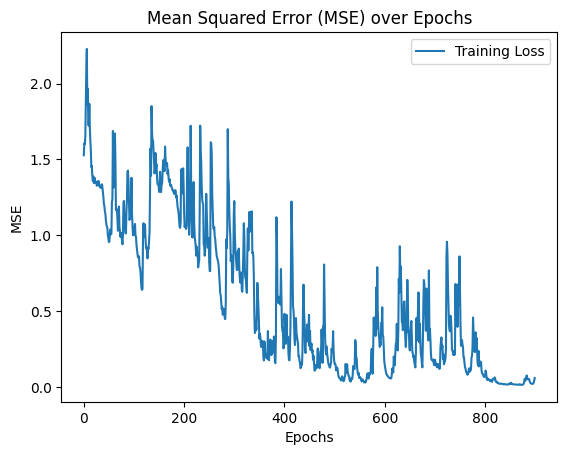

The function training took 7.032122611999512 seconds.


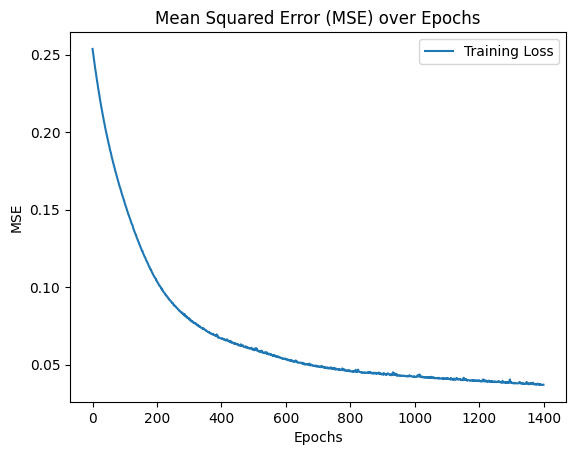

low fidelity NN
LF input
(1505, 5)
(1505, 2)
(1505, 2)
Test MSE: 0.04575506350130042
R^2: 0.990936301486839
HF input
(3005, 5)
(3005, 2)
(3005, 2)
Test MSE: 0.24041983420749538
R^2: 0.9447306706939771
Final model
(3005, 7)
(3005, 2)
(3005, 2)
Test MSE: 0.04157734656390923
R^2: 0.9904419197921579


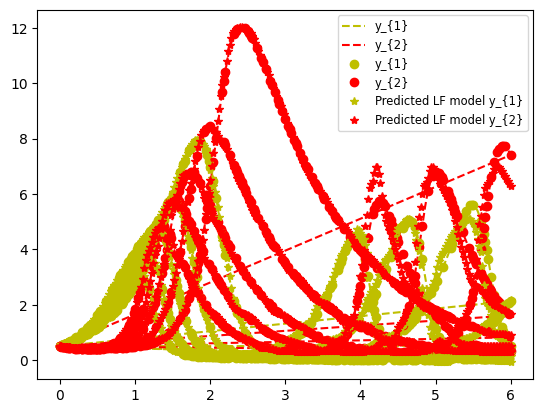

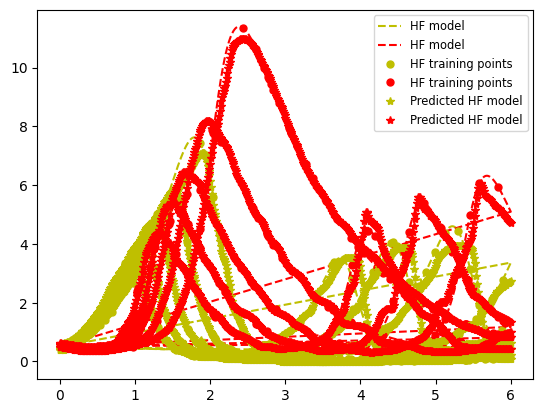

Saving ...
     a    b    c    d       R2       mu
0  NaN  NaN  NaN  NaN  0.99044  0.01484
     a    b    c    d      MSE       mu       R2
0  NaN  NaN  NaN  NaN  0.04158  0.01484  0.99044


C:\Users\Giacomo\AppData\Local\Temp\ipykernel_28592\3457067765.py:218: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  r2_LF_df = pandas.concat([r2_LF_df, pandas.DataFrame([new_data])], ignore_index=True)
C:\Users\Giacomo\AppData\Local\Temp\ipykernel_28592\3457067765.py:222: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  r2_HF_df = pandas.concat([r2_HF_df, pandas.DataFrame([new_data])], ignore_index=True)
C:\Users\Giacomo\AppData\Local\Temp\ipykernel_28592\3457067765.py:226: FutureWarning: The beha

In [6]:
# Name of the folder
folder_name = "2_step_models"
folder_path = os.path.join(os.getcwd(), folder_name)

# create the folder
if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print(f"Folder '{folder_name}' created.")
else:
    print(f"Folder '{folder_name}' already exists.")
            
test_mse_HF_list = []
test_mse_LF_list = []

r2_HF_list = []
r2_LF_list = []

data_HF_test=np.empty((0,data_HF.shape[1]))
data_HF_train=np.empty((0,data_HF.shape[1]))
data_LF_test=np.empty((0,data_LF.shape[1]))
data_LF_train=np.empty((0,data_LF.shape[1]))

for i in range(len(np.unique(data_LF[:,-4]))):

    #temp=normalization(data_HF[indexes_HF[i]:indexes_HF[i+1],:])
    temp=data_HF[indexes_HF[i]:indexes_HF[i+1],:]
    data_HF_test=np.append(data_HF_test,temp,axis=0)

    permutation = np.random.permutation(temp.shape[0]) #data_HF[indexes_HF[0]:indexes_HF[1],:].shape[0])
    data_HF_train = np.append(data_HF_train,temp[permutation,:][0:nhf,:],axis=0)

    #tempLF=normalization(data_LF[indexes_LF[i]:indexes_LF[i+1],:])
    tempLF=data_LF[indexes_LF[i]:indexes_LF[i+1],:]

    data_LF_test=np.append(data_LF_test,tempLF,axis=0)

    permutation = np.random.permutation(tempLF.shape[0]) #data_HF[indexes_HF[0]:indexes_HF[1],:].shape[0])
    data_LF_train = np.append(data_LF_train,tempLF[permutation,:][0:nlf,:],axis=0)


##########################      Neural Network     ##########################
K.clear_session()

# parameters 
bestLF_params = {
    "lr": 0.0255,
    "kernel_init": "glorot_uniform",
    "opt": "Adam",
} 
best_params={'kernel_init': 'uniform', 'l2weight': 0.005395541657336886, 'lr': 0.0025412188591473228, 'nodes': 12.0, 'opt': 'Adamax'}

# reproducibilty porpuse 
learning_rate = bestLF_params["lr"]
optimizer_type = bestLF_params["opt"]

# Fissa i parametri di ottimizzazione
if optimizer_type == "Adam":
    optimizer = Adam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=1e-7)
elif optimizer_type == "Nadam":
    optimizer = Nadam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=1e-7)
elif optimizer_type == "Adamax":
    optimizer = Adamax(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=1e-7)
else:
    raise ValueError(f"Optimizer type '{optimizer_type}' not recognized.")

# Multifidelity network 
names=["LF","HF"]
params=[bestLF_params, best_params]


input_LF_train=np.concatenate((data_LF_train[:, 0].reshape(-1,1), data_LF_train[:, 3:7]), axis=1)
input_HF_train=np.concatenate((data_HF_train[:, 0].reshape(-1,1), data_HF_train[:, 3:7]), axis=1)
data_train=[input_LF_train,input_HF_train]

output_LF_train=data_LF_train[:,1:3]
output_HF_train=data_HF_train[:,1:3]
output_train=[output_LF_train,output_HF_train]

input_LF_test=np.concatenate((data_LF_test[:, 0].reshape(-1,1), data_LF_test[:, 3:7]), axis=1)
input_HF_test= np.concatenate((data_HF_test[:, 0].reshape(-1,1), data_HF_test[:, 3:7]), axis=1)
data_test=[input_LF_test, input_HF_test]

output_LF_test=data_LF_test[:,1:3]
output_HF_test=data_HF_test[:,1:3]
output_test=[output_LF_test,output_HF_test]

            
model= NetworkFactory.build_network("2step",names,params=params,data_train=data_train,output_train=output_train,N=Nepo,n=batch_size,do_HPO=False,verbose=False)

# low fidelity part of the network 
ULF = model.model_list[0].prediction(input_LF_train)
print("low fidelity NN")
print("LF input")
(test_mse_LF,r2_LF) = model.model_list[0].performance(input_LF_test,output_LF_test)
test_mse_LF_list.append(test_mse_LF)
r2_LF_list.append(r2_LF)
print("HF input")
_,_= model.model_list[0].performance(input_HF_test,output_HF_test)
# creation of the input of the second part of the 2 steps NN to study the high fidelity model
input_HF = np.concatenate(
    (input_HF_test,  model.model_list[0].prediction(input_HF_test)),axis=1
)  # <- TRAINING INPUT for the second NN: NN_HF

input_HF_train = np.concatenate(
    (input_HF_train,  model.model_list[0].prediction(input_HF_train)),axis=1
) 
# performance of the last part of the network
print("Final model")
(test_mse_HF,r2_HF) = model.model_list[1].performance(input_HF,output_HF_test)                
test_mse_HF_list.append(test_mse_HF)
r2_HF_list.append(r2_HF)
            
            
# plots of the model
plt.figure()
plt.plot(
data_LF_test[:, 0], data_LF_test[:,1], "y--", linewidth=1.5, label="y_{1}"
)
plt.plot(
data_LF_test[:, 0], data_LF_test[:,2], "r--", linewidth=1.5, label="y_{2}"
)

plt.plot(
data_LF_train[:, 0], data_LF_train[:,1], "yo", linewidth=1.5, label="y_{1}"
)
plt.plot(
data_LF_train[:, 0], data_LF_train[:,2], "ro", linewidth=1.5, label="y_{2}"
)

plt.plot(
data_LF_test[:, 0],
model.model_list[0].prediction(input_LF_test)[:,0],
"y*",
linewidth=3,
label="Predicted LF model y_{1}",
)
plt.plot(
data_LF_test[:, 0],
model.model_list[0].prediction(input_LF_test)[:,1],
"r*",
linewidth=3,
label="Predicted LF model y_{2}",
)          
plt.legend(prop={"size": 8.3})
plt.show()
            

plt.figure()
plt.plot(
data_HF_test[:,0], output_HF_test[:,0], "y--", linewidth=1.5, label="HF model"
)
plt.plot(
data_HF_test[:,0], output_HF_test[:,1], "r--", linewidth=1.5, label="HF model"
)

        
plt.plot(
data_HF_train[:,0],
output_HF_train[:,0],
"yo",
markersize=5,
label="HF training points",
)
plt.plot(
data_HF_train[:,0],
output_HF_train[:,1],
"ro",
markersize=5,
label="HF training points",
)
            
            
# order=np.argsort(data_LF_train[:,0])
            
# plt.plot(
# data_LF_train[order,0],
# data_LF_train[order,1],
# "y-",
# markersize=5,
# label="LF training points",
# )
# plt.plot(
# data_LF_train[order,0],
# data_LF_train[order,2],
# "r-",
# markersize=5,
# label="LF training points",
# )
# plt.plot(
# data_LF_train[order,0],
# data_LF_train[order,3],
# "g-",
# markersize=5,
# label="LF training points",
# )

plt.plot(
data_HF_test[:,0],
model.model_list[1].prediction(input_HF)[:,0],
"y*",
linewidth=3,
label="Predicted HF model",
)
plt.plot(
data_HF_test[:,0],
model.model_list[1].prediction(input_HF)[:,1],
"r*",
linewidth=3,
label="Predicted HF model",
)
plt.legend(prop={"size": 8.3})
plt.show()
            
new_data = {'mu': np.unique(data_LF)[i]}

# DataFrame r2_LF_df
new_data['R2'] = r2_LF_list[-1]
r2_LF_df = pandas.concat([r2_LF_df, pandas.DataFrame([new_data])], ignore_index=True)

# DataFrame r2_HF_df
new_data['R2'] = r2_HF_list[-1]
r2_HF_df = pandas.concat([r2_HF_df, pandas.DataFrame([new_data])], ignore_index=True)

# DataFrame mse_LF_df
new_data['MSE'] = test_mse_LF_list[-1]
mse_LF_df = pandas.concat([mse_LF_df, pandas.DataFrame([new_data])], ignore_index=True)

# DataFrame mse_HF_df
new_data['MSE'] = test_mse_HF_list[-1]
mse_HF_df = pandas.concat([mse_HF_df, pandas.DataFrame([new_data])], ignore_index=True)

        
# save the model
model.save(str(np.unique(data_LF[:,-1])[i]),folder_path)
    

            
print(r2_HF_df.round(5))
print(mse_HF_df.round(5))

## Save the output

In [7]:
# os.makedirs(folder_path)

# r2_HF_df.to_csv(
#     "./{folder_name}/r2_HF_LF_200_7000_HF_100_8000_2NN_noise_fourier_class.txt",
#     header=True,
#     index=False,
#     sep="\t",
#     mode="a",
# )
# mse_HF_df.to_csv(
#     "./{folder_name}/mse_HF_LF_200_7000_HF_100_8000_2NN_noise_fourier_class.txt",
#     header=True,
#     index=False,
#     sep="\t",
#     mode="a",
# )
# r2_LF_df.to_csv(
#     "./{folder_name}/r2_LF_LF_200_7000_HF_100_8000_2NN_noise_fourier_class.txt",
#     header=True,
#     index=False,
#     sep="\t",
#     mode="a",
# )
# mse_LF_df.to_csv(
#     "./{folder_name}/mse_LF_LF_200_7000_HF_100_8000_2NN_noise_fourier_class.txt",
#     header=True,
#     index=False,
#     sep="\t",
#     mode="a",
# )

# with open("./{folder_name}/U_HF_list.data", "wb") as filehandle:
#     # store the data as binary data stream
#     pickle.dump(U_HF_list, filehandle)

# with open("./{folder_name}/U_LF_list.data", "wb") as filehandle:
#     pickle.dump(U_LF_list, filehandle)

# Inverse problem

In [8]:
# true parameters
sigma_noise=[0.5,1.]
n_data=[5,15,25,50]
parameters=np.array([2.,0.6,0.6,0.8])

mean_prior=np.array([2.3,0.9,0.4,1.1])
cov_prior=np.diag([ 0.1, 0.01, 0.01, 0.1])
# cov_linkelihood
sigma=1.5

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =30
burnin = 15
n_chains=6

for noise in range(len(sigma_noise)):
    for n in range(len(n_data)):
        print(f"noise {sigma_noise[noise]}")
        print(f"nb.data {n_data[n]}")


        t_eval=np.linspace(0.,6.,n_data[n]).reshape(-1,1)
# prior

        # to be modified depending on th eparameters combination that youi are choosing
        closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
        nearest_x=data_HF[closest_indices,0]
        y_obs=data_HF[closest_indices,1:3] # chekc se giusto

        estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise[noise], cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="AM")



noise 0.5
nb.data 5
(5, 2)
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.03: 100%|██████████| 30/30 [00:02<00:00, 11.84it/s]


Sampling chain 2/6


Running chain, α = 0.03: 100%|██████████| 30/30 [00:02<00:00, 11.85it/s]


Sampling chain 3/6


Running chain, α = 0.03: 100%|██████████| 30/30 [00:02<00:00, 11.59it/s]


Sampling chain 4/6


Running chain, α = 0.03: 100%|██████████| 30/30 [00:02<00:00, 11.66it/s]


Sampling chain 5/6


Running chain, α = 0.03: 100%|██████████| 30/30 [00:02<00:00, 11.85it/s]


Sampling chain 6/6


Running chain, α = 0.03: 100%|██████████| 30/30 [00:02<00:00, 11.87it/s]


{'sampler': 'MH', 'n_chains': 6, 'iterations': 31, 'chain_0': [<tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyDA.link.Link object at 0x000002B19DB05910>, <tinyD

ValueError: Variable 'obs_0': Could not convert tuple of form (dims, data[, attrs, encoding]): (['chain', 'draw'], array([[[0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701]],

       [[0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701]],

       [[0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701]],

       [[0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701]],

       [[0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701]],

       [[0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701],
        [0.45264569, 0.49693701]]])) to Variable.

In [ ]:
# true parameters
sigma_noise=[0.25]
n_data=[15,25]
parameters=np.array([2.,0.6,0.6,0.8])

mean_prior=np.array([2.3,0.9,0.4,1.1])
cov_prior=np.diag([ 0.1, 0.01, 0.01, 0.1])
# cov_linkelihood
sigma=1.5

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =3000
burnin = 1500
n_chains=6

for noise in range(len(sigma_noise)):
    for n in range(len(n_data)):
        print(f"noise {sigma_noise[noise]}")
        print(f"nb.data {n_data[n]}")


        t_eval=np.linspace(0.,6.,n_data[n]).reshape(-1,1)
# prior


        closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
        nearest_x=data_HF[closest_indices,0]
        y_obs=data_HF[closest_indices,1:3] # chekc se giusto

        estimate_MF=model.param_inverse(mean_prior, t_eval, levels=2, cov_prior=cov_prior, cov_noise=sigma_noise[noise], cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="MLDA")



noise 0.25
nb.data 15
2
real values are [2.  0.6 0.6 0.8]


AttributeError: 'list' object has no attribute 'prior'

noise 0.5
nb.data 5
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.35: 100%|██████████| 3000/3000 [04:36<00:00, 10.85it/s]


Sampling chain 2/6


Running chain, α = 0.26: 100%|██████████| 3000/3000 [08:38<00:00,  5.78it/s]


Sampling chain 3/6


Running chain, α = 0.21: 100%|██████████| 3000/3000 [09:21<00:00,  5.34it/s]


Sampling chain 4/6


Running chain, α = 0.25: 100%|██████████| 3000/3000 [09:23<00:00,  5.33it/s]


Sampling chain 5/6


Running chain, α = 0.26: 100%|██████████| 3000/3000 [08:11<00:00,  6.10it/s]


Sampling chain 6/6


Running chain, α = 0.25: 100%|██████████| 3000/3000 [08:39<00:00,  5.77it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.231 0.892 0.399 1.088]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.231  0.239   1.757    2.642      0.011    0.008     496.0     918.0   
x1  0.892  0.097   0.711    1.063      0.004    0.003     584.0     958.0   
x2  0.399  0.097   0.219    0.579      0.004    0.003     635.0     787.0   
x3  1.088  0.279   0.507    1.555      0.011    0.008     638.0     779.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.00  
x3   1.02  
Autocorrelation...
the difference between estimated values [0.231 0.292 0.201 0.288]
 the difference between outputs of two models are [0.07734585 0.02878436 0.14036322 0.08224213 0.10107565 0.20443726
 0.15208447 0.42373705 0.01101673 0.01493502]


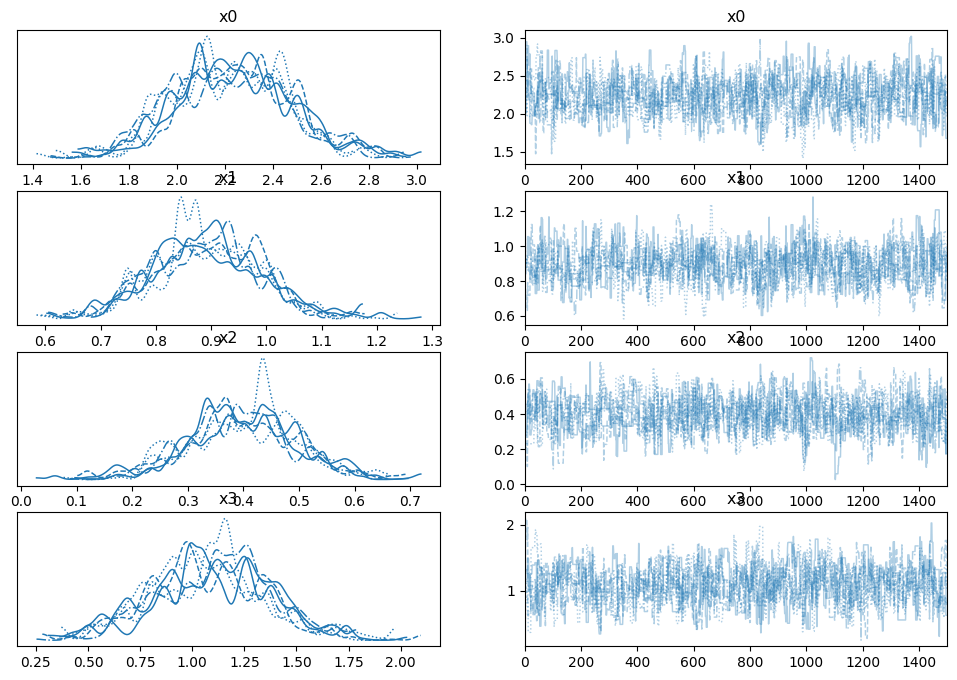

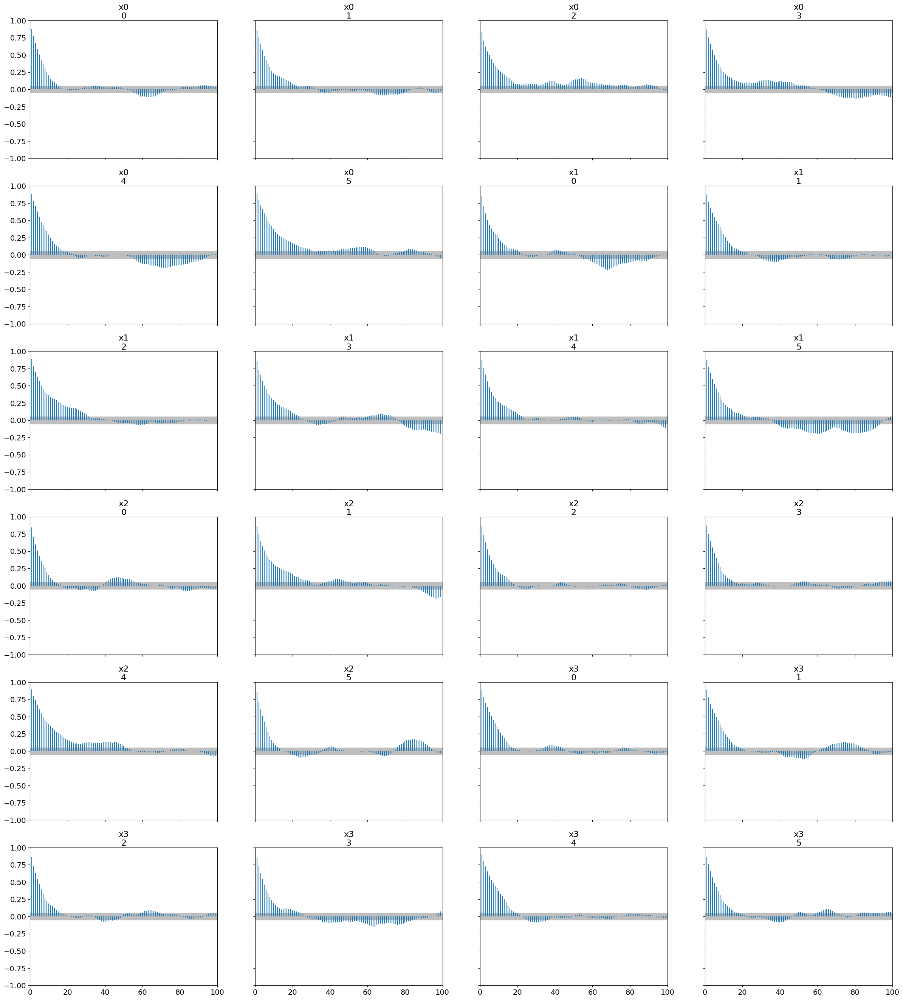

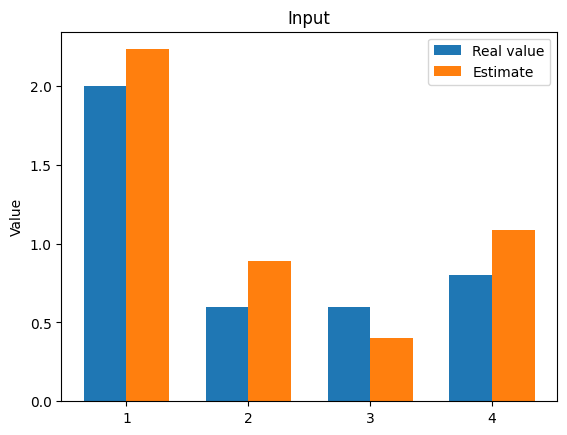

The function param_inverse took 2969.019222021103 seconds.
noise 0.5
nb.data 15
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.14: 100%|██████████| 3000/3000 [09:34<00:00,  5.22it/s]


Sampling chain 2/6


Running chain, α = 0.25: 100%|██████████| 3000/3000 [09:38<00:00,  5.19it/s]


Sampling chain 3/6


Running chain, α = 0.18: 100%|██████████| 3000/3000 [09:35<00:00,  5.22it/s]


Sampling chain 4/6


Running chain, α = 0.18: 100%|██████████| 3000/3000 [09:35<00:00,  5.21it/s]


Sampling chain 5/6


Running chain, α = 0.32: 100%|██████████| 3000/3000 [09:29<00:00,  5.27it/s]


Sampling chain 6/6


Running chain, α = 0.20: 100%|██████████| 3000/3000 [09:42<00:00,  5.15it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.104 0.892 0.389 0.979]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.104  0.179   1.743    2.424      0.007    0.005     674.0     770.0   
x1  0.892  0.097   0.705    1.062      0.004    0.003     541.0     722.0   
x2  0.389  0.093   0.217    0.564      0.004    0.003     581.0     877.0   
x3  0.979  0.249   0.498    1.441      0.011    0.008     503.0     768.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.01  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.104 0.292 0.211 0.179]
 the difference between outputs of two models are [0.08232784 0.0378764  0.02110553 0.02766082 0.00199223 0.02965581
 0.0061512  0.03433383 0.04097939 0.14492488 0.31587601 0.28503609
 0.1211738  0.07196236 0.15110219 0.32551861 0.08689344 0.53276253
 0.05787824 0.84059477 0.18089573 0.52445197 0.18361562 0.43029213
 0.09293222 0.20782614 0.02588952 0.05695963 0.00354469 0.00599265]


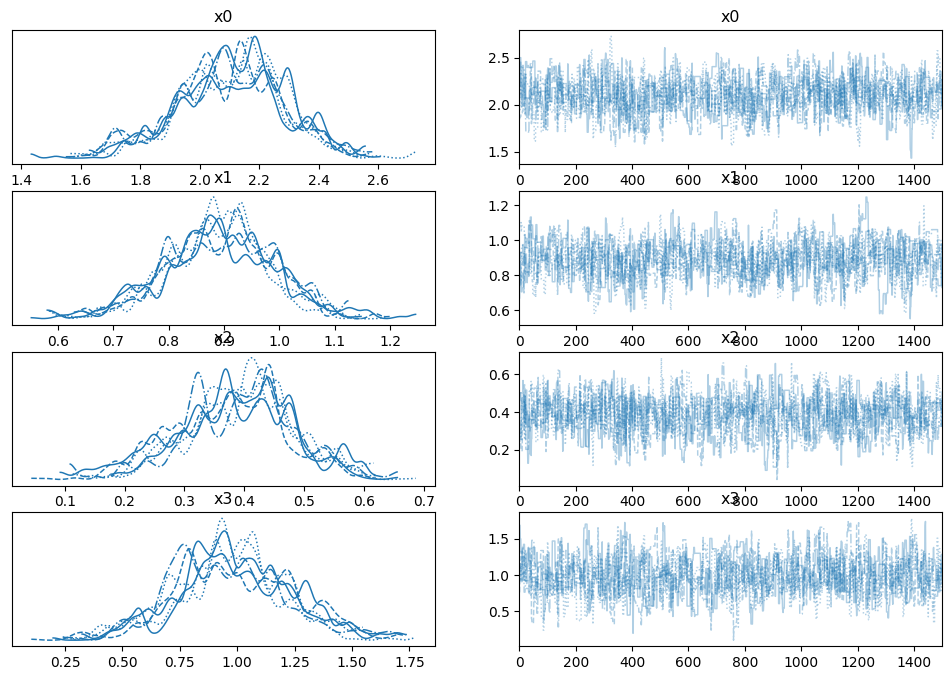

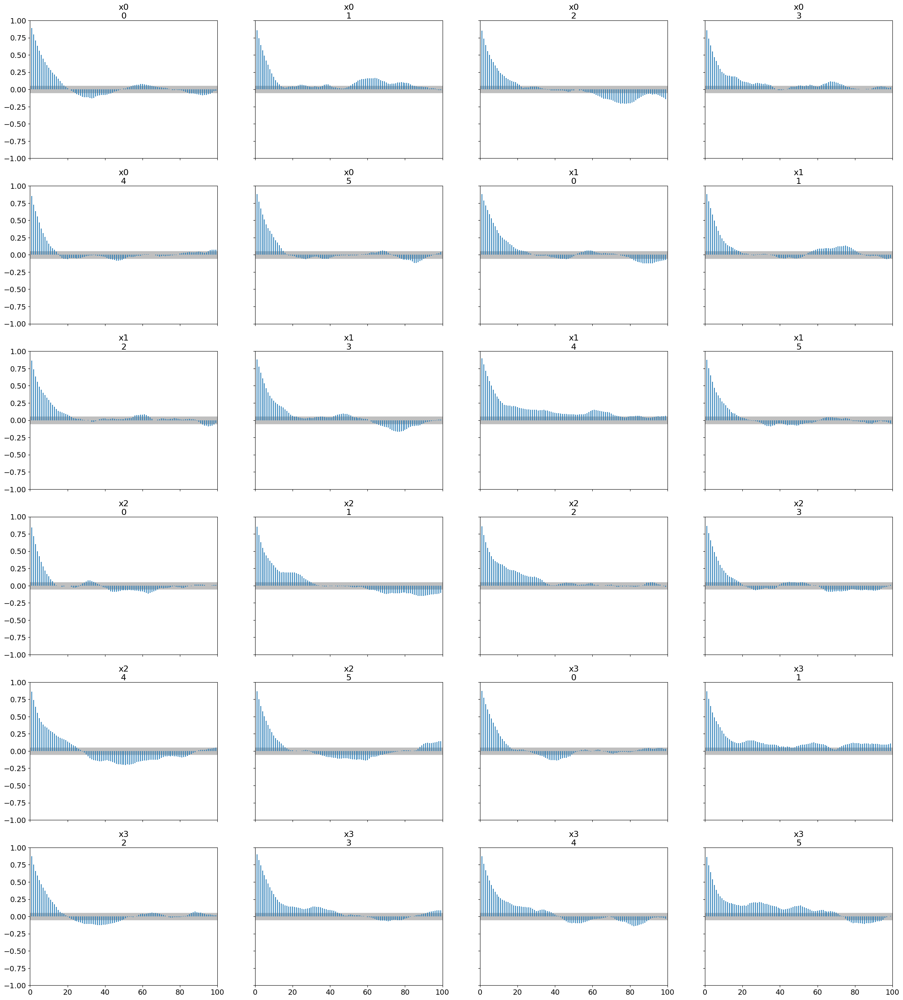

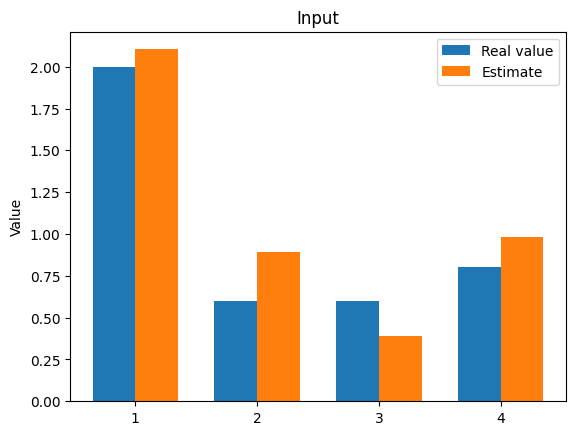

The function param_inverse took 3509.558389186859 seconds.
noise 0.5
nb.data 25
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.25: 100%|██████████| 3000/3000 [09:29<00:00,  5.27it/s]


Sampling chain 2/6


Running chain, α = 0.29: 100%|██████████| 3000/3000 [09:31<00:00,  5.25it/s]


Sampling chain 3/6


Running chain, α = 0.27: 100%|██████████| 3000/3000 [09:29<00:00,  5.27it/s]


Sampling chain 4/6


Running chain, α = 0.21: 100%|██████████| 3000/3000 [09:54<00:00,  5.05it/s]


Sampling chain 5/6


Running chain, α = 0.26: 100%|██████████| 3000/3000 [09:38<00:00,  5.18it/s]


Sampling chain 6/6


Running chain, α = 0.25: 100%|██████████| 3000/3000 [09:38<00:00,  5.19it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.165 0.888 0.396 0.974]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.165  0.175   1.838    2.478      0.008    0.006     490.0     705.0   
x1  0.888  0.098   0.703    1.074      0.004    0.003     563.0     825.0   
x2  0.396  0.099   0.209    0.574      0.004    0.003     529.0     646.0   
x3  0.974  0.251   0.495    1.405      0.009    0.007     774.0     758.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.01  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.165 0.288 0.204 0.174]
 the difference between outputs of two models are [0.07312006 0.02432504 0.02884531 0.01490155 0.01045632 0.01347893
 0.04692984 0.00170344 0.03672767 0.00427437 0.06052089 0.017483
 0.08254242 0.04509377 0.04821014 0.06375575 0.01503181 0.02474689
 0.097682   0.09944248 0.01441902 0.00703526 0.05968541 0.04252338
 0.05581409 0.10306358 0.15733337 0.5191803  0.0477764  0.28962708
 0.04509713 0.55224419 0.06231156 0.409

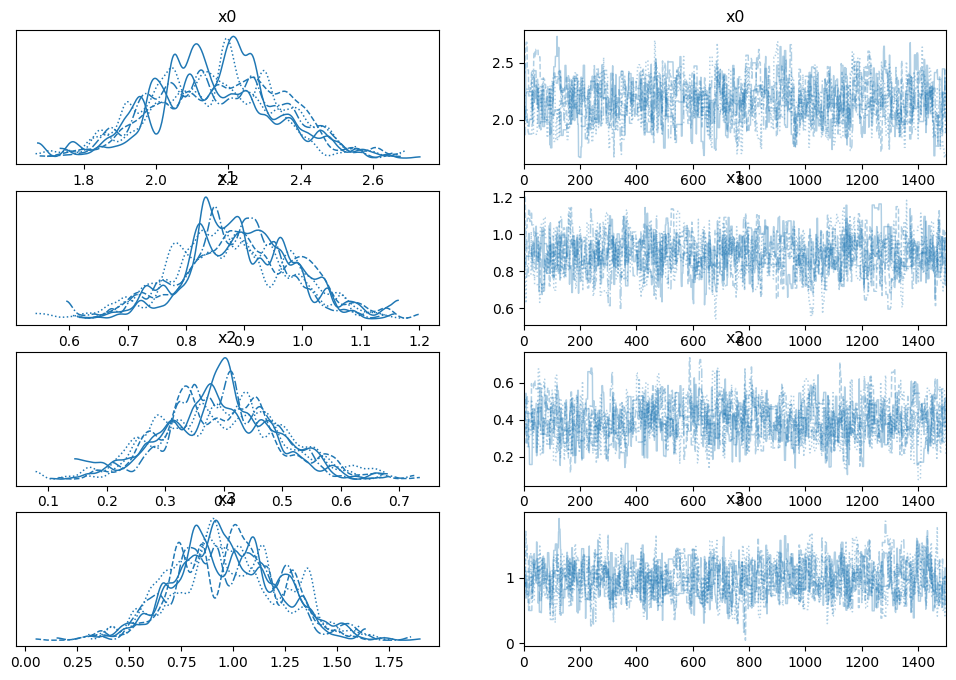

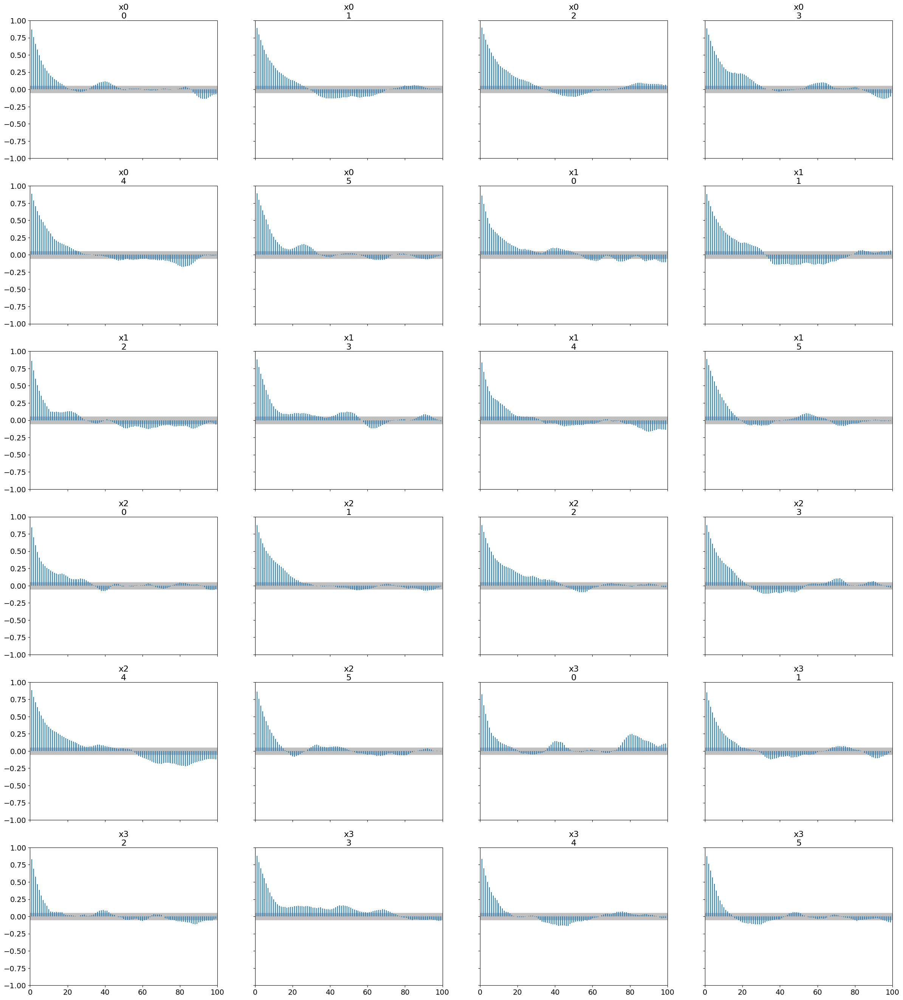

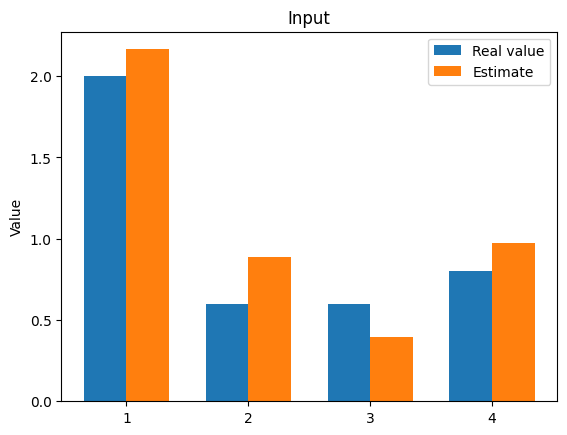

The function param_inverse took 3529.966516017914 seconds.
noise 0.5
nb.data 50
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.22: 100%|██████████| 3000/3000 [10:11<00:00,  4.91it/s]


Sampling chain 2/6


Running chain, α = 0.23: 100%|██████████| 3000/3000 [10:01<00:00,  4.99it/s]


Sampling chain 3/6


Running chain, α = 0.13: 100%|██████████| 3000/3000 [10:04<00:00,  4.96it/s]


Sampling chain 4/6


Running chain, α = 0.21: 100%|██████████| 3000/3000 [10:08<00:00,  4.93it/s]


Sampling chain 5/6


Running chain, α = 0.24: 100%|██████████| 3000/3000 [09:51<00:00,  5.07it/s]


Sampling chain 6/6


Running chain, α = 0.30: 100%|██████████| 3000/3000 [09:39<00:00,  5.17it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.102 0.886 0.401 0.939]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.102  0.135   1.858    2.366      0.005    0.003     796.0     966.0   
x1  0.886  0.095   0.709    1.064      0.004    0.003     634.0     853.0   
x2  0.401  0.097   0.232    0.592      0.004    0.003     517.0     782.0   
x3  0.939  0.222   0.502    1.335      0.010    0.007     498.0     679.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.01  
x3   1.02  
Autocorrelation...
the difference between estimated values [0.102 0.286 0.199 0.139]
 the difference between outputs of two models are [7.92105794e-02 3.20996642e-02 5.96665740e-02 2.31966674e-02
 4.15534973e-02 2.28736699e-02 2.77040005e-02 2.26831138e-02
 1.76315308e-02 2.21845806e-02 1.45602226e-02 2.27609873e-02
 1.49655342e-02 2.59657502e-02 3.33189964e-03 2.43533850e-02
 2.42185593e-03 2.19858885e-02 2.73466110e-03 2.49501467e-02
 1.11415386e-02 3.07040215e-02 7.29560852e-04 2.43716240e-02
 6.991

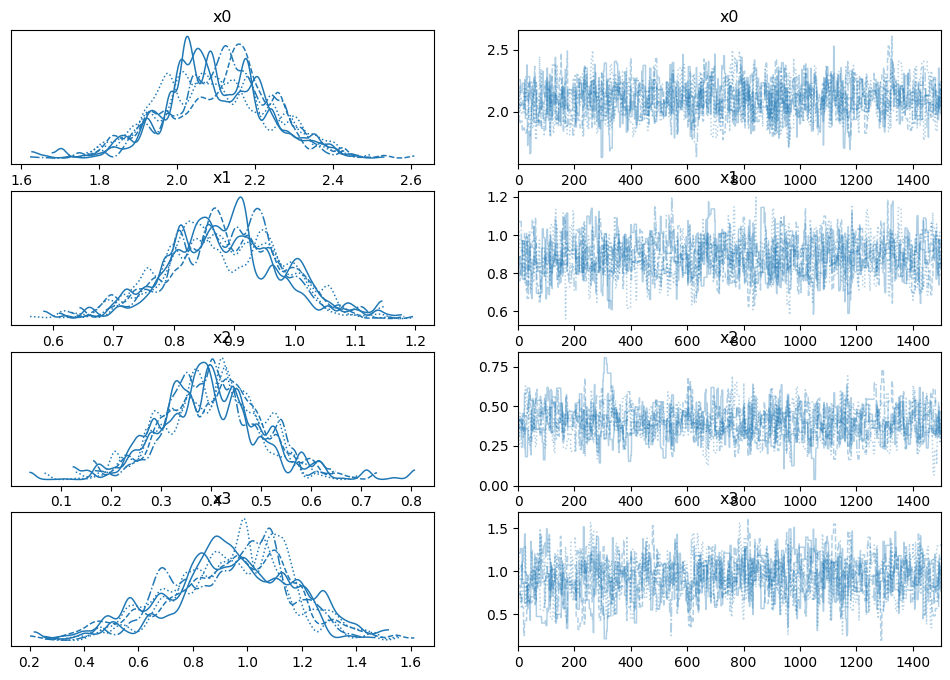

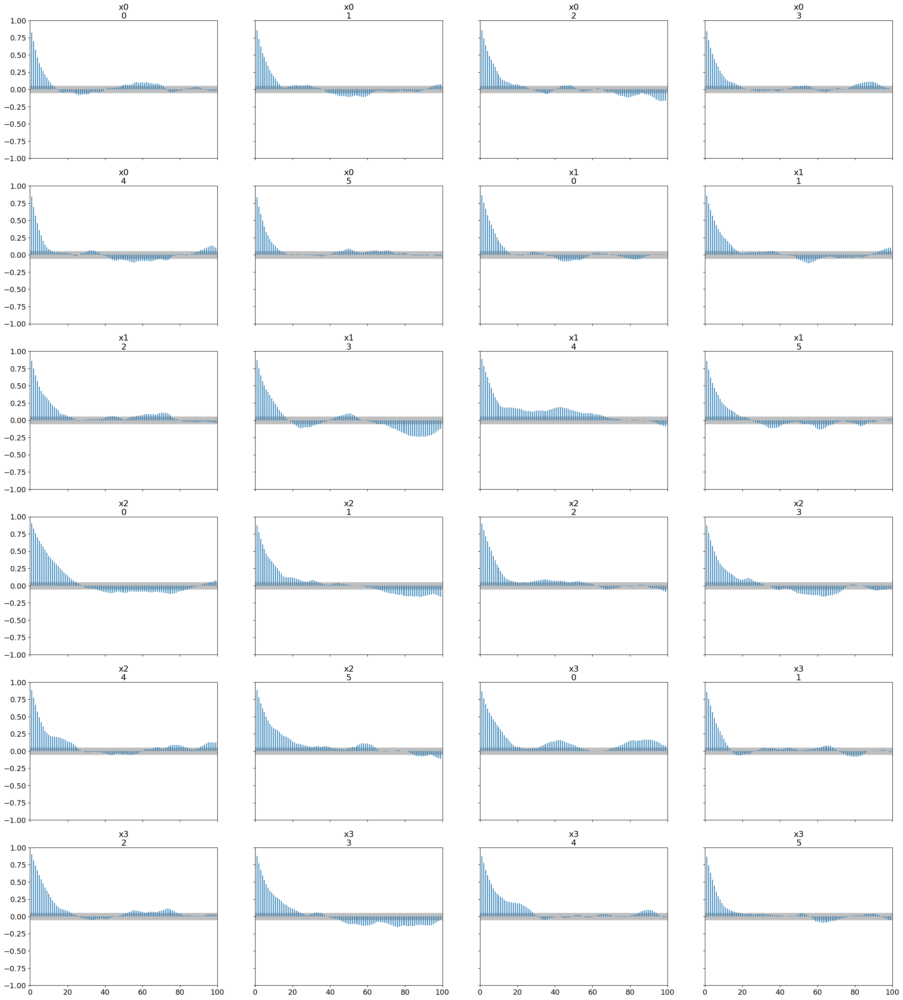

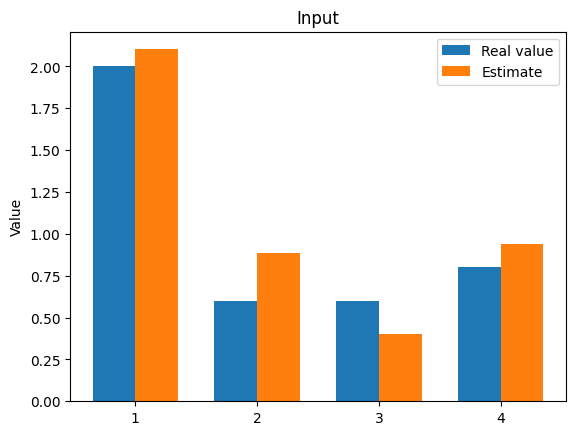

The function param_inverse took 3670.0194087028503 seconds.
noise 1.0
nb.data 5
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.30: 100%|██████████| 3000/3000 [09:09<00:00,  5.46it/s]


Sampling chain 2/6


Running chain, α = 0.22: 100%|██████████| 3000/3000 [09:20<00:00,  5.35it/s]


Sampling chain 3/6


Running chain, α = 0.19: 100%|██████████| 3000/3000 [04:50<00:00, 10.33it/s]


Sampling chain 4/6


Running chain, α = 0.30: 100%|██████████| 3000/3000 [04:34<00:00, 10.93it/s]


Sampling chain 5/6


Running chain, α = 0.26: 100%|██████████| 3000/3000 [04:38<00:00, 10.76it/s]


Sampling chain 6/6


Running chain, α = 0.31: 100%|██████████| 3000/3000 [04:37<00:00, 10.80it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.318 0.895 0.398 1.072]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.318  0.244   1.908    2.814      0.010    0.007     609.0     822.0   
x1  0.895  0.092   0.715    1.058      0.003    0.002     732.0     815.0   
x2  0.398  0.093   0.222    0.574      0.004    0.003     590.0     732.0   
x3  1.072  0.260   0.584    1.567      0.010    0.007     744.0     963.0   

    r_hat  
x0   1.01  
x1   1.02  
x2   1.01  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.318 0.295 0.202 0.272]
 the difference between outputs of two models are [0.06351042 0.00861341 0.23620844 0.16865778 0.01267999 0.01663876
 0.00953317 0.08900285 0.02027774 0.01910424]


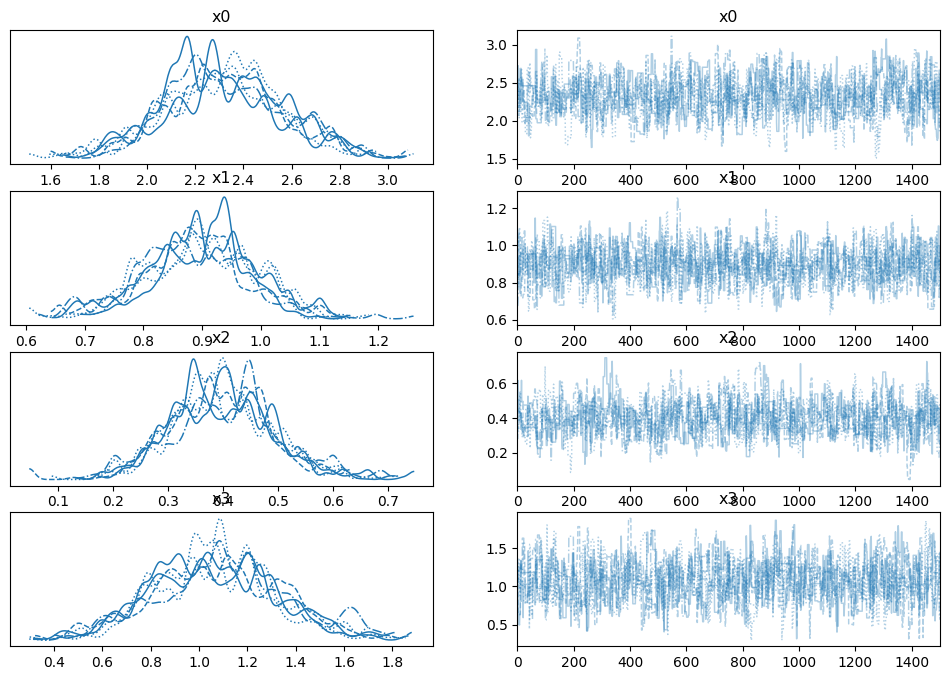

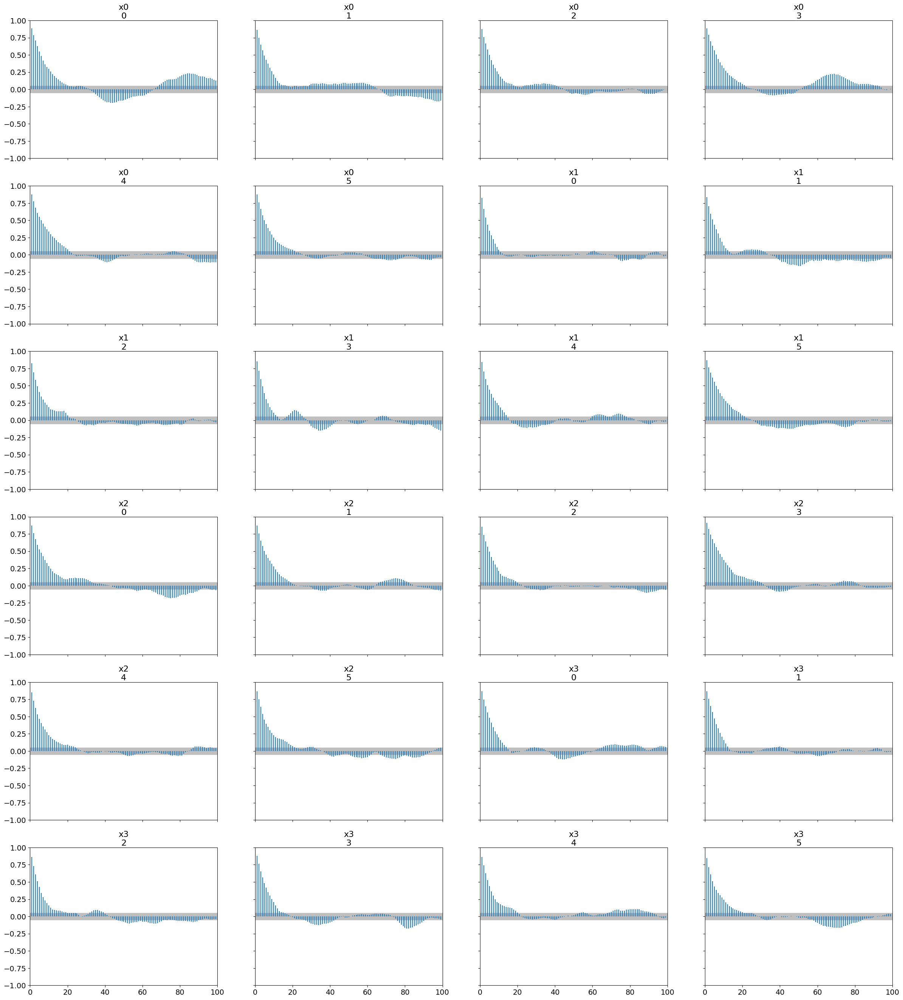

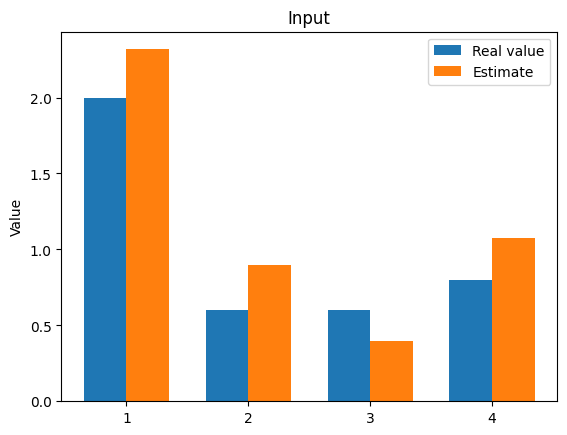

The function param_inverse took 2288.382966041565 seconds.
noise 1.0
nb.data 15
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.27: 100%|██████████| 3000/3000 [04:37<00:00, 10.80it/s]


Sampling chain 2/6


Running chain, α = 0.22: 100%|██████████| 3000/3000 [04:37<00:00, 10.80it/s]


Sampling chain 3/6


Running chain, α = 0.21: 100%|██████████| 3000/3000 [04:37<00:00, 10.82it/s]


Sampling chain 4/6


Running chain, α = 0.28: 100%|██████████| 3000/3000 [04:37<00:00, 10.80it/s]


Sampling chain 5/6


Running chain, α = 0.25: 100%|██████████| 3000/3000 [04:38<00:00, 10.79it/s]


Sampling chain 6/6


Running chain, α = 0.20: 100%|██████████| 3000/3000 [04:37<00:00, 10.82it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.15  0.897 0.39  1.002]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.150  0.181   1.786    2.460      0.007    0.005     757.0     675.0   
x1  0.897  0.095   0.714    1.058      0.004    0.003     566.0     843.0   
x2  0.390  0.091   0.234    0.571      0.004    0.003     526.0     939.0   
x3  1.002  0.259   0.527    1.500      0.010    0.007     723.0    1086.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.01  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.15  0.297 0.21  0.202]
 the difference between outputs of two models are [0.08067179 0.03262466 0.00806022 0.02200255 0.02176189 0.01502562
 0.03902125 0.00297344 0.01441622 0.02432203 0.15515852 0.1334672
 0.08738023 0.05156136 0.11275131 0.23305607 0.07472074 0.44466782
 0.03888981 0.74600506 0.15293311 0.46244287 0.15804583 0.38463187
 0.08115798 0.19475913 0.02001762 0.05729508 0.00093722 0.00961661]


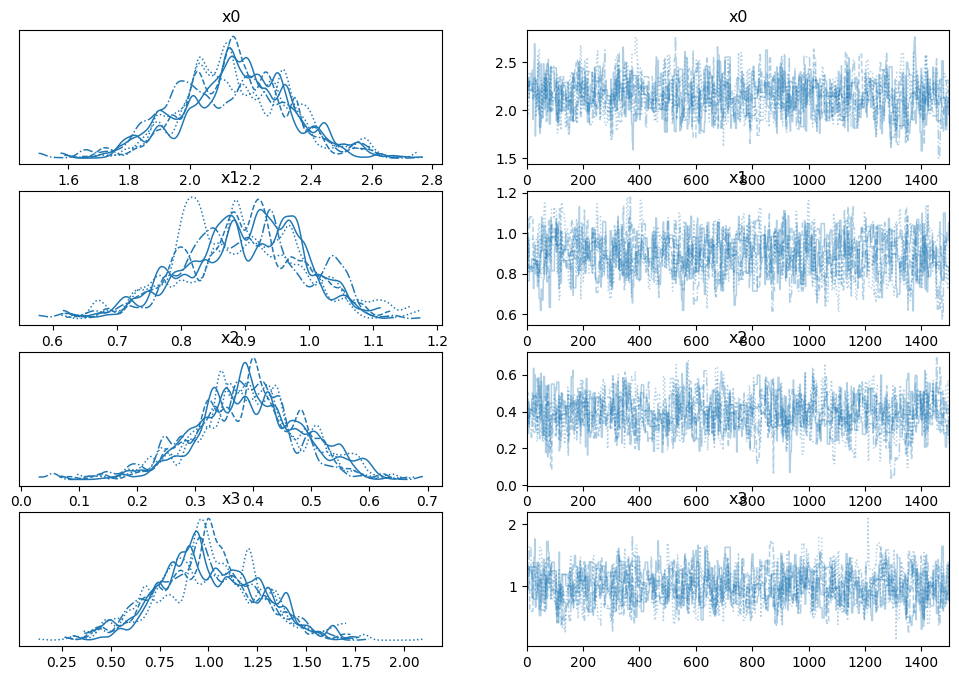

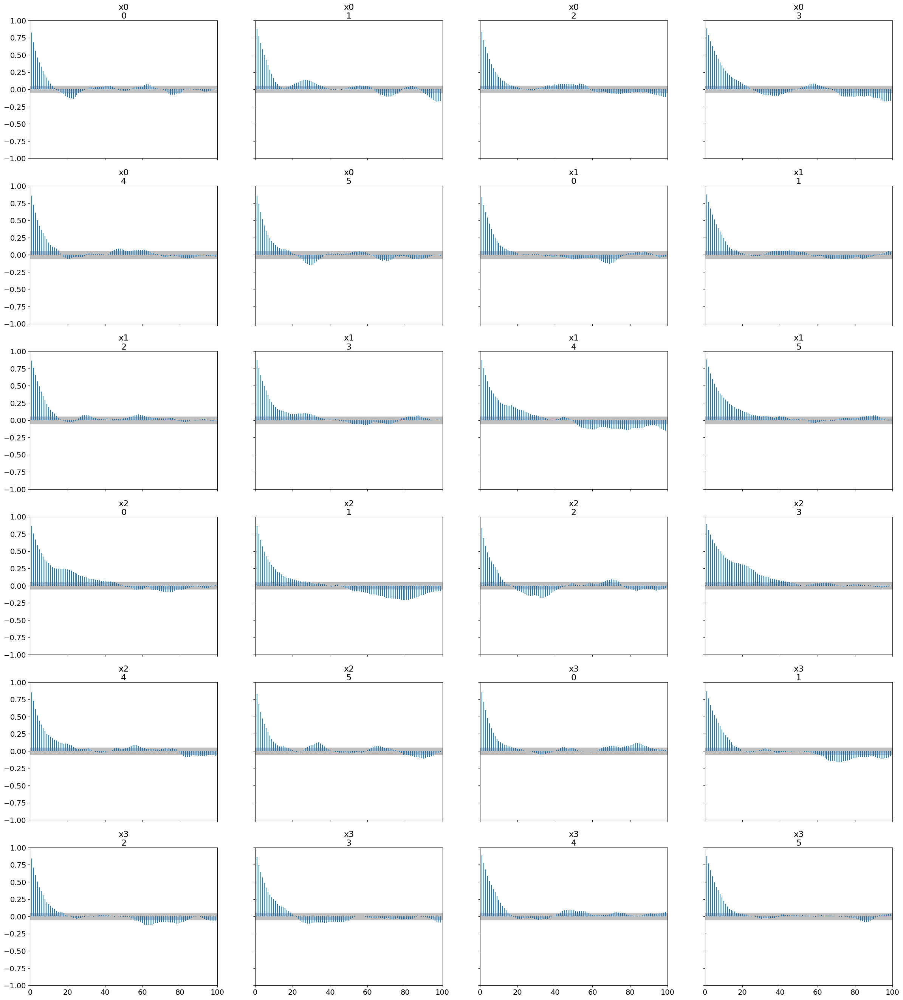

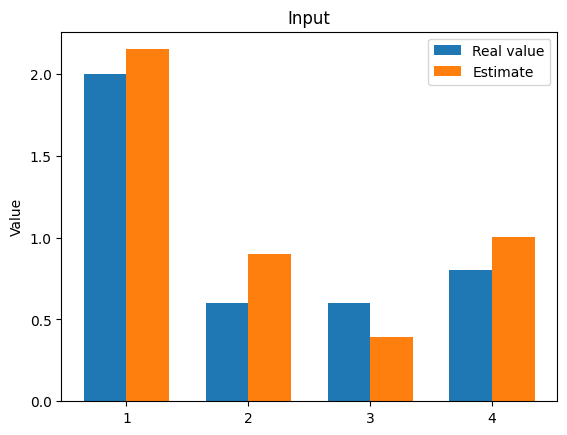

The function param_inverse took 1699.8467140197754 seconds.
noise 1.0
nb.data 25
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.26: 100%|██████████| 3000/3000 [04:38<00:00, 10.78it/s]


Sampling chain 2/6


Running chain, α = 0.26: 100%|██████████| 3000/3000 [04:38<00:00, 10.79it/s]


Sampling chain 3/6


Running chain, α = 0.24: 100%|██████████| 3000/3000 [04:37<00:00, 10.82it/s]


Sampling chain 4/6


Running chain, α = 0.27: 100%|██████████| 3000/3000 [04:37<00:00, 10.79it/s]


Sampling chain 5/6


Running chain, α = 0.19: 100%|██████████| 3000/3000 [04:37<00:00, 10.80it/s]


Sampling chain 6/6


Running chain, α = 0.25: 100%|██████████| 3000/3000 [04:38<00:00, 10.78it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.207 0.899 0.402 1.052]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.207  0.168   1.926    2.562      0.007    0.005     566.0     682.0   
x1  0.899  0.093   0.741    1.094      0.004    0.003     671.0     946.0   
x2  0.402  0.094   0.222    0.561      0.003    0.002     736.0     936.0   
x3  1.052  0.240   0.608    1.511      0.010    0.007     581.0     898.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.02  
x3   1.02  
Autocorrelation...
the difference between estimated values [0.207 0.299 0.198 0.252]
 the difference between outputs of two models are [0.08172727 0.02949306 0.02670741 0.01907173 0.02620411 0.01677561
 0.08246469 0.003398   0.05349517 0.00829536 0.08066154 0.02325511
 0.10848188 0.05870056 0.05540323 0.06276178 0.03084469 0.01385117
 0.0740695  0.08109999 0.05049282 0.02722454 0.09469646 0.07232952
 0.12000084 0.24990416 0.20728707 0.74402905 0.08045652 0.52739763
 0.04033035 0.88531685 0.11857167 0.6

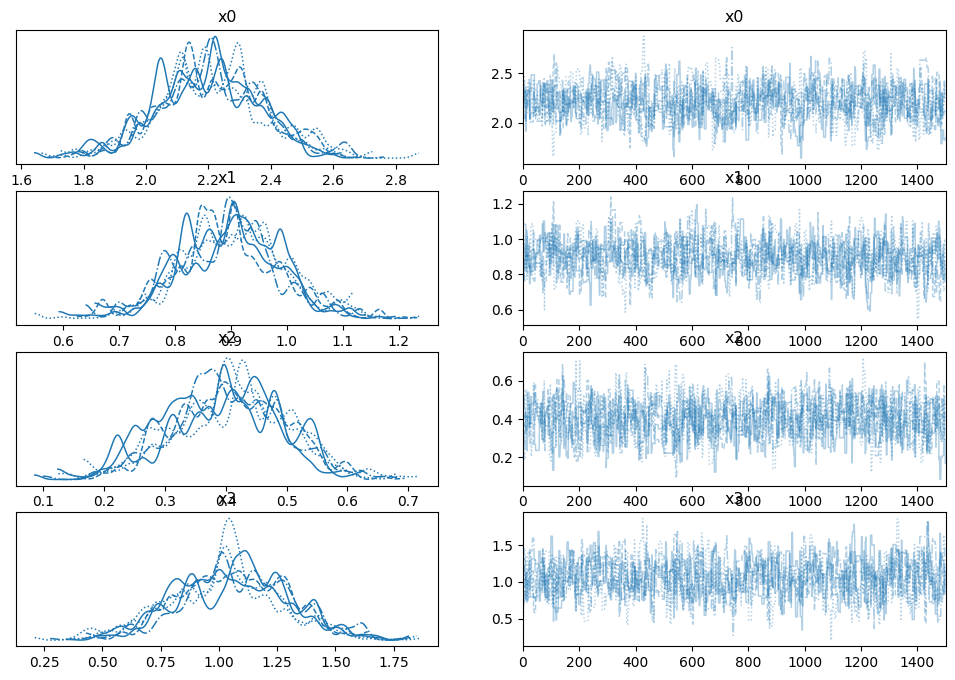

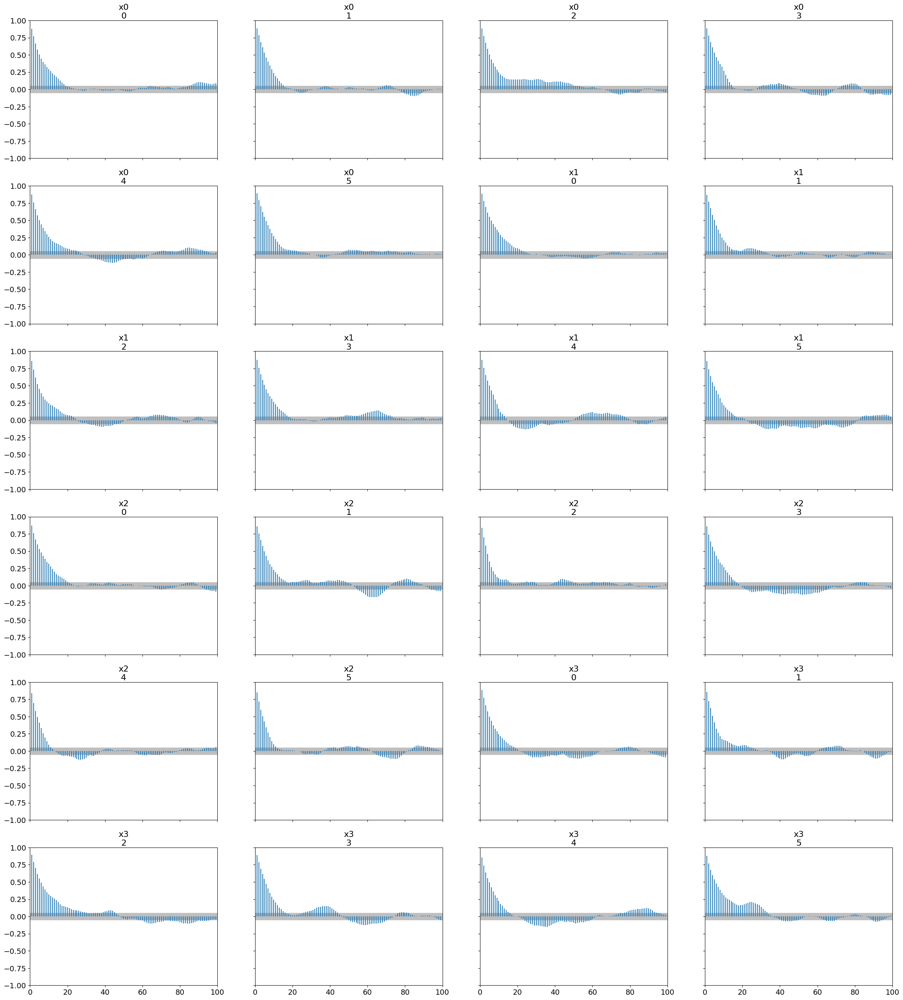

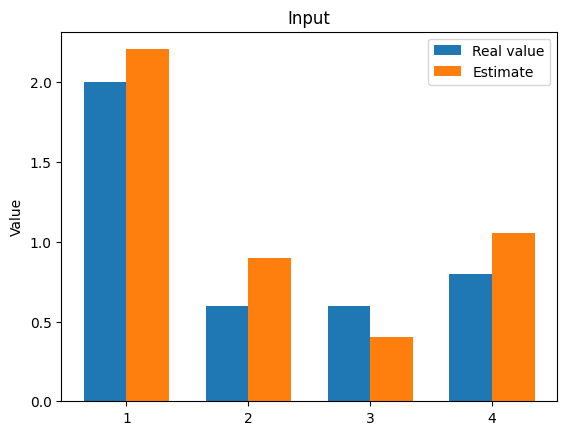

The function param_inverse took 1700.5230717658997 seconds.
noise 1.0
nb.data 50
real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.23: 100%|██████████| 3000/3000 [04:51<00:00, 10.28it/s]


Sampling chain 2/6


Running chain, α = 0.34: 100%|██████████| 3000/3000 [04:52<00:00, 10.26it/s]


Sampling chain 3/6


Running chain, α = 0.28: 100%|██████████| 3000/3000 [04:51<00:00, 10.29it/s]


Sampling chain 4/6


Running chain, α = 0.32: 100%|██████████| 3000/3000 [04:51<00:00, 10.27it/s]


Sampling chain 5/6


Running chain, α = 0.21: 100%|██████████| 3000/3000 [04:53<00:00, 10.21it/s]


Sampling chain 6/6


Running chain, α = 0.26: 100%|██████████| 3000/3000 [04:51<00:00, 10.27it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.082 0.898 0.385 0.927]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.082  0.132   1.836    2.326      0.005    0.003     786.0    1214.0   
x1  0.898  0.092   0.728    1.071      0.004    0.003     660.0     934.0   
x2  0.385  0.089   0.217    0.547      0.003    0.002     738.0    1066.0   
x3  0.927  0.217   0.527    1.342      0.008    0.006     722.0     990.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.01  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.082 0.298 0.215 0.127]
 the difference between outputs of two models are [0.08110255 0.03495345 0.06287205 0.02607968 0.04592967 0.02580556
 0.03393936 0.02568153 0.028283   0.02547207 0.03530431 0.02819341
 0.0383234  0.03517365 0.01549292 0.03211474 0.00863433 0.03082711
 0.01754999 0.03650939 0.03094721 0.04465806 0.01856279 0.03888166
 0.01378584 0.03731108 0.03089619 0.06071591 0.0553751  0.16905093
 0.04929018 0.26194239 0.2148695  0.2

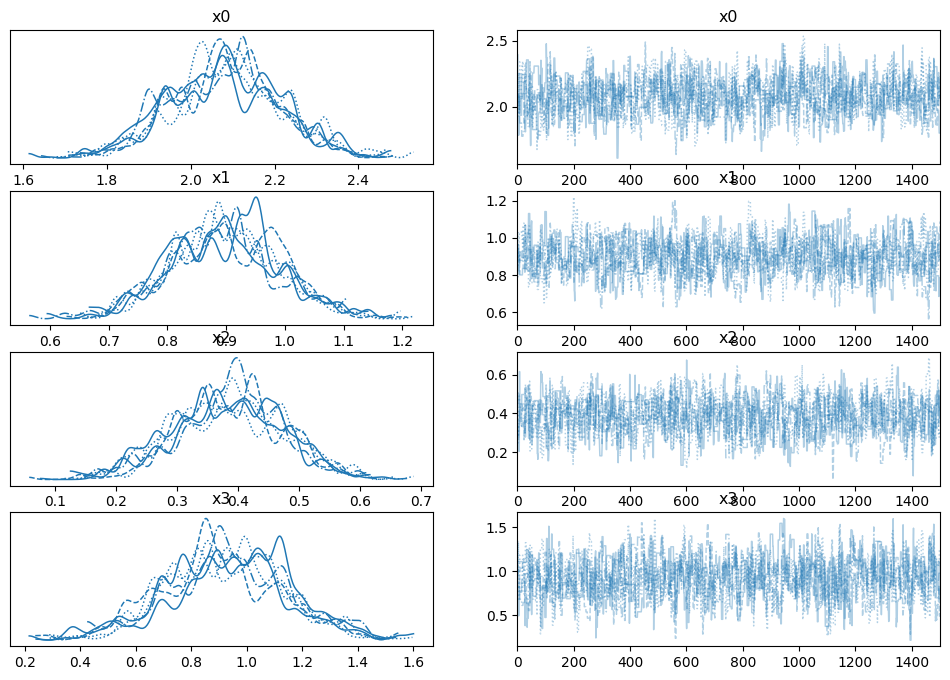

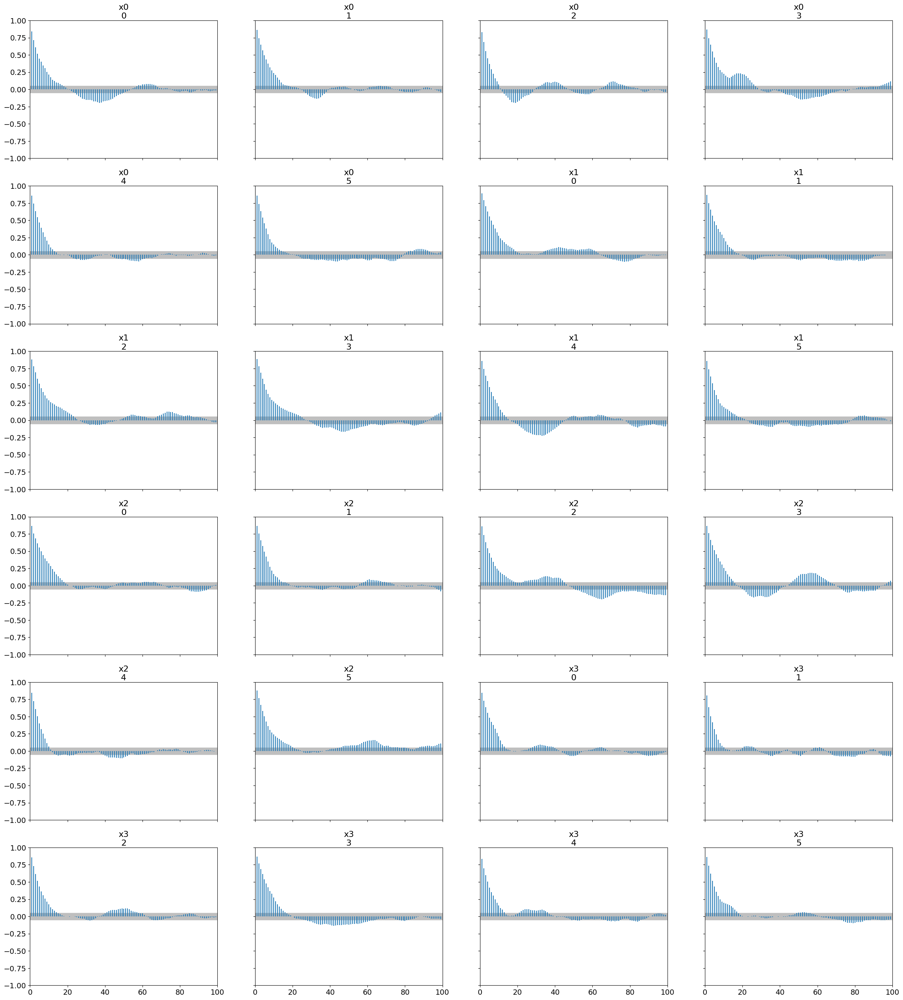

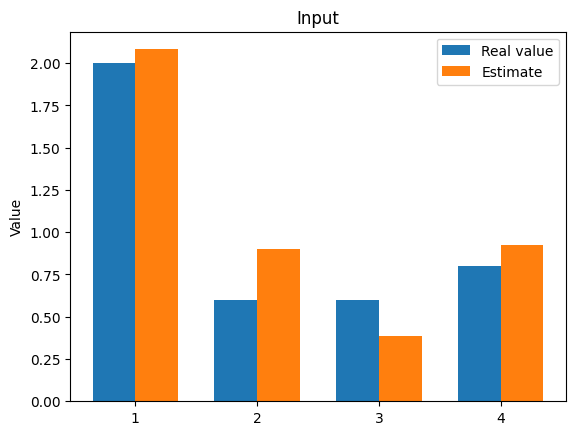

The function param_inverse took 1806.5853426456451 seconds.


In [ ]:
# true parameters
sigma_noise=[0.5,1.]
n_data=[5,15,25,50]
parameters=np.array([2.,0.6,0.6,0.8])

mean_prior=np.array([2.3,0.9,0.4,1.1])
cov_prior=np.diag([ 0.1, 0.01, 0.01, 0.1])
# cov_linkelihood
sigma=1.5

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =3000
burnin = 1500
n_chains=6

for noise in range(len(sigma_noise)):
    for n in range(len(n_data)):
        print(f"noise {sigma_noise[noise]}")
        print(f"nb.data {n_data[n]}")


        t_eval=np.linspace(0.,6.,n_data[n]).reshape(-1,1)
# prior


        closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
        nearest_x=data_HF[closest_indices,0]
        y_obs=data_HF[closest_indices,1:3] # chekc se giusto

        estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise[noise], cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="AM")



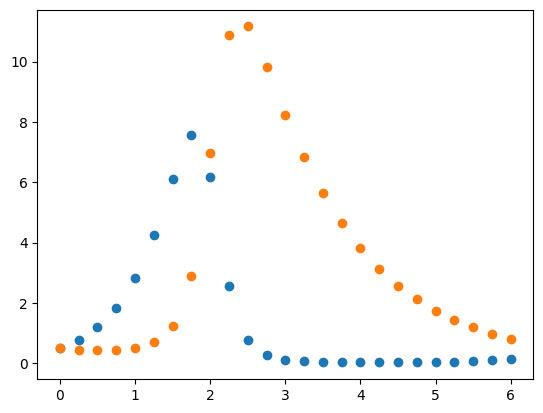

In [ ]:
plt.plot(nearest_x,y_obs[:,0],'o')
plt.plot(nearest_x,y_obs[:,1],'o')

real values are [2.  0.6 0.6 0.8]


Sampling chain 1/4


Running chain, α = 0.24: 100%|██████████| 4000/4000 [10:03<00:00,  6.62it/s]


Sampling chain 2/4


Running chain, α = 0.24: 100%|██████████| 4000/4000 [07:33<00:00,  8.83it/s]


Sampling chain 3/4


Running chain, α = 0.28: 100%|██████████| 4000/4000 [06:21<00:00, 10.48it/s]


Sampling chain 4/4


Running chain, α = 0.21: 100%|██████████| 4000/4000 [06:54<00:00,  9.65it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.283 0.995 0.403 1.097]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.283  0.029   2.225    2.337      0.001    0.001     726.0    1100.0   
x1  0.995  0.211   0.564    1.344      0.009    0.006     556.0     715.0   
x2  0.403  0.216   0.037    0.830      0.009    0.007     555.0     774.0   
x3  1.097  0.032   1.038    1.157      0.001    0.001     520.0     845.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.00  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.283 0.395 0.197 0.297]
 the difference between outputs of two models are [5.56389987e-02 4.05332446e-03 6.58839941e-02 8.54977965e-03
 2.27128267e-02 2.42300928e-02 1.26481056e-02 2.14594007e-02
 1.19329929e-01 1.21659040e-02 3.12373400e-01 8.72719288e-03
 2.85546303e-01 8.66385698e-02 8.93902779e-02 9.27686691e-02
 2.34222412e-02 1.86875343e-01 6.18028641e-01 1.52615261e+00
 4.20429349e-01 5.38825989e-01 3.76721621e-02 2.39779472e-01
 6.108

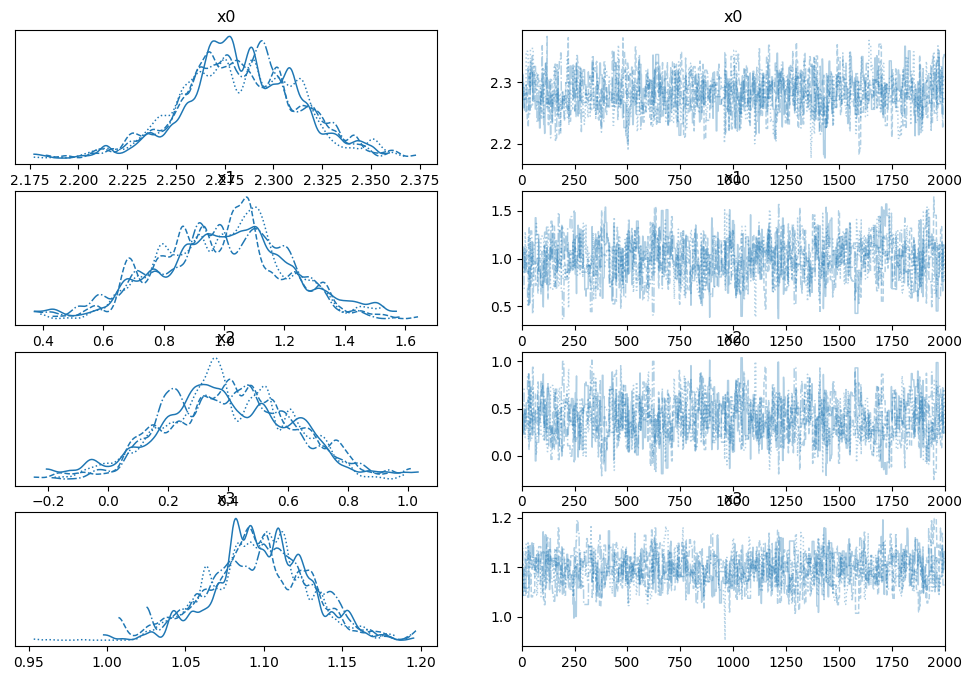

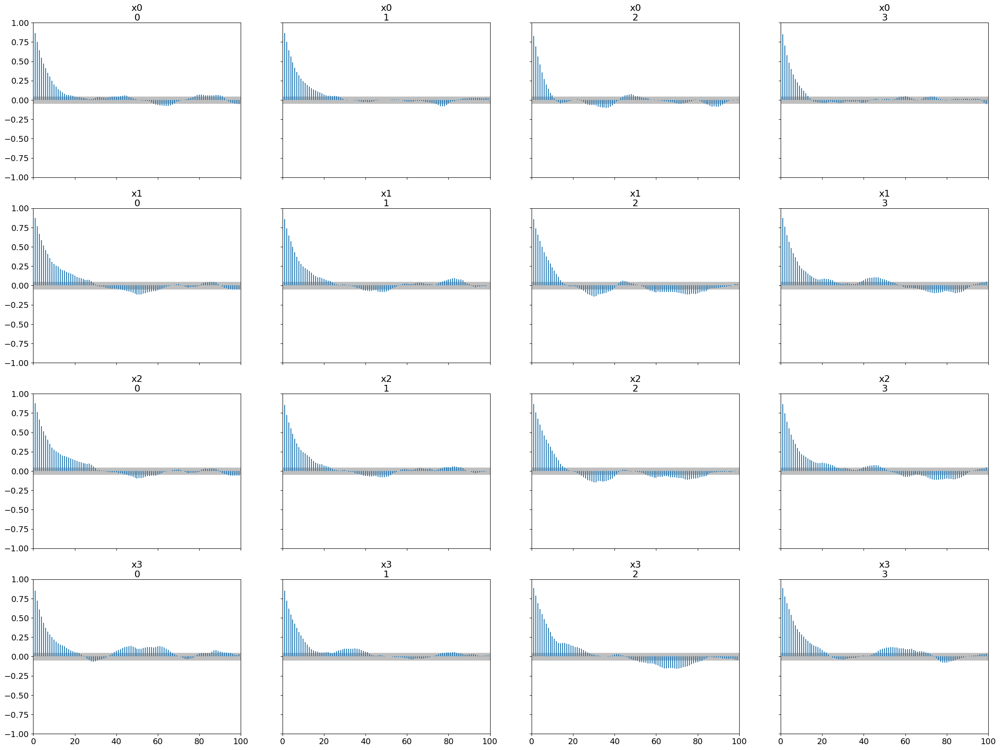

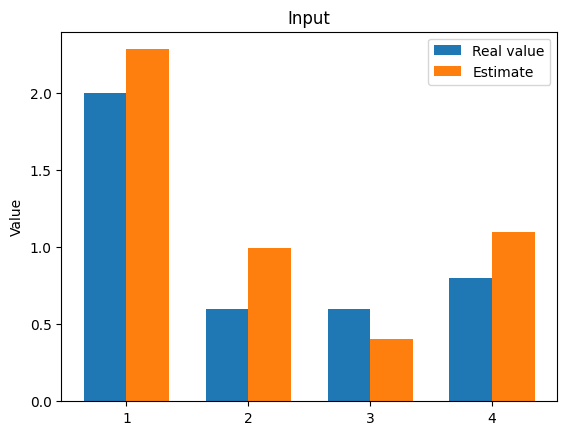

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (4,) and arg 1 with shape (50,).

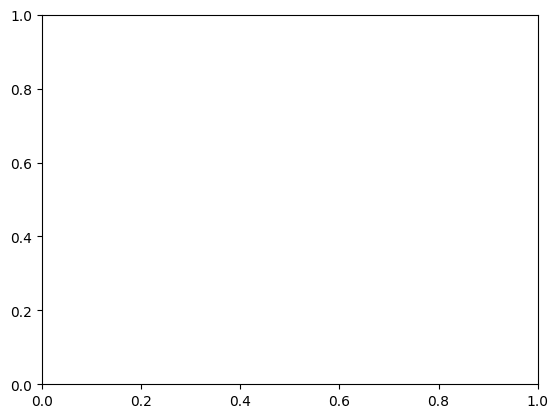

In [ ]:
estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="AM")


real values are [2.  0.6 0.6 0.8]
Sampling chain 1/6


Running chain, α = 0.22: 100%|██████████| 2000/2000 [03:28<00:00,  9.57it/s]


Sampling chain 2/6


Running chain, α = 0.17: 100%|██████████| 2000/2000 [03:30<00:00,  9.49it/s]


Sampling chain 3/6


Running chain, α = 0.26: 100%|██████████| 2000/2000 [03:34<00:00,  9.34it/s]


Sampling chain 4/6


Running chain, α = 0.31: 100%|██████████| 2000/2000 [03:47<00:00,  8.79it/s]


Sampling chain 5/6


Running chain, α = 0.29: 100%|██████████| 2000/2000 [03:30<00:00,  9.48it/s]


Sampling chain 6/6


Running chain, α = 0.25: 100%|██████████| 2000/2000 [03:32<00:00,  9.40it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.167 0.899 0.363 1.068]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.167  0.081   2.011    2.316      0.004    0.003     403.0     475.0   
x1  0.899  0.223   0.508    1.319      0.015    0.010     235.0     339.0   
x2  0.363  0.228  -0.057    0.769      0.012    0.008     369.0     434.0   
x3  1.068  0.099   0.871    1.238      0.005    0.003     481.0     628.0   

    r_hat  
x0   1.01  
x1   1.02  
x2   1.02  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.167 0.299 0.237 0.268]
 the difference between outputs of two models are [4.19465005e-02 7.72887468e-03 5.44644594e-02 9.65356827e-04
 2.24347115e-02 1.41563118e-02 5.50007820e-03 1.24396384e-02
 9.20035839e-02 6.04611635e-03 2.15150833e-01 9.44232941e-03
 1.90971851e-01 6.71601295e-02 8.23678970e-02 1.14142418e-01
 1.43738270e-01 2.42024422e-01 6.76915646e-01 1.19035149e+00
 3.20674300e-01 1.86672211e-01 7.56535530e-02 8.75339508e-02
 4.904

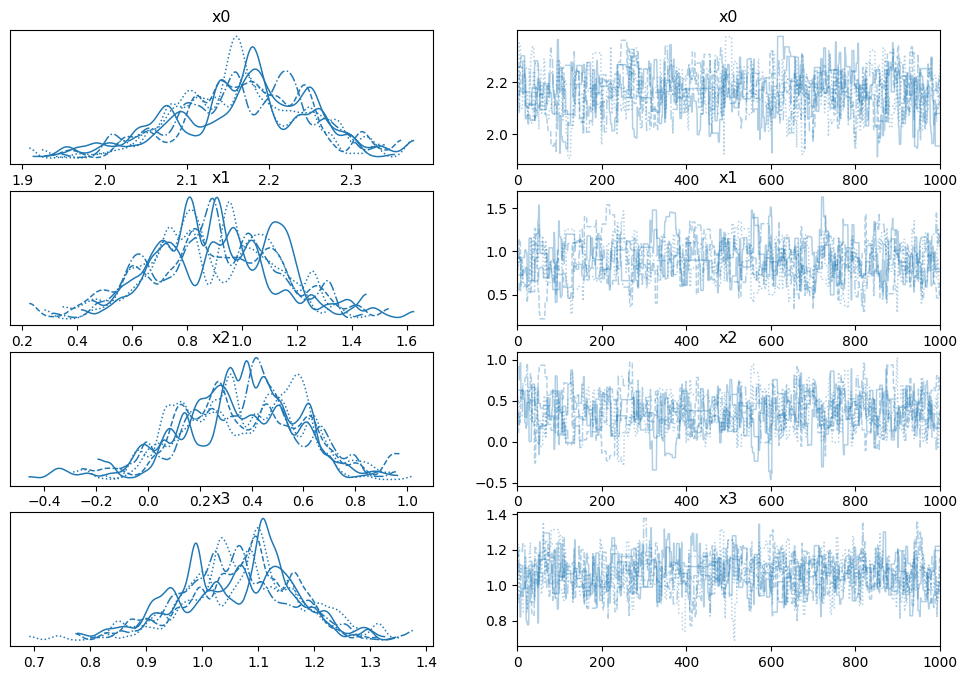

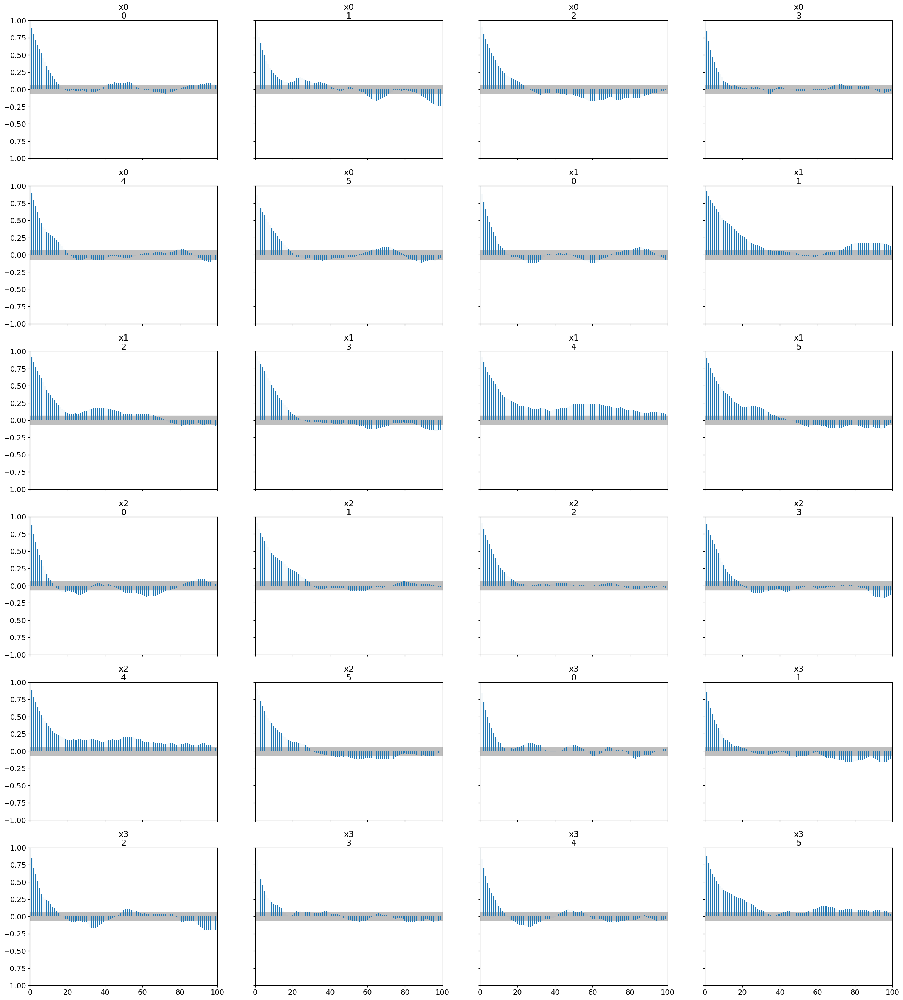

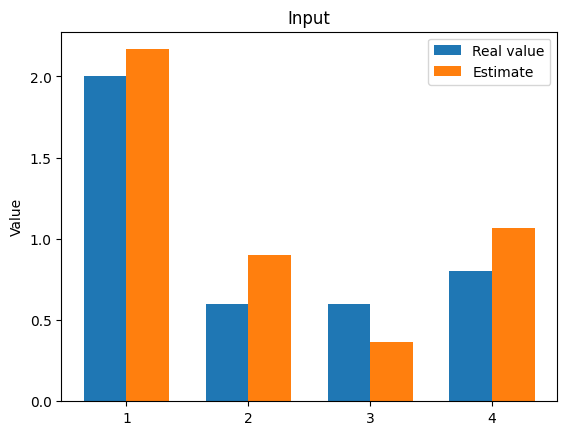

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (4,) and arg 1 with shape (50,).

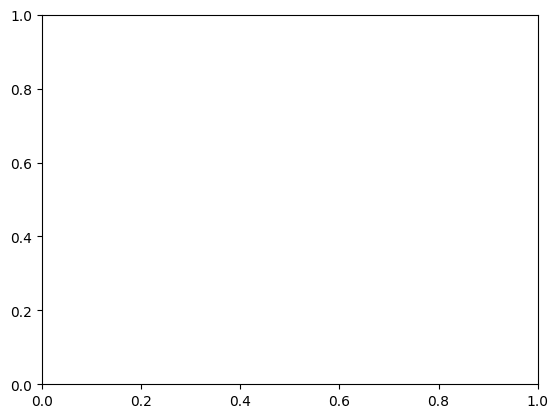

In [ ]:
# true parameters
parameters=np.array([2.,0.6,0.6,0.8])
sigma_noise=0.25

# value data
n_data=25
t_eval=np.linspace(0.,6.,n_data).reshape(-1,1)
# prior
mean_prior=np.array([2.3,0.9,0.35,1.1])
cov_prior=np.diag([ 0.01, 0.1, 0.1, 0.01])
# cov_linkelihood
sigma=1.

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =2000
burnin = 1000
n_chains=6

closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
nearest_x=data_HF[closest_indices,0]
y_obs=data_HF[closest_indices,1:3] # chekc se giusto

estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="AM")


real values are [2.  0.6 0.6 0.8]
Sampling chain 1/5


Running chain, α = 0.15: 100%|██████████| 3000/3000 [04:22<00:00, 11.41it/s]


Sampling chain 2/5


Running chain, α = 0.24: 100%|██████████| 3000/3000 [06:35<00:00,  7.58it/s]


Sampling chain 3/5


Running chain, α = 0.21: 100%|██████████| 3000/3000 [05:38<00:00,  8.86it/s]


Sampling chain 4/5


Running chain, α = 0.28: 100%|██████████| 3000/3000 [04:41<00:00, 10.65it/s]


Sampling chain 5/5


Running chain, α = 0.24: 100%|██████████| 3000/3000 [04:36<00:00, 10.84it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [1.947 0.828 0.241 0.94 ]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  1.947  0.149   1.695    2.250      0.008    0.006     348.0     493.0   
x1  0.828  0.236   0.371    1.233      0.014    0.010     268.0     586.0   
x2  0.241  0.245  -0.232    0.665      0.017    0.013     198.0     321.0   
x3  0.940  0.274   0.460    1.469      0.014    0.010     382.0     395.0   

    r_hat  
x0   1.01  
x1   1.03  
x2   1.03  
x3   1.02  
Autocorrelation...
the difference between estimated values [0.053 0.228 0.359 0.14 ]
 the difference between outputs of two models are [0.01920599 0.01154691 0.03499413 0.00974479 0.03945291 0.00230238
 0.04869819 0.00085476 0.03043318 0.00298077 0.0825901  0.00384629
 0.05678558 0.03588498 0.02844858 0.05976963 0.08561659 0.08668327
 0.02703905 0.0098629  0.04269862 0.03582191 0.01543882 0.0905695
 0.00545388 0.13132477 0.00728548 0.10952663 0.00169325 0.04675674
 0.00401813 0.0309267  0.00360966 0.03

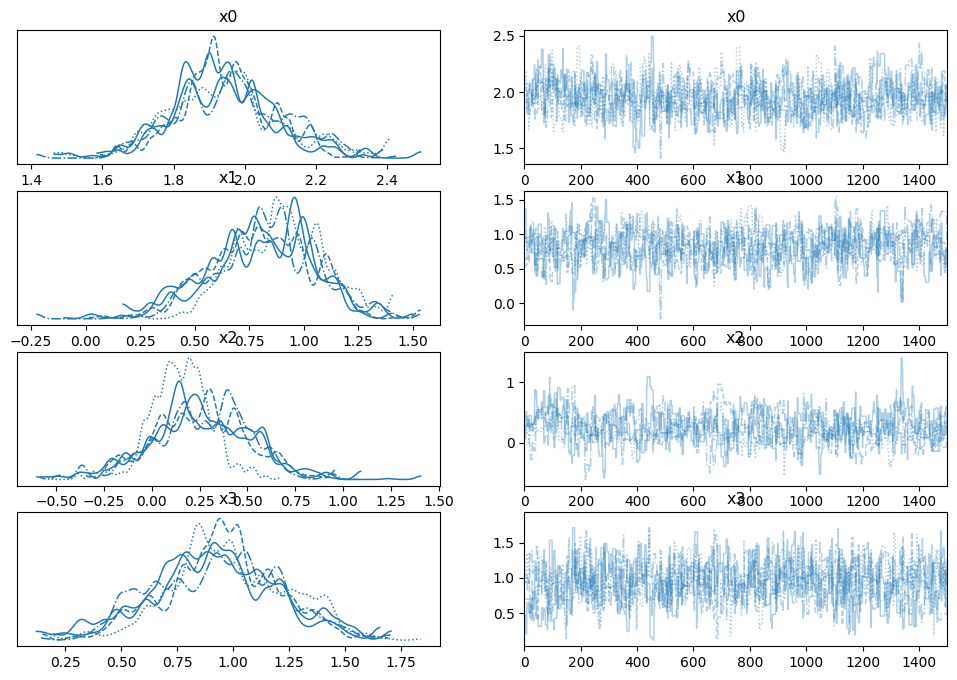

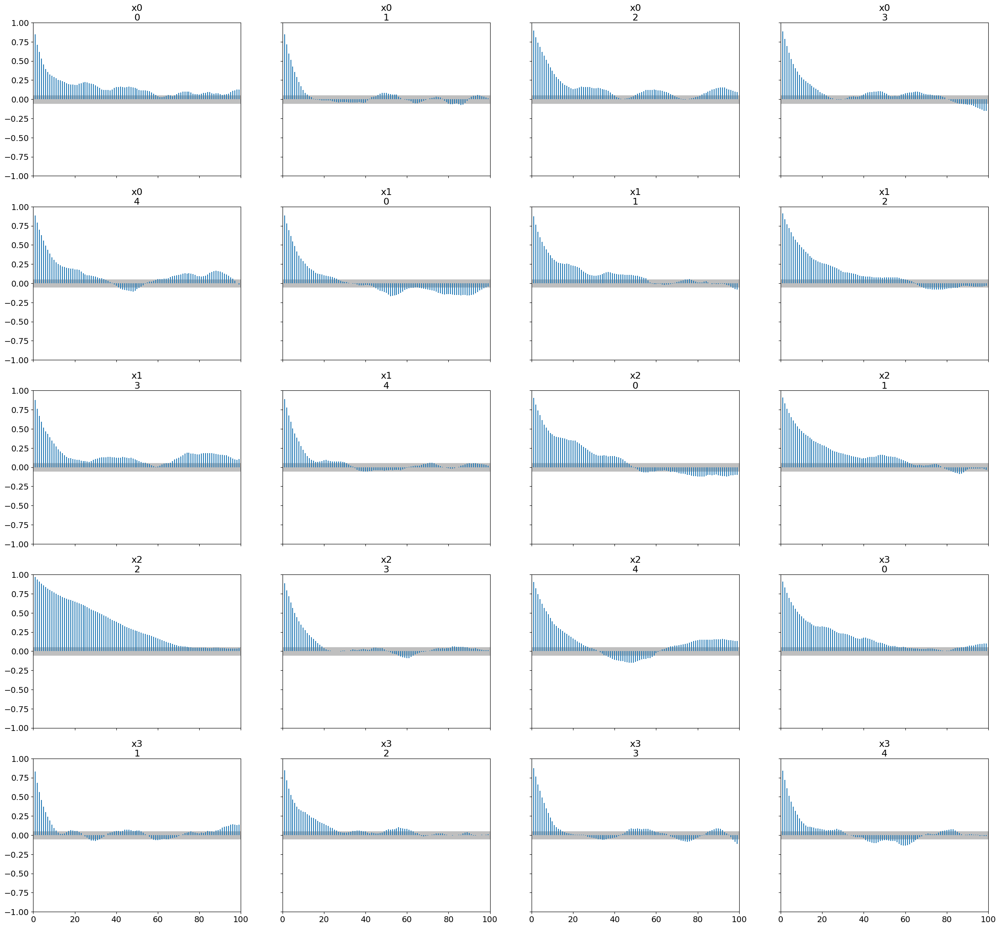

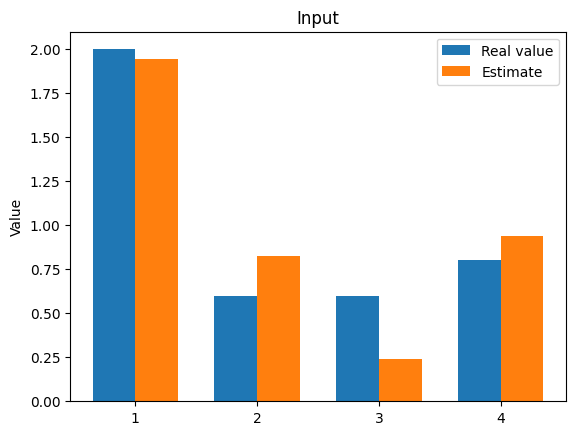

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (4,) and arg 1 with shape (50,).

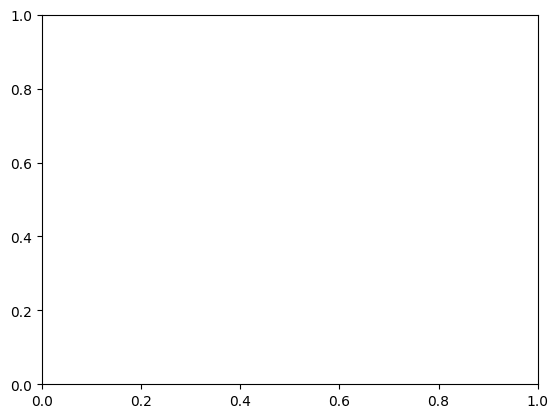

In [ ]:
# true parameters
parameters=np.array([2.,0.6,0.6,0.8])
sigma_noise=0.25

# value data
n_data=25
t_eval=np.linspace(0.,6.,n_data).reshape(-1,1)
# prior
mean_prior=np.array([2.3,0.9,0.35,1.1])
cov_prior=np.diag([ 0.1, 0.1, 0.1, 0.1])
# cov_linkelihood
sigma=1.

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =3000
burnin = 1500
n_chains=5

closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
nearest_x=data_HF[closest_indices,0]
y_obs=data_HF[closest_indices,1:3] # chekc se giusto

estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="AM")


real values are [2.  0.6 0.6 0.8]
Sampling chain 1/5


Running chain, α = 0.27: 100%|██████████| 5000/5000 [07:16<00:00, 11.46it/s]


Sampling chain 2/5


Running chain, α = 0.20: 100%|██████████| 5000/5000 [07:52<00:00, 10.57it/s]


Sampling chain 3/5


Running chain, α = 0.23: 100%|██████████| 5000/5000 [07:52<00:00, 10.58it/s]


Sampling chain 4/5


Running chain, α = 0.31: 100%|██████████| 5000/5000 [07:51<00:00, 10.60it/s]


Sampling chain 5/5


Running chain, α = 0.20: 100%|██████████| 5000/5000 [07:51<00:00, 10.59it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.002 0.877 0.319 0.835]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.002  0.099   1.820    2.200      0.004    0.003     618.0    1047.0   
x1  0.877  0.094   0.693    1.042      0.004    0.003     485.0     623.0   
x2  0.319  0.094   0.145    0.494      0.004    0.003     520.0     875.0   
x3  0.835  0.238   0.411    1.325      0.010    0.007     635.0     699.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.01  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.002 0.277 0.281 0.035]
 the difference between outputs of two models are [0.01864013 0.00790957 0.03300965 0.00683069 0.04350924 0.00053665
 0.06421113 0.0013724  0.04385924 0.00104505 0.06846428 0.00641394
 0.06471968 0.05241883 0.0614171  0.14630961 0.2555418  0.21341896
 0.1512599  0.17421341 0.02119911 0.00627899 0.0099754  0.0294199
 0.00618228 0.02863598 0.00233245 0.03799343 0.00025812 0.03033066
 0.00145912 0.02331352 0.00138682 0.03

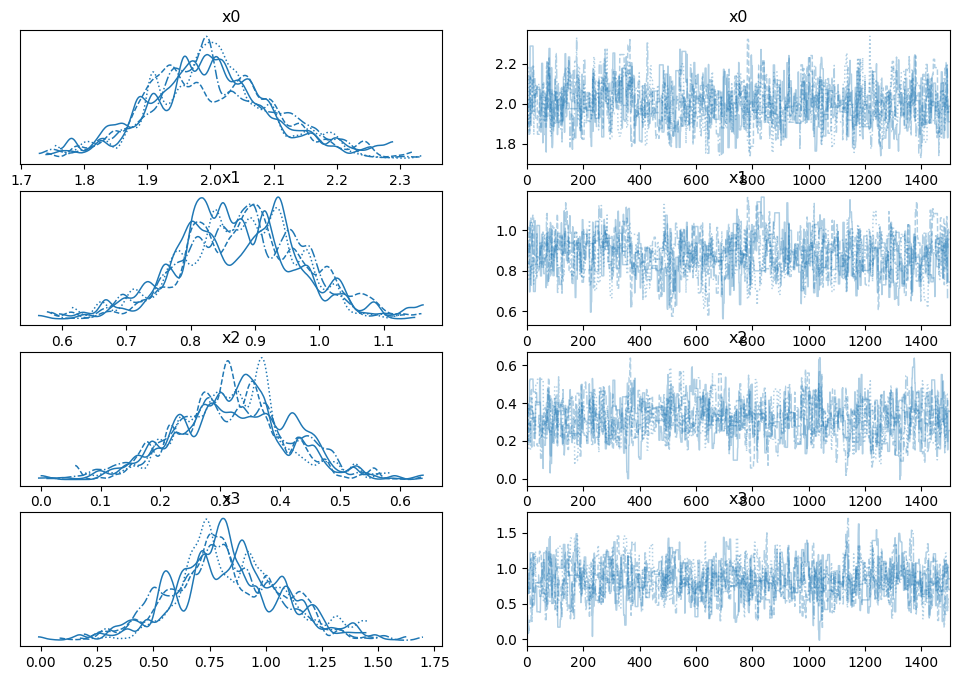

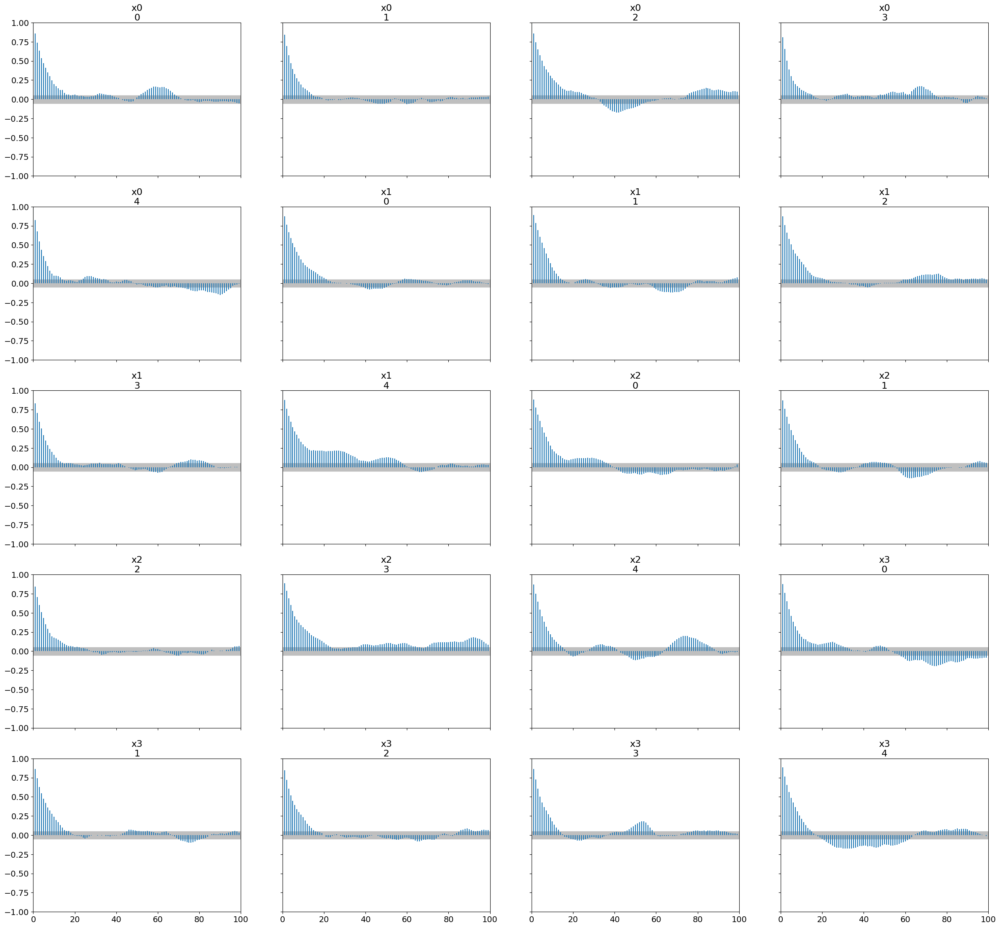

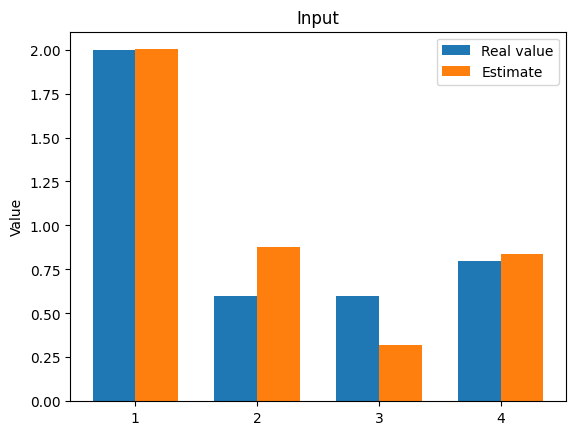

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (4,) and arg 1 with shape (50,).

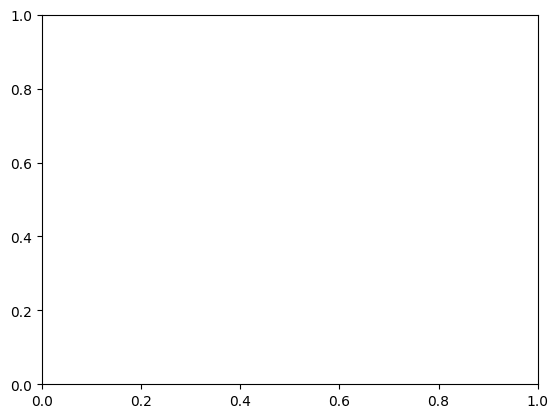

In [ ]:
# true parameters
parameters=np.array([2.,0.6,0.6,0.8])
sigma_noise=0.25

# value data
n_data=25
t_eval=np.linspace(0.,6.,n_data).reshape(-1,1)
# prior
mean_prior=np.array([2.3,0.9,0.35,1.1])
cov_prior=np.diag([ 0.1, 0.01, 0.01, 0.1]) #0.1, 0.05, 0.05, 0.1
# cov_linkelihood
sigma=1.

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =5000
burnin = 3500
n_chains=5

closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
nearest_x=data_HF[closest_indices,0]
y_obs=data_HF[closest_indices,1:3] # chekc se giusto

estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="AM")


real values are [2.  0.6 0.6 0.8]
Sampling chain 1/5


Running chain, α = 0.24: 100%|██████████| 3000/3000 [04:24<00:00, 11.34it/s]


Sampling chain 2/5


Running chain, α = 0.31: 100%|██████████| 3000/3000 [04:37<00:00, 10.79it/s]


Sampling chain 3/5


Running chain, α = 0.30: 100%|██████████| 3000/3000 [05:54<00:00,  8.46it/s]


Sampling chain 4/5


Running chain, α = 0.27: 100%|██████████| 3000/3000 [04:37<00:00, 10.80it/s]


Sampling chain 5/5


Running chain, α = 0.29: 100%|██████████| 3000/3000 [04:32<00:00, 11.00it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.012 0.882 0.331 0.913]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.012  0.123   1.787    2.235      0.005    0.004     535.0     764.0   
x1  0.882  0.090   0.707    1.034      0.005    0.003     374.0     492.0   
x2  0.331  0.090   0.162    0.506      0.004    0.003     456.0     725.0   
x3  0.913  0.251   0.435    1.365      0.010    0.007     608.0     912.0   

    r_hat  
x0   1.01  
x1   1.02  
x2   1.01  
x3   1.00  
Autocorrelation...
the difference between estimated values [0.012 0.282 0.269 0.113]
 the difference between outputs of two models are [2.65194774e-02 1.20363235e-02 4.50304151e-02 1.00895762e-02
 5.67511320e-02 1.66296959e-03 8.00933838e-02 1.15334988e-05
 5.11105061e-02 4.16070223e-03 5.71074486e-02 2.53367424e-03
 1.05261326e-01 9.25048590e-02 1.11485004e-01 2.77780056e-01
 5.17320156e-01 3.96632195e-01 3.34950209e-01 4.57076073e-01
 4.72414494e-03 6.85548782e-02 1.64392591e-03 7.13605881e-02
 4.294

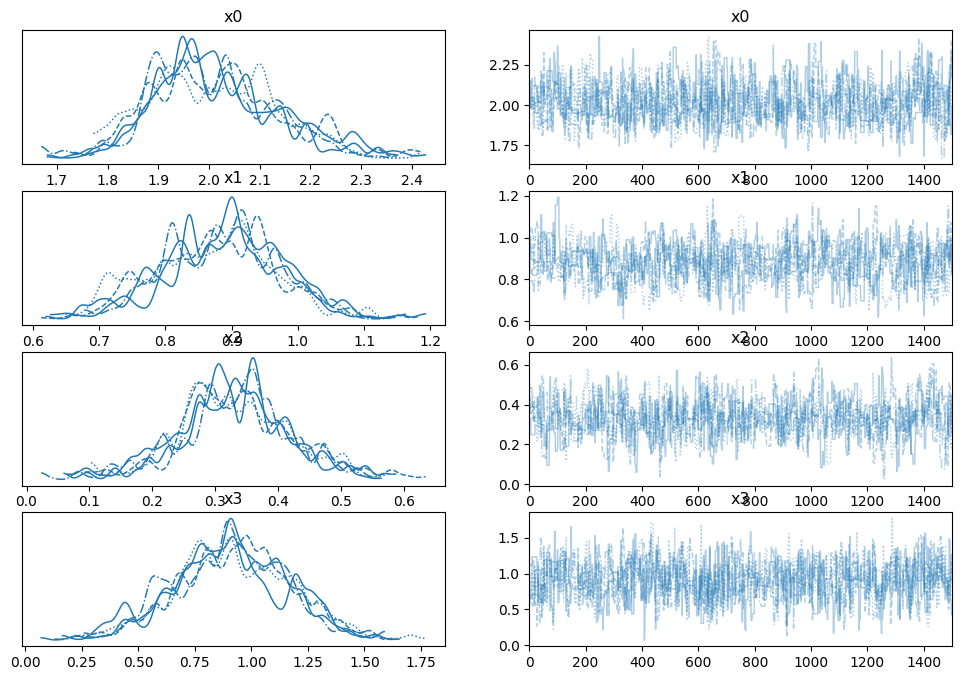

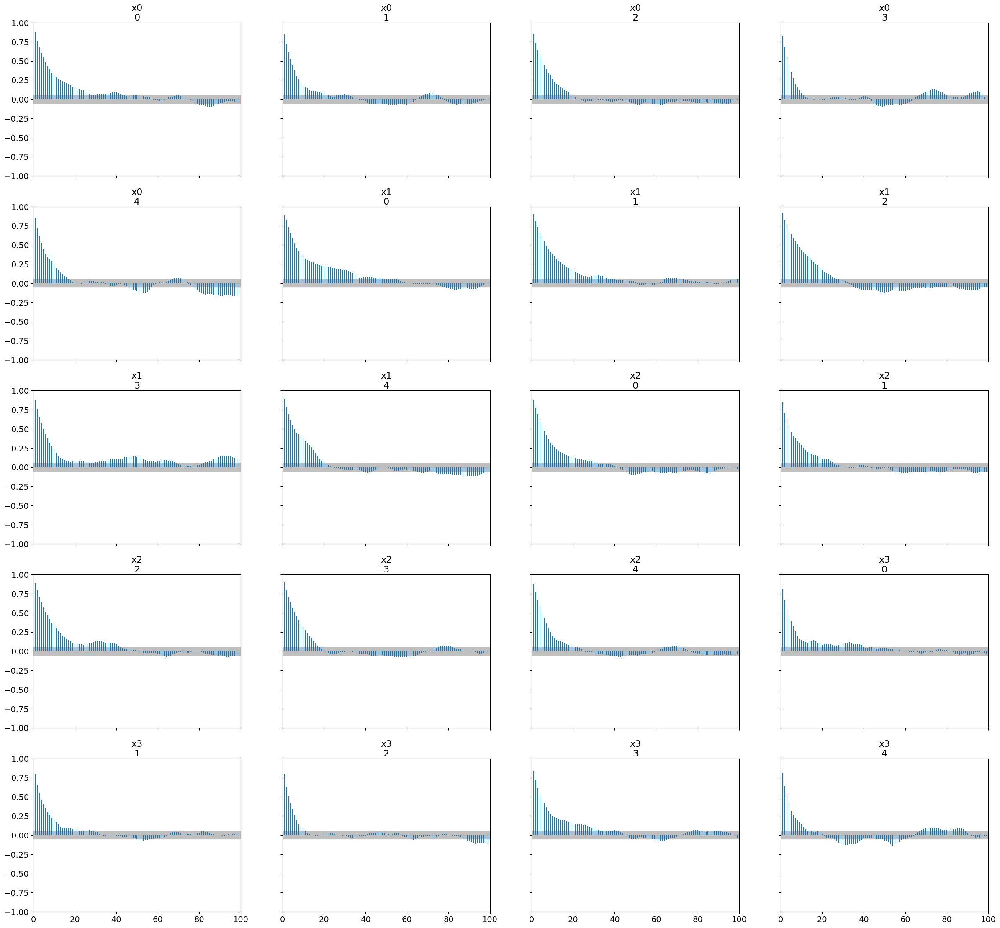

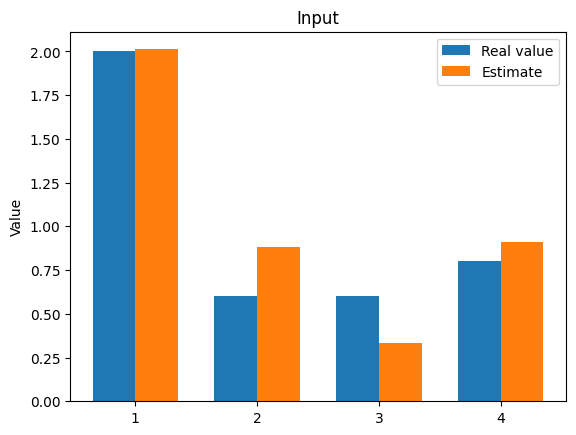

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (4,) and arg 1 with shape (50,).

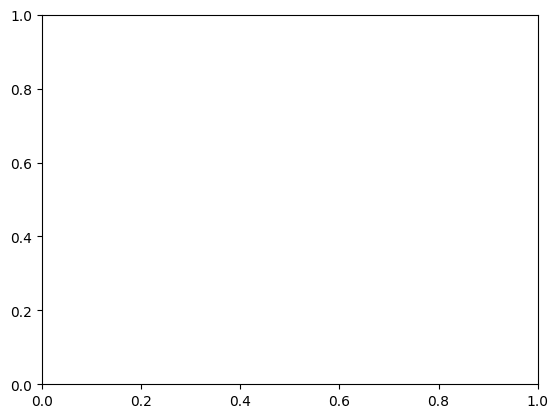

In [ ]:
# true parameters
parameters=np.array([2.,0.6,0.6,0.8])
sigma_noise=0.25

# value data
n_data=25
t_eval=np.linspace(0.,6.,n_data).reshape(-1,1)
# prior
mean_prior=np.array([2.3,0.9,0.35,1.1])
cov_prior=np.diag([ 0.1, 0.01, 0.01, 0.1]) #0.1, 0.05, 0.05, 0.1
# cov_linkelihood
sigma=1.5

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =3000
burnin = 1500
n_chains=5

closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
nearest_x=data_HF[closest_indices,0]
y_obs=data_HF[closest_indices,1:3] # chekc se giusto

estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="AM")


real values are [2.  0.6 0.6 0.8]
Sampling chain 1/5


Running chain, α = 0.30: 100%|██████████| 3000/3000 [04:31<00:00, 11.05it/s]


Sampling chain 2/5


Running chain, α = 0.27: 100%|██████████| 3000/3000 [04:33<00:00, 10.96it/s]


Sampling chain 3/5


Running chain, α = 0.26: 100%|██████████| 3000/3000 [04:31<00:00, 11.06it/s]


Sampling chain 4/5


Running chain, α = 0.25: 100%|██████████| 3000/3000 [04:33<00:00, 10.95it/s]


Sampling chain 5/5


Running chain, α = 0.29: 100%|██████████| 3000/3000 [04:35<00:00, 10.90it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.054 0.889 0.339 0.925]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.054  0.125   1.829    2.294      0.009    0.006     214.0     391.0   
x1  0.889  0.095   0.711    1.061      0.005    0.004     323.0     573.0   
x2  0.339  0.093   0.153    0.498      0.005    0.004     323.0     596.0   
x3  0.925  0.242   0.517    1.420      0.023    0.016     112.0     190.0   

    r_hat  
x0   1.01  
x1   1.01  
x2   1.01  
x3   1.02  
Autocorrelation...
the difference between estimated values [0.054 0.289 0.261 0.125]
 the difference between outputs of two models are [2.82819271e-02 9.81721282e-03 4.41266298e-02 6.42663240e-03
 4.32691574e-02 2.70095468e-03 5.24365902e-02 3.55896354e-03
 9.37294960e-03 5.53846359e-04 1.78866386e-02 1.01625919e-03
 2.18906403e-02 3.68463993e-02 4.46457863e-02 1.29848242e-01
 2.45065689e-01 1.67222023e-01 5.05762577e-01 7.11884499e-01
 6.45196438e-02 6.87503815e-02 2.57655084e-02 1.23376846e-02
 2.383

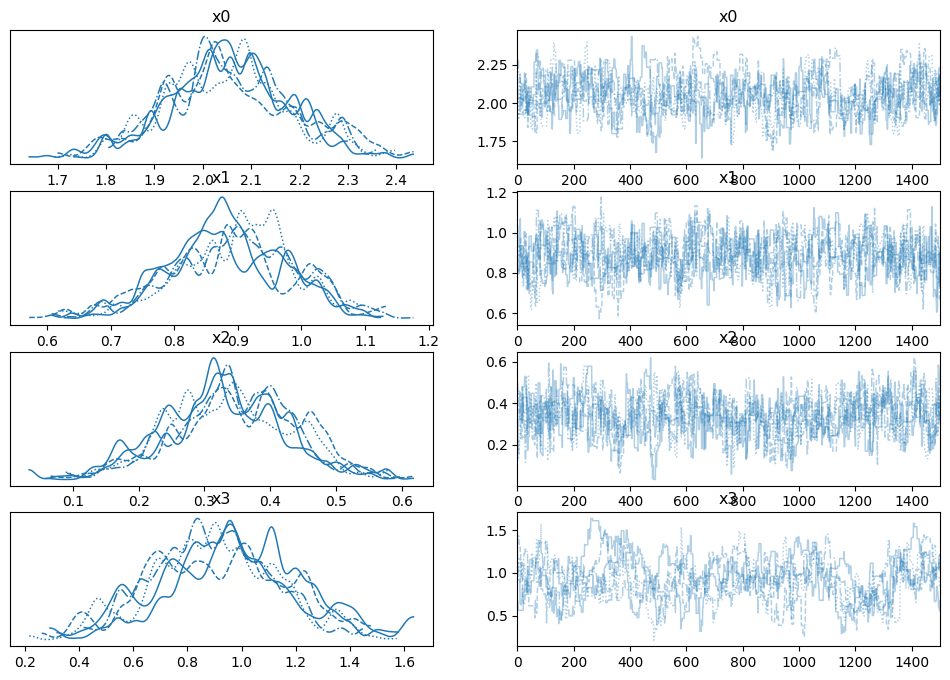

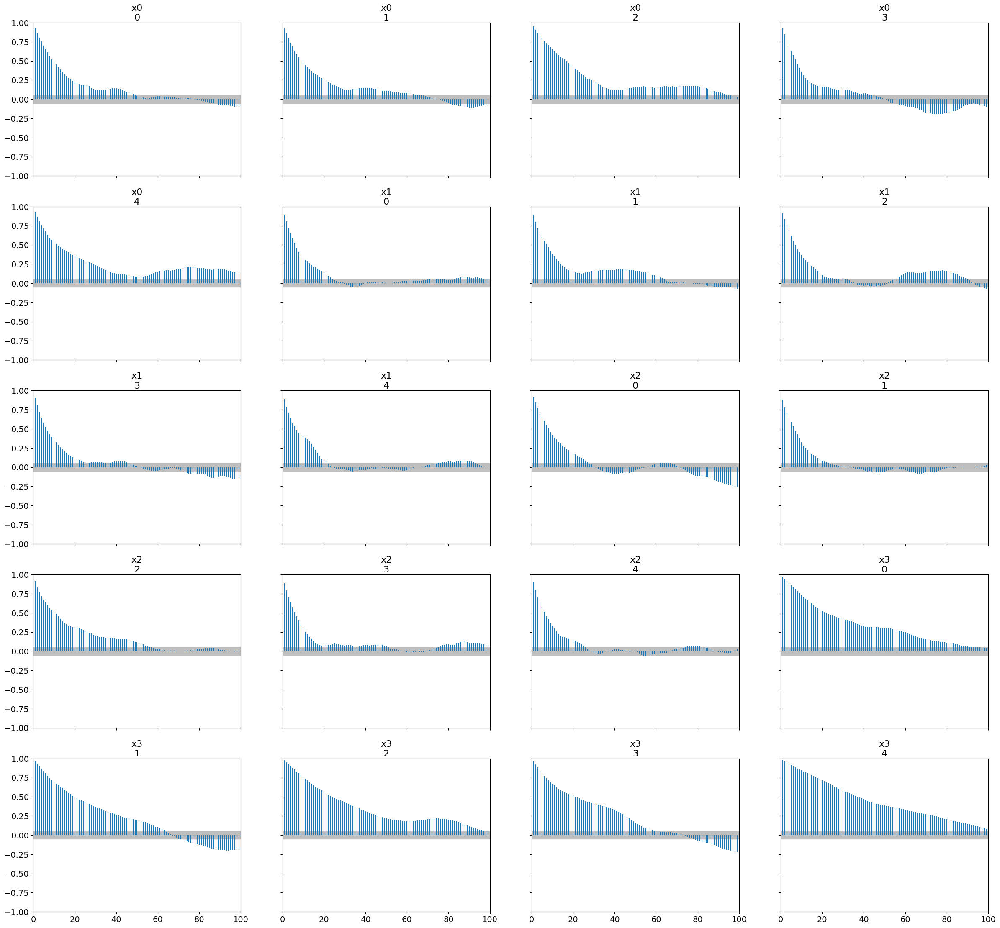

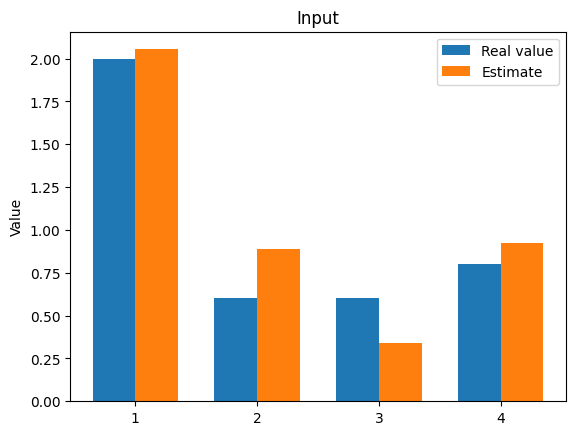

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (4,) and arg 1 with shape (50,).

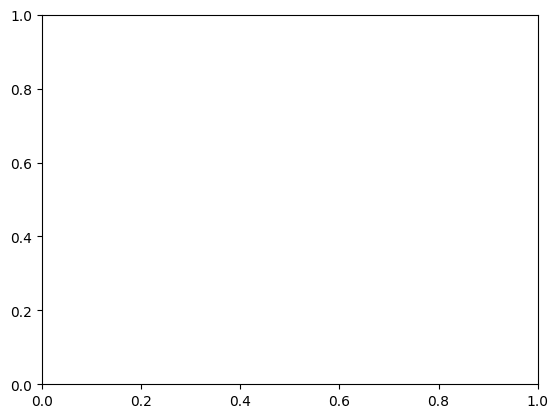

In [ ]:
# true parameters
parameters=np.array([2.,0.6,0.6,0.8])
sigma_noise=0.25

# value data
n_data=25
t_eval=np.linspace(0.,6.,n_data).reshape(-1,1)
# prior
mean_prior=np.array([2.3,0.9,0.35,1.1])
cov_prior=np.diag([ 0.1, 0.01, 0.01, 0.1]) #0.1, 0.05, 0.05, 0.1
# cov_linkelihood
sigma=1.5

# adaptive metropolis
rwmh_cov = np.eye(4)
rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =3000
burnin = 1500
n_chains=5

closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
nearest_x=data_HF[closest_indices,0]
y_obs=data_HF[closest_indices,1:3] # chekc se giusto

estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="MH")


real values are [2.  0.6 0.6 0.8]
Sampling chain 1/5


Running chain, α = 0.26: 100%|██████████| 4000/4000 [10:07<00:00,  6.58it/s]


Sampling chain 2/5


Running chain, α = 0.22: 100%|██████████| 4000/4000 [1:18:08<00:00,  1.17s/it]      


Sampling chain 3/5


Running chain, α = 0.25: 100%|██████████| 4000/4000 [20:39<00:00,  3.23it/s]


Sampling chain 4/5


Running chain, α = 0.22: 100%|██████████| 4000/4000 [20:28<00:00,  3.26it/s]


Sampling chain 5/5


Running chain, α = 0.25: 100%|██████████| 4000/4000 [20:07<00:00,  3.31it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [2.208 0.777 0.781 0.411]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.208  0.172   1.905    2.527      0.007    0.005     543.0     839.0   
x1  0.777  0.205   0.408    1.183      0.008    0.006     690.0     941.0   
x2  0.781  0.213   0.399    1.185      0.009    0.006     573.0     826.0   
x3  0.411  0.462  -0.461    1.210      0.022    0.015     452.0     882.0   

    r_hat  
x0   1.00  
x1   1.00  
x2   1.01  
x3   1.01  
Autocorrelation...
the difference between estimated values [0.208 0.177 0.181 0.389]
 the difference between outputs of two models are [0.00564504 0.01771814 0.02083385 0.01834187 0.02745342 0.01333678
 0.02428031 0.01336929 0.03302073 0.01526529 0.13755941 0.00951505
 0.17366171 0.06998014 0.07510614 0.13432336 0.29730797 0.32222271
 0.51472855 0.68509579 0.08866584 0.03777885 0.03698707 0.06960964
 0.03063631 0.18024731 0.01045081 0.12927151 0.0351612  0.05976391
 0.01591104 0.04852867 0.01989299 0.0

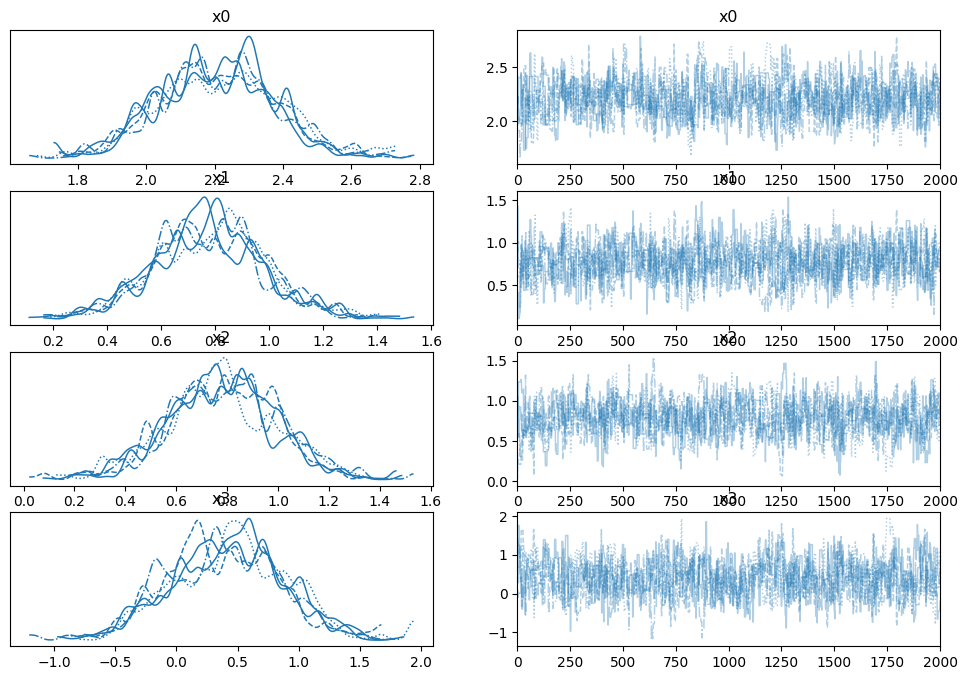

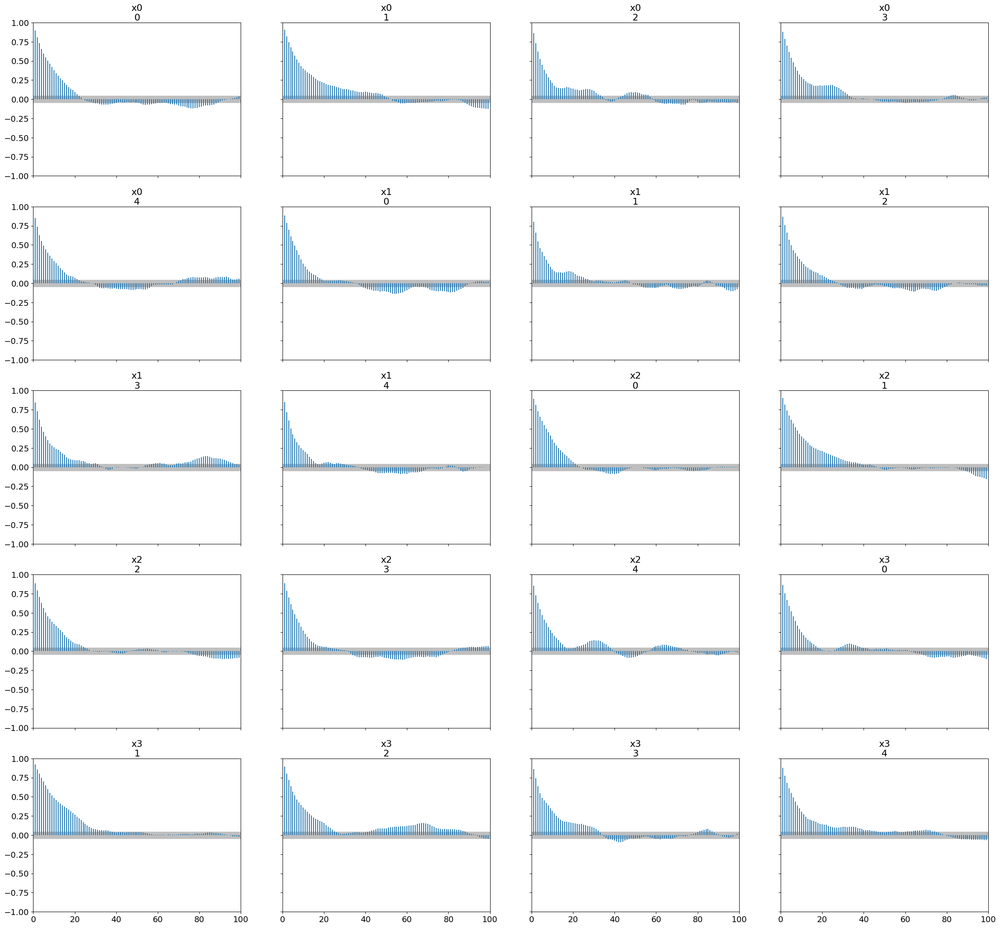

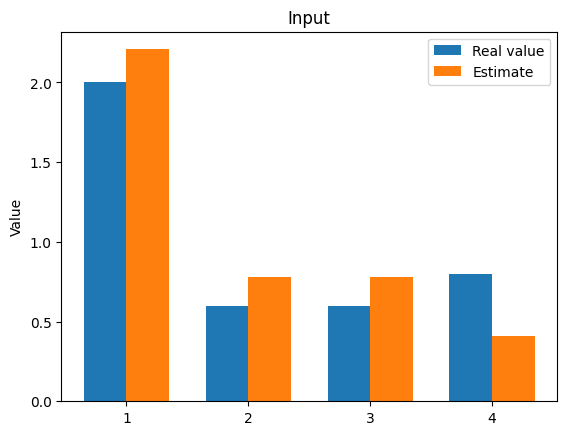

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (4,) and arg 1 with shape (50,).

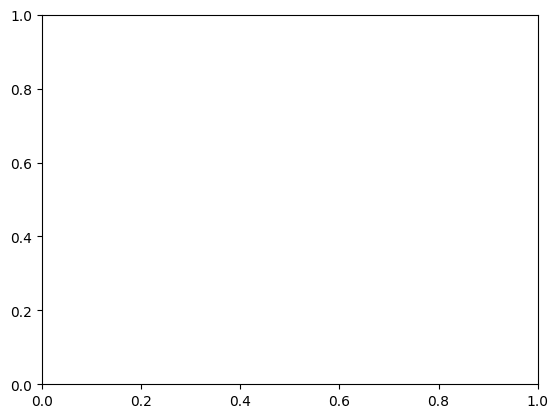

In [ ]:
# true parameters
parameters=np.array([2.,0.6,0.6,0.8])
sigma_noise=0.25

# value data
n_data=25
t_eval=np.linspace(0.,6.,n_data).reshape(-1,1)
# prior
mean_prior=np.array([2.6,0.9,0.9,1.4])
cov_prior=np.diag([ 0.5, 0.05, 0.05, 0.5]) #0.1, 0.05, 0.05, 0.1
# cov_linkelihood
sigma=1.5

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =4000
burnin = 2000
n_chains=5

closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
nearest_x=data_HF[closest_indices,0]
y_obs=data_HF[closest_indices,1:3] # chekc se giusto

estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="AM")


In [ ]:
# true parameters
parameters=np.array([2.,0.6,0.6,0.8])
sigma_noise=0.25

# value data
n_data=25
t_eval=np.linspace(0.,6.,n_data).reshape(-1,1)
# prior
mean_prior=np.array([2.6,0.9,0.9,1.4])
cov_prior=np.diag([ 0.1, 0.01, 0.01, 0.1]) #0.1, 0.05, 0.05, 0.1
# cov_linkelihood
sigma=1.5

# adaptive metropolis
rwmh_cov = np.eye(4)
#rmwh_scaling = 0.25
rwmh_adaptive = True
iterations =3000
burnin = 1500
n_chains=5

closest_indices= np.argmin( np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0, np.newaxis] - t_eval.T), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
nearest_x=data_HF[closest_indices,0]
y_obs=data_HF[closest_indices,1:3] # chekc se giusto

estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs,x_real=parameters, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rwmh_adaptive=rwmh_adaptive,algo="DREAMZ")

real values are [2.  0.6 0.6 0.8]
Sampling chain 1/5


Running chain, α = 0.18:   4%|▍         | 125/3000 [00:12<04:51,  9.87it/s]


KeyboardInterrupt: 

real values are None
Sampling chain 1/4


Running chain, α = 0.20: 100%|██████████| 3000/3000 [08:10<00:00,  6.11it/s]


Sampling chain 2/4


Running chain, α = 0.18: 100%|██████████| 3000/3000 [08:06<00:00,  6.16it/s]


Sampling chain 3/4


Running chain, α = 0.26: 100%|██████████| 3000/3000 [07:52<00:00,  6.35it/s]


Sampling chain 4/4


Running chain, α = 0.22: 100%|██████████| 3000/3000 [08:11<00:00,  6.11it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [-0.328 -5.538  3.012  7.463]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0 -0.328  0.534  -0.850    0.159      0.182    0.133       6.0      20.0   
x1 -5.538  0.673  -6.591   -4.933      0.269    0.217       6.0      23.0   
x2  3.012  0.979   1.990    4.582      0.468    0.356       5.0      26.0   
x3  7.463  1.144   6.106    8.600      0.466    0.382       6.0      28.0   

    r_hat  
x0   1.85  
x1   1.69  
x2   2.06  
x3   1.89  
Autocorrelation...


AttributeError: 'NoneType' object has no attribute 'ndim'

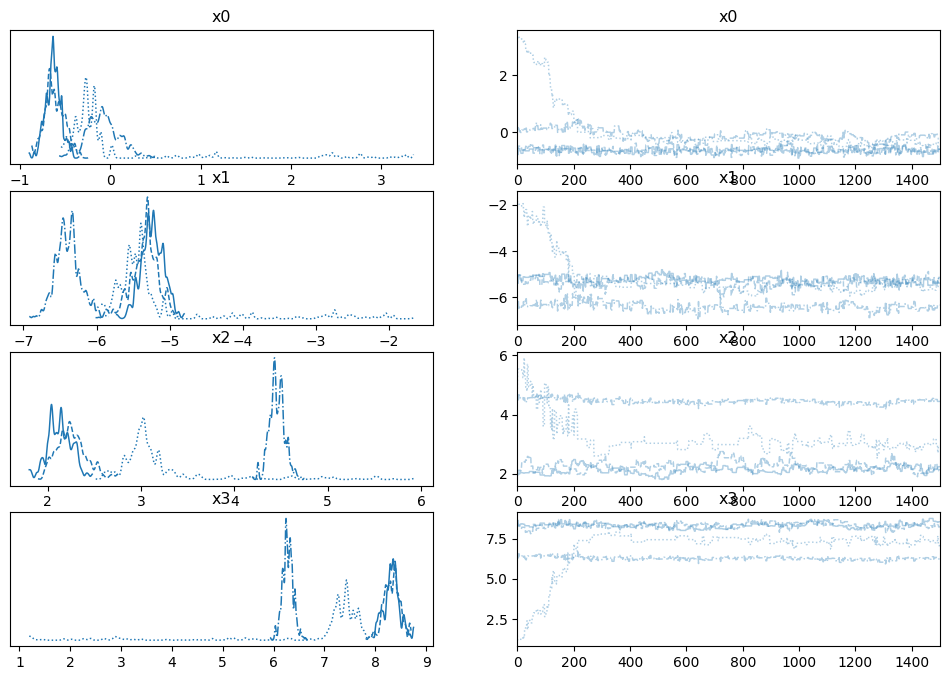

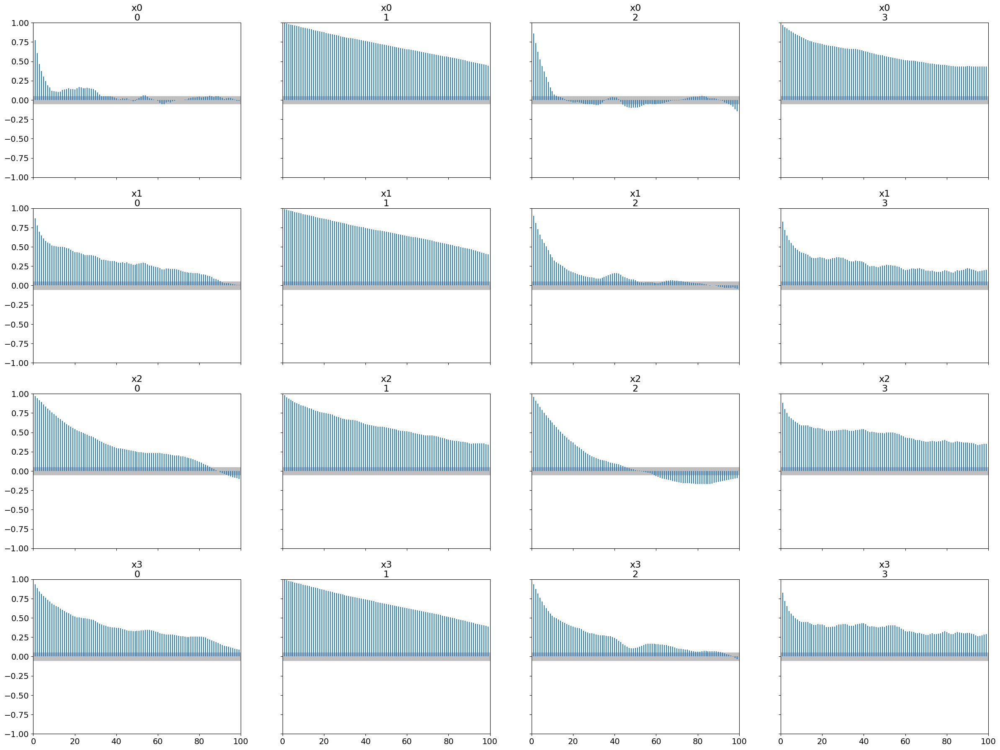

In [ ]:

#real_x=np.array([[0.21023101, 0.05641533, 0.03339461]])
n_data=50
t_eval=np.linspace(0.,6.,n_data).reshape(-1,1)
parameters=np.array([2.,0.6,0.6,0.8])
mean_prior=np.array([2.6,1.3,1.3,1.4])
cov_prior=np.eye(4)*0.2
sigma=0.7
sigma_noise=0.25
rwmh_cov = np.eye(4)*0.5 # !
rmwh_scaling = 1
rwmh_adaptive = True
iterations =3000
burnin = 1500
n_chains=4

closest_indices= np.argmin( np.linalg.norm(data_HF[indexes_HF[0]:indexes_HF[1], np.newaxis, :] - t_eval, axis=2), axis=0)#    np.argmin(np.abs(data_HF[indexes_HF[0]:indexes_HF[1],0] - t_eval))
nearest_x=data_HF[closest_indices,0]
y_obs=data_HF[closest_indices,1:3]
estimate_MF=model.param_inverse(mean_prior, t_eval, cov_prior=cov_prior, cov_noise=sigma_noise, cov_likelihood=sigma**2*np.eye(t_eval.shape[0]), y_obs=y_obs, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,algo="AM")


In [ ]:
# Il tuo array 1x4
array_1x4 = np.array([[1, 2, 3, 4]])

# Numero di copie desiderato
n_copie = 5

# Replicazione dell'array
array_nx4 = np.tile(array_1x4, (n_copie, 1))

# Stampa dell'array risultante
print(array_nx4)

[[1 2 3 4]
 [1 2 3 4]
 [1 2 3 4]
 [1 2 3 4]
 [1 2 3 4]]


In [ ]:
indici_simili = np.argmin( np.linalg.norm(data_HF[indexes_HF[0]:indexes_HF[1], np.newaxis, :] - t_eval, axis=2), axis=0)

[0.2        0.45987838 0.01448387 0.00650756 0.15      ]


In [ ]:
def trova_indice_simile(vettore_20, vettore_50):
    distanze = np.linalg.norm(vettore_50[:, np.newaxis, :] - vettore_20, axis=2)
    indici_simili = np.argmin(distanze, axis=0)
    return indici_simili

# Esempio di utilizzo
vettore_20 = np.random.rand(20, 3)  # Vettore di 20 elementi con 3 componenti ciascuno
vettore_50 = np.random.rand(50, 3)  # Vettore di 50 elementi con 3 componenti ciascuno

indici_simili = trova_indice_simile(vettore_20, vettore_50)

print("Indici simili:", indici_simili)

Indici simili: [ 8 43 32 26 20 42  8  4 27  2  0 42 44 34  1  2 42 23  7  6]


In [ ]:
print(vettore_20.shape)

(20, 3)


In [ ]:
np.argmin(np.abs(data_HF_test[:,0] - real_x))


800

In [ ]:
# found the correct value, as if I have applied the real function
nearest_U=U_HF_test_original[closest_indices]
reaction_HF_test_original=np.c_[reaction_HF_test_original, np.abs(np.sin(5*np.pi*reaction_HF_test_original-5*np.pi/6))]

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.ones(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.1*4 # voceriance of the likelihood
rwmh_cov = np.eye(len(real_x)) # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

In [ ]:
#real_x=np.c_[real_x, np.abs(np.sin(5*np.pi*real_x-5*np.pi/6))]
transformations= lambda x: np.abs(np.sin(5*np.pi*x-5*np.pi/6))
transformations=[transformations]

In [ ]:
# from functools import reduce

# x_final = reduce(lambda acc, trasf: np.hstack([acc, trasf(acc)]), transformations, real_x)

In [ ]:
nearest_U=nearest_U.reshape(-1,1)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]


Sampling chain 1/4


Running chain, α = 0.55: 100%|██████████| 1000/1000 [01:22<00:00, 12.12it/s]


Sampling chain 2/4


Running chain, α = 0.45: 100%|██████████| 1000/1000 [01:22<00:00, 12.17it/s]


Sampling chain 3/4


Running chain, α = 0.65: 100%|██████████| 1000/1000 [01:22<00:00, 12.18it/s]


Sampling chain 4/4


Running chain, α = 0.58: 100%|██████████| 1000/1000 [01:21<00:00, 12.26it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.271 0.496 0.408 0.51  0.42 ]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.271  0.426  -0.366    1.121      0.148    0.124       9.0      16.0   
x1  0.496  0.360  -0.154    1.198      0.114    0.084      10.0      24.0   
x2  0.408  0.386  -0.208    1.112      0.149    0.110       7.0      25.0   
x3  0.510  0.364  -0.252    1.126      0.114    0.083      10.0      17.0   
x4  0.420  0.395  -0.431    1.036      0.164    0.122       6.0      17.0   

    r_hat  
x0   1.38  
x1   1.33  
x2   1.57  
x3   1.32  
x4   1.74  
Autocorrelation...
[0.15866 0.163   0.092   0.155   0.28   ]


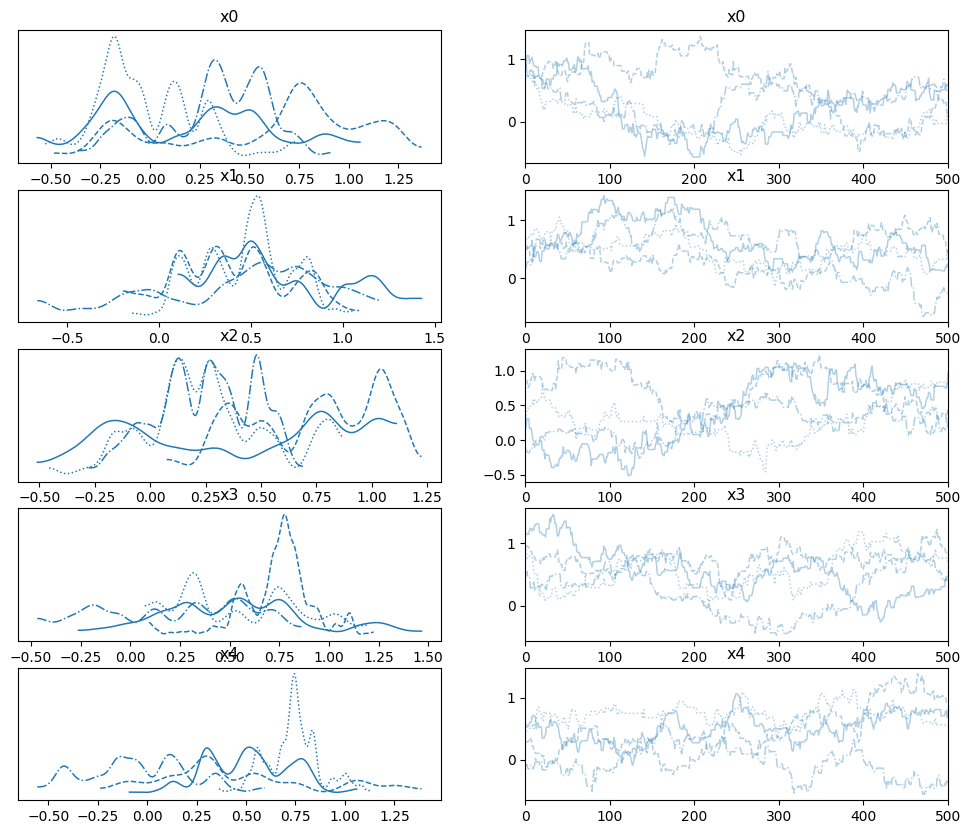

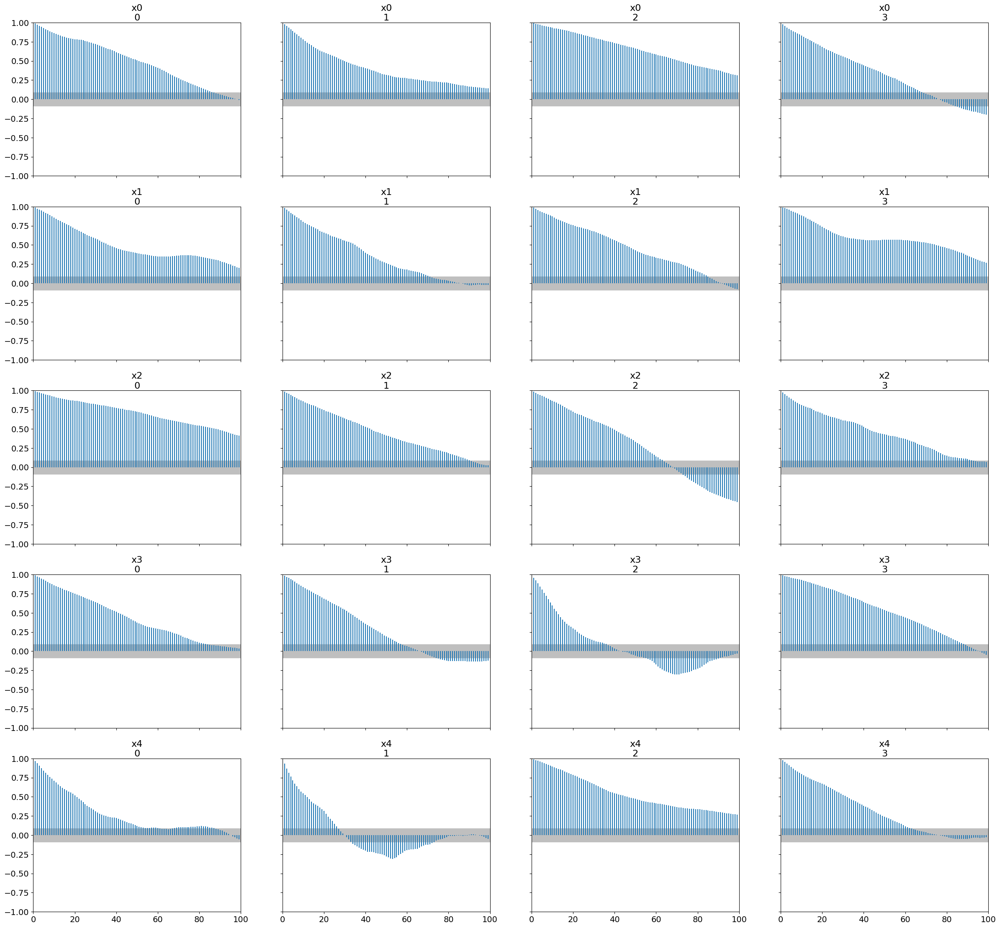

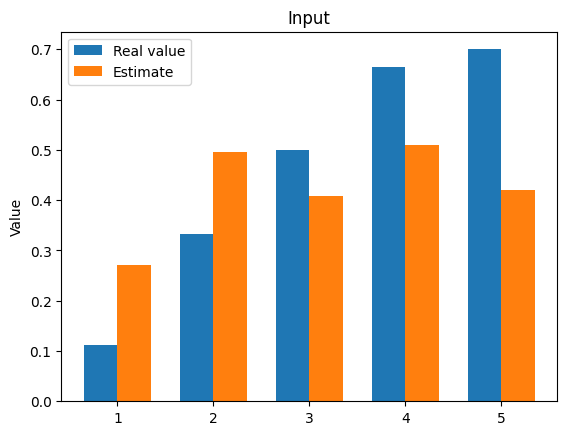

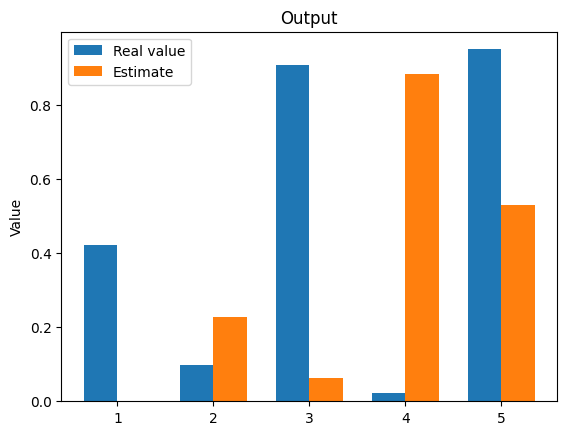

The function inverse took 362.8616828918457 seconds.
real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.56: 100%|██████████| 1000/1000 [01:23<00:00, 12.04it/s]


Sampling chain 2/4


Running chain, α = 0.45: 100%|██████████| 1000/1000 [01:22<00:00, 12.13it/s]


Sampling chain 3/4


Running chain, α = 0.34: 100%|██████████| 1000/1000 [01:22<00:00, 12.15it/s]


Sampling chain 4/4


Running chain, α = 0.51: 100%|██████████| 1000/1000 [01:23<00:00, 12.02it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.557 0.35  0.476 0.598 0.49 ]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.557  0.336   0.064    1.166      0.141    0.105       6.0      34.0   
x1  0.350  0.332  -0.154    1.015      0.104    0.078      12.0      53.0   
x2  0.476  0.292   0.006    1.036      0.094    0.071      10.0      31.0   
x3  0.598  0.303   0.073    1.191      0.110    0.083       8.0      26.0   
x4  0.490  0.329   0.028    1.175      0.122    0.090       8.0      49.0   

    r_hat  
x0   1.76  
x1   1.30  
x2   1.33  
x3   1.46  
x4   1.56  
Autocorrelation...
[0.44466 0.017   0.024   0.067   0.21   ]


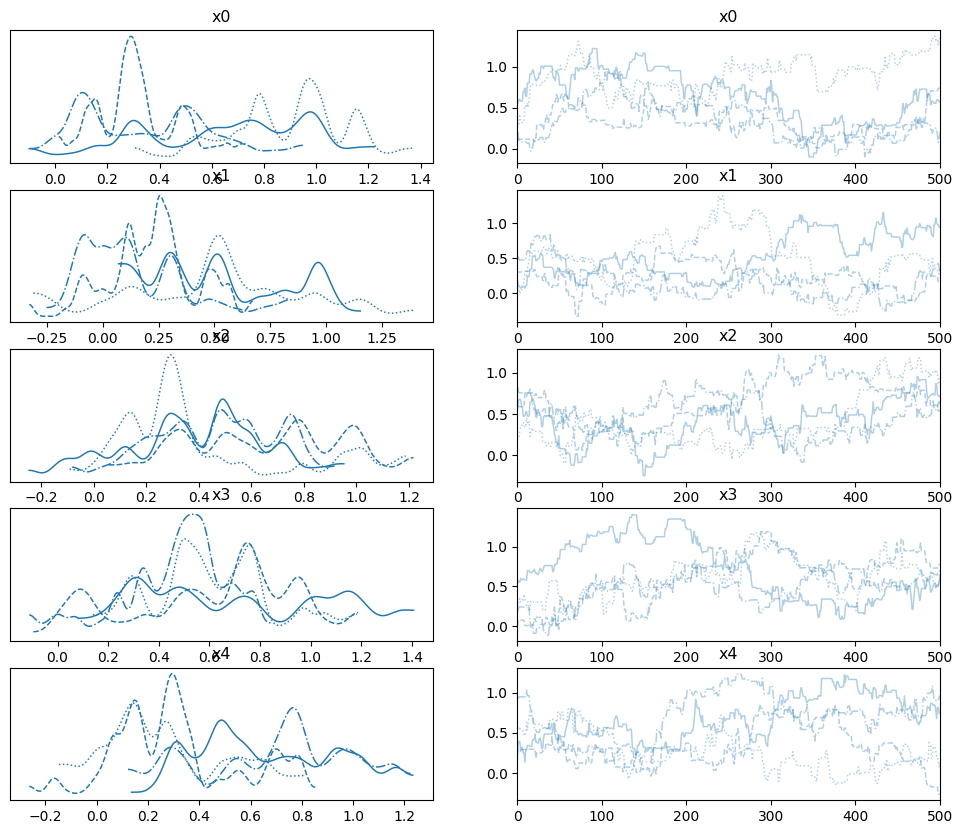

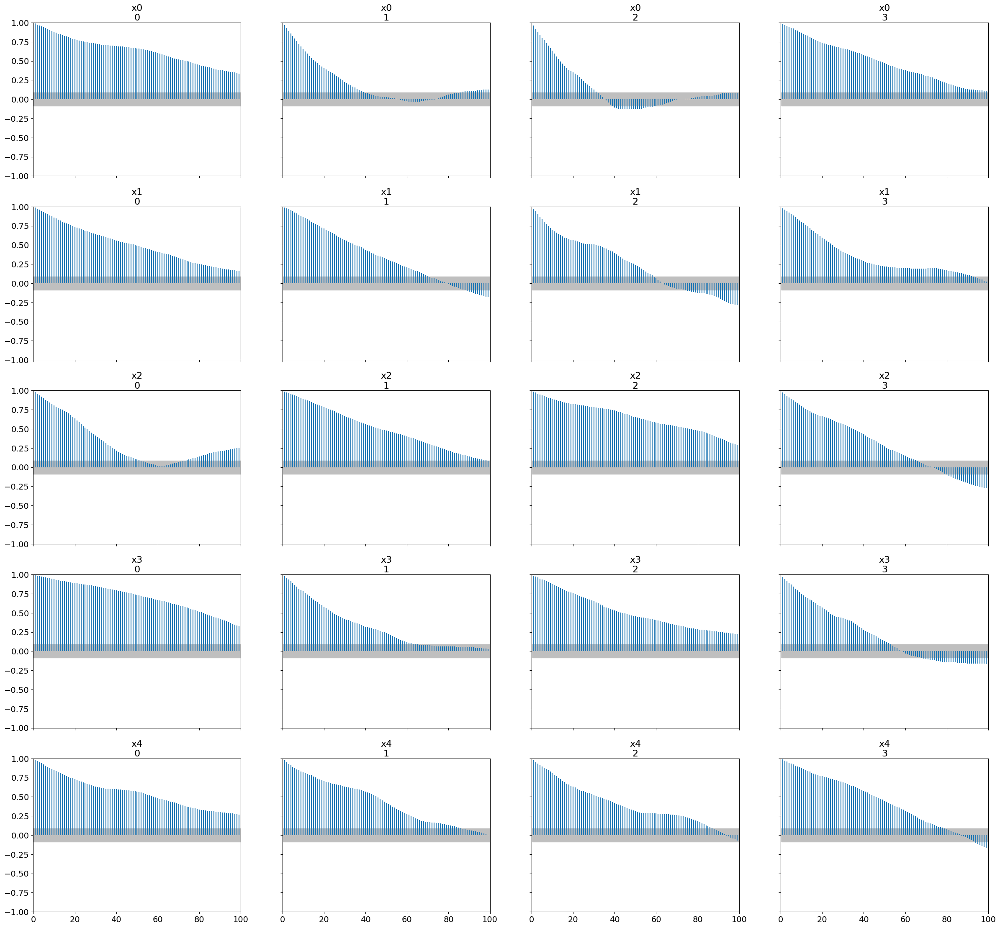

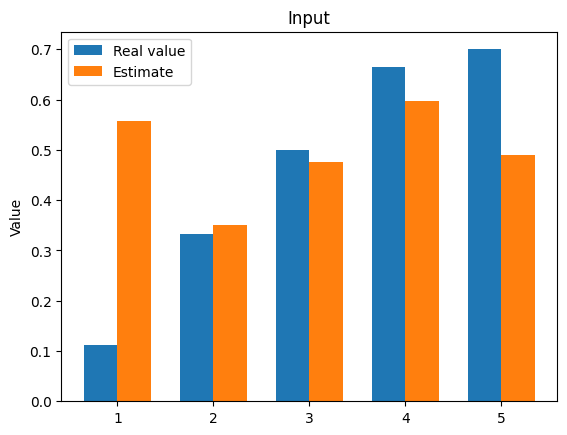

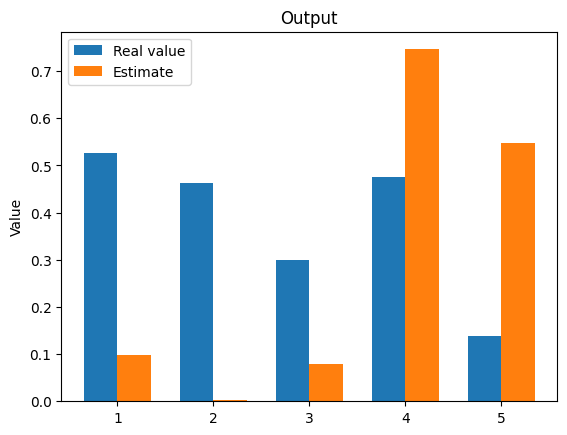

The function inverse took 370.56435656547546 seconds.
real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.71: 100%|██████████| 1000/1000 [01:22<00:00, 12.09it/s]


Sampling chain 2/4


Running chain, α = 0.62: 100%|██████████| 1000/1000 [01:24<00:00, 11.82it/s]


Sampling chain 3/4


Running chain, α = 0.78: 100%|██████████| 1000/1000 [01:31<00:00, 10.92it/s]


Sampling chain 4/4


Running chain, α = 0.75: 100%|██████████| 1000/1000 [01:33<00:00, 10.68it/s]
C:\Users\Giacomo\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.624 0.468 0.384 0.566 0.568]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.624  0.367  -0.061    1.304      0.134    0.106       8.0      15.0   
x1  0.468  0.287  -0.003    1.031      0.082    0.063      14.0      32.0   
x2  0.384  0.327  -0.342    0.853      0.127    0.094       7.0      13.0   
x3  0.566  0.299   0.059    1.216      0.088    0.064      11.0      50.0   
x4  0.568  0.316  -0.084    1.092      0.088    0.064      13.0      25.0   

    r_hat  
x0   1.42  
x1   1.22  
x2   1.56  
x3   1.31  
x4   1.23  
Autocorrelation...
[0.51166 0.135   0.116   0.099   0.132  ]


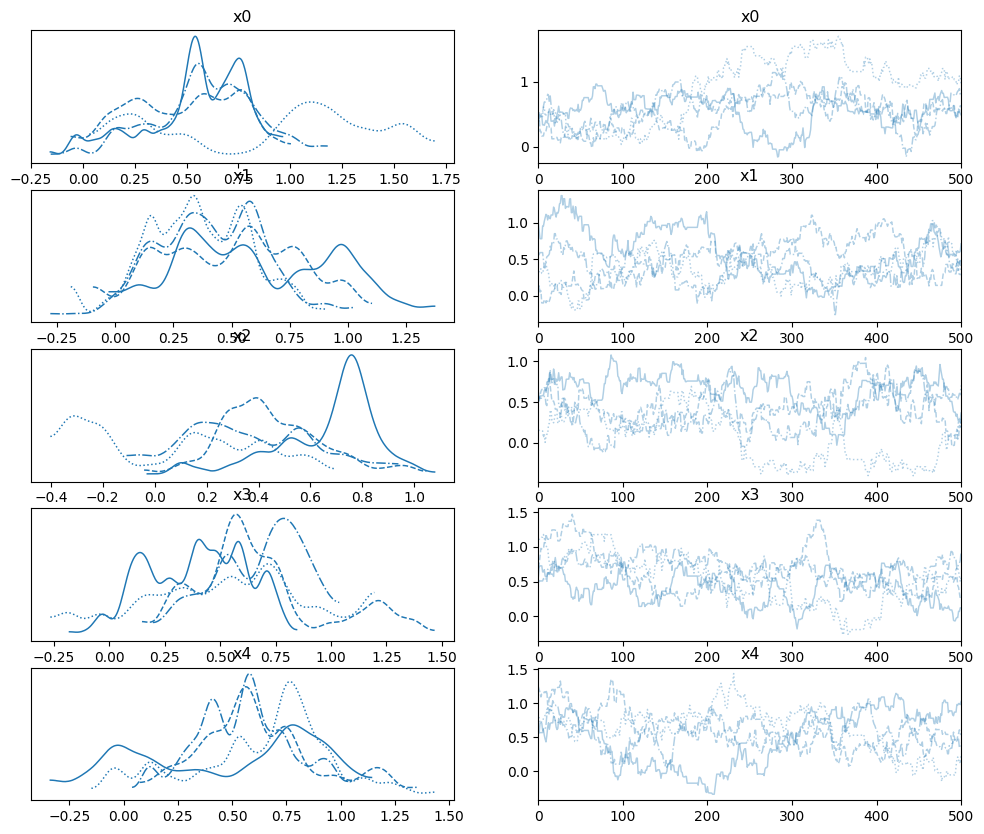

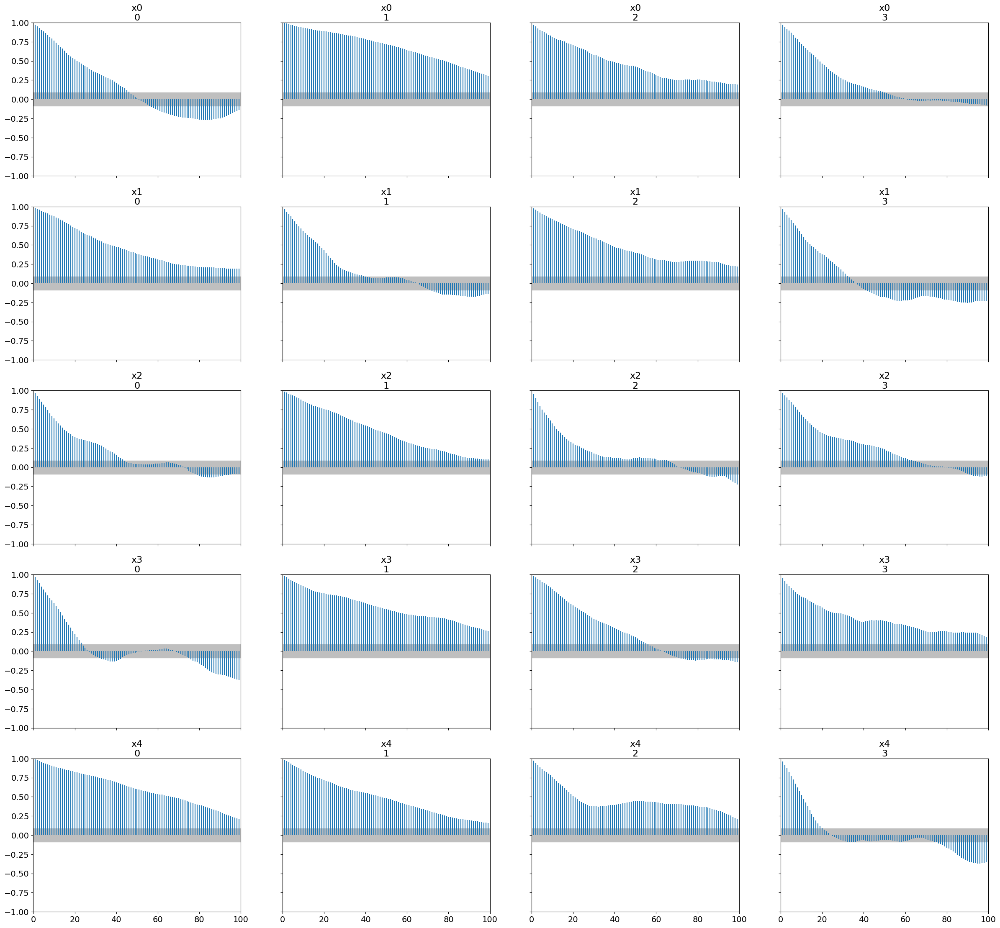

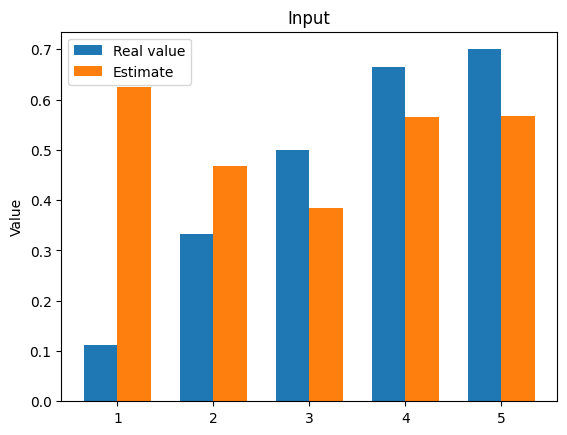

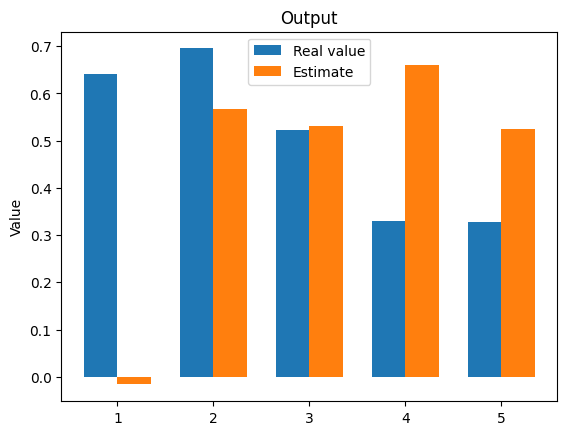

The function inverse took 407.01258635520935 seconds.


In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.eye(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.3 *3# voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise**2*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations,algo="RW")
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.eye(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.3 *3# voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = True
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise**2*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations,algo="RW")
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]


KeyboardInterrupt: 

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.40: 100%|██████████| 2000/2000 [04:55<00:00,  6.76it/s]


Sampling chain 2/4


Running chain, α = 0.35: 100%|██████████| 2000/2000 [05:08<00:00,  6.48it/s]


Sampling chain 3/4


Running chain, α = 0.32: 100%|██████████| 2000/2000 [05:10<00:00,  6.44it/s]


Sampling chain 4/4


Running chain, α = 0.37: 100%|██████████| 2000/2000 [05:22<00:00,  6.20it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.5   0.567 0.64  0.66  0.524]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.500  0.311  -0.005    1.148      0.031    0.022     100.0     257.0   
x1  0.567  0.341  -0.054    1.163      0.074    0.053      22.0     168.0   
x2  0.640  0.349   0.087    1.336      0.053    0.038      44.0     164.0   
x3  0.660  0.354   0.059    1.322      0.051    0.037      51.0     128.0   
x4  0.524  0.374  -0.202    1.193      0.036    0.026     110.0     229.0   

    r_hat  
x0   1.04  
x1   1.13  
x2   1.09  
x3   1.10  
x4   1.05  
Autocorrelation...
[0.38766 0.234   0.14    0.005   0.176  ]


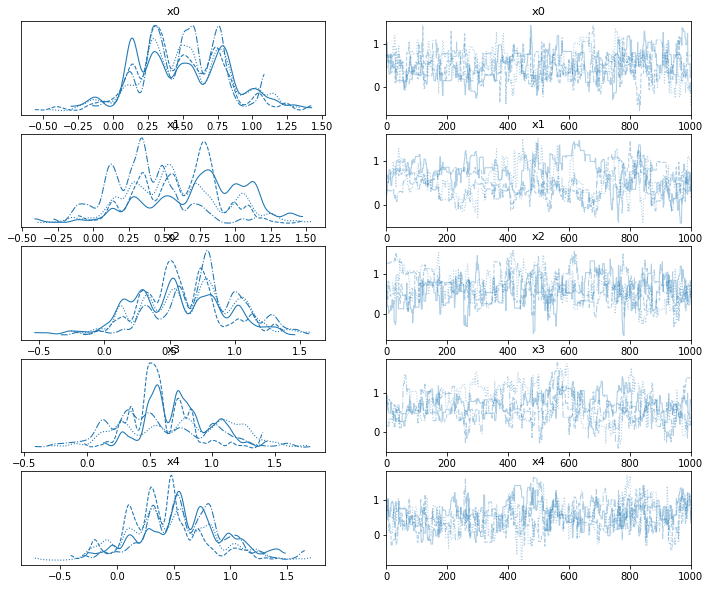

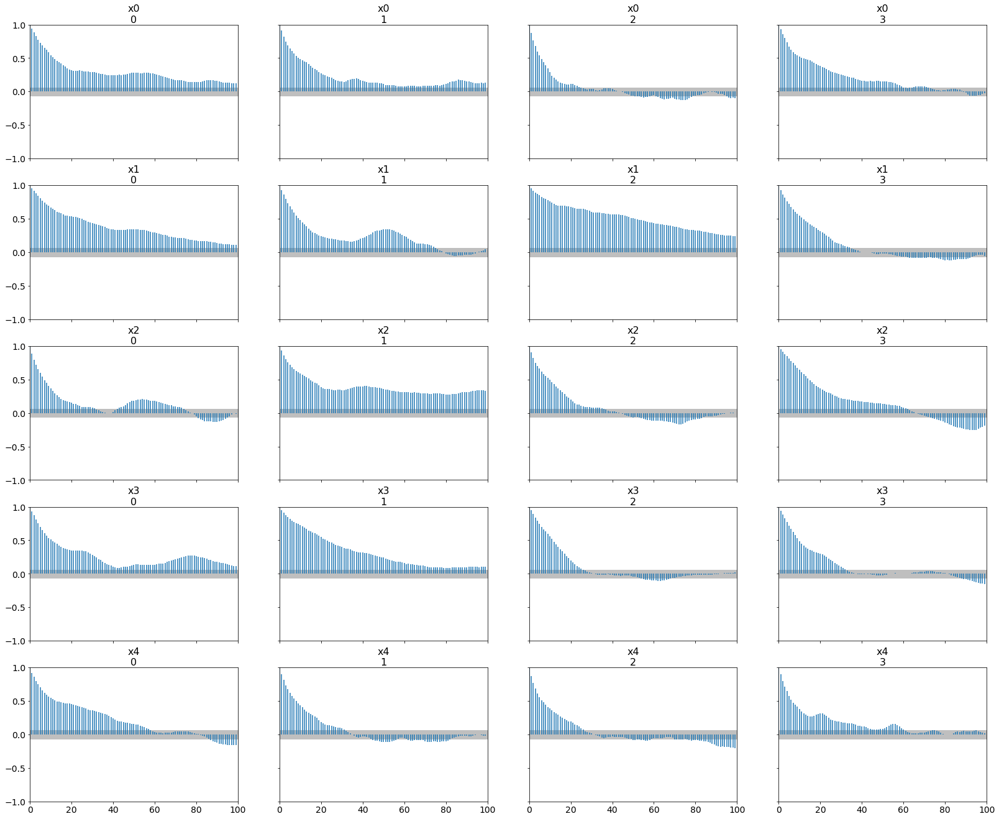

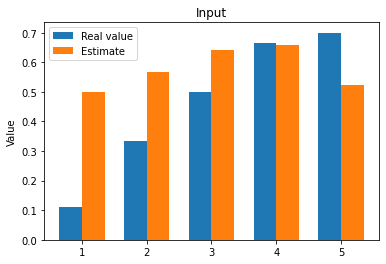

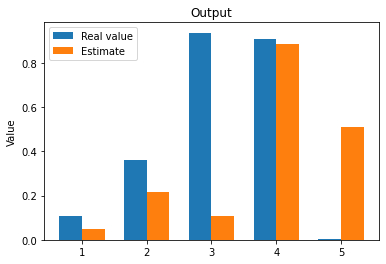

The function inverse took 1364.1761486530304 seconds.
real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.35: 100%|██████████| 2000/2000 [05:19<00:00,  6.26it/s]


Sampling chain 2/4


Running chain, α = 0.34: 100%|██████████| 2000/2000 [05:22<00:00,  6.21it/s]


Sampling chain 3/4


Running chain, α = 0.31:  76%|███████▌  | 1523/2000 [04:15<01:19,  5.99it/s]

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.eye(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.3 *3# voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=2000#4000#8000
burnin=1000#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise**2*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations,algo="AM")
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.05: 100%|██████████| 1000/1000 [02:48<00:00,  5.95it/s]


Sampling chain 2/4


Running chain, α = 0.07: 100%|██████████| 1000/1000 [02:41<00:00,  6.19it/s]


Sampling chain 3/4


Running chain, α = 0.02: 100%|██████████| 1000/1000 [02:51<00:00,  5.83it/s]


Sampling chain 4/4


Running chain, α = 0.12: 100%|██████████| 1000/1000 [02:48<00:00,  5.93it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.605 0.52  0.565 0.629 0.688]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.605  0.282   0.076    1.114      0.042    0.031      47.0      69.0   
x1  0.520  0.347  -0.063    1.078      0.055    0.039      40.0      22.0   
x2  0.565  0.284   0.009    0.952      0.068    0.049      16.0      80.0   
x3  0.629  0.378  -0.029    1.290      0.049    0.035      62.0      59.0   
x4  0.688  0.337   0.059    1.310      0.084    0.060      17.0      64.0   

    r_hat  
x0   1.09  
x1   1.06  
x2   1.19  
x3   1.18  
x4   1.20  
Autocorrelation...
[0.49266 0.187   0.065   0.036   0.012  ]


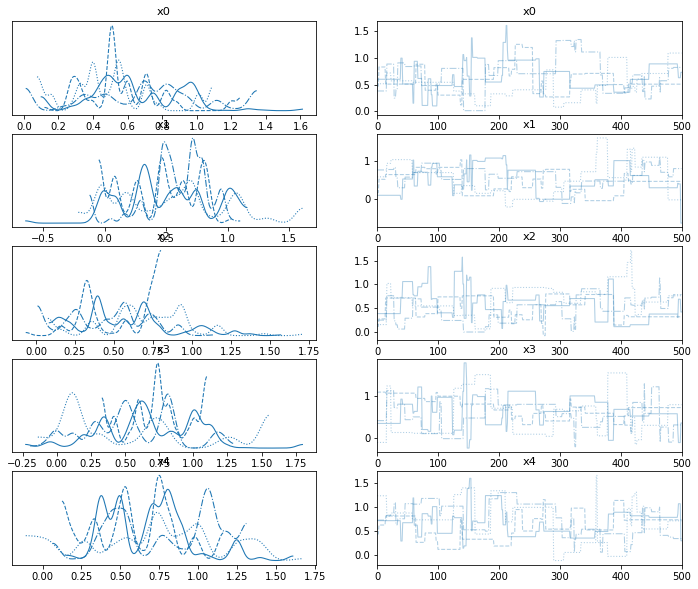

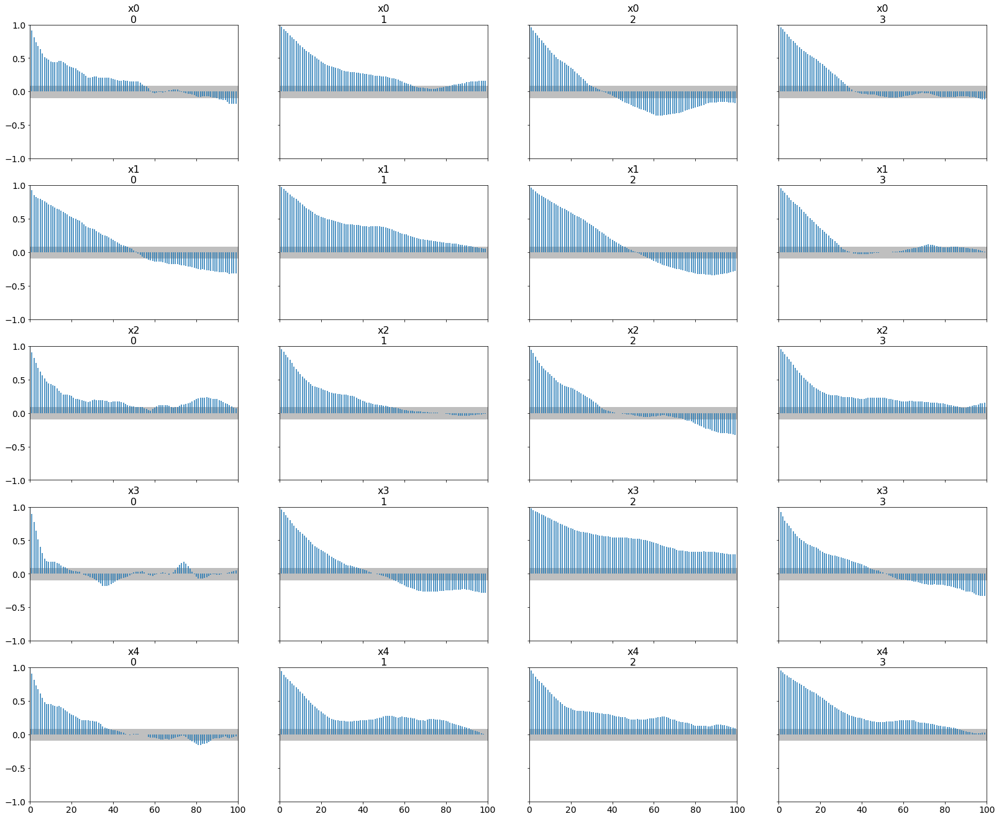

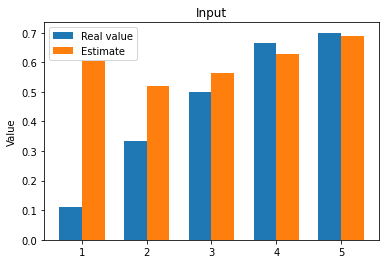

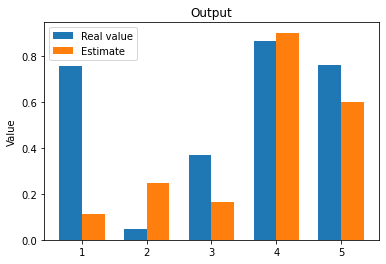

The function inverse took 730.7625484466553 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.eye(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.3 *3# voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = True
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise**2*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations,algo="AM")
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.75: 100%|██████████| 1000/1000 [02:52<00:00,  5.81it/s]


Sampling chain 2/4


Running chain, α = 0.73: 100%|██████████| 1000/1000 [02:50<00:00,  5.88it/s]


Sampling chain 3/4


Running chain, α = 0.76: 100%|██████████| 1000/1000 [02:57<00:00,  5.63it/s]


Sampling chain 4/4


Running chain, α = 0.70: 100%|██████████| 1000/1000 [03:48<00:00,  4.39it/s] 
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.607 0.431 0.105 0.525 0.25 ]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.607  0.305   0.126    1.035      0.142    0.108       5.0      14.0   
x1  0.431  0.131   0.241    0.702      0.043    0.032      10.0      12.0   
x2  0.105  0.170  -0.115    0.370      0.077    0.058       6.0      39.0   
x3  0.525  0.352   0.111    1.198      0.171    0.131       5.0      21.0   
x4  0.250  0.167  -0.077    0.538      0.069    0.051       6.0      12.0   

    r_hat  
x0   2.19  
x1   1.32  
x2   1.79  
x3   2.28  
x4   1.74  
Autocorrelation...
[0.49466 0.098   0.395   0.14    0.45   ]


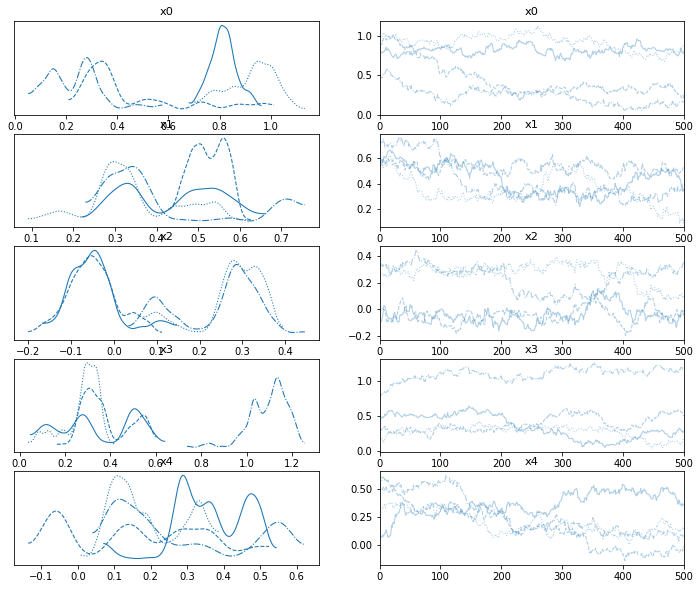

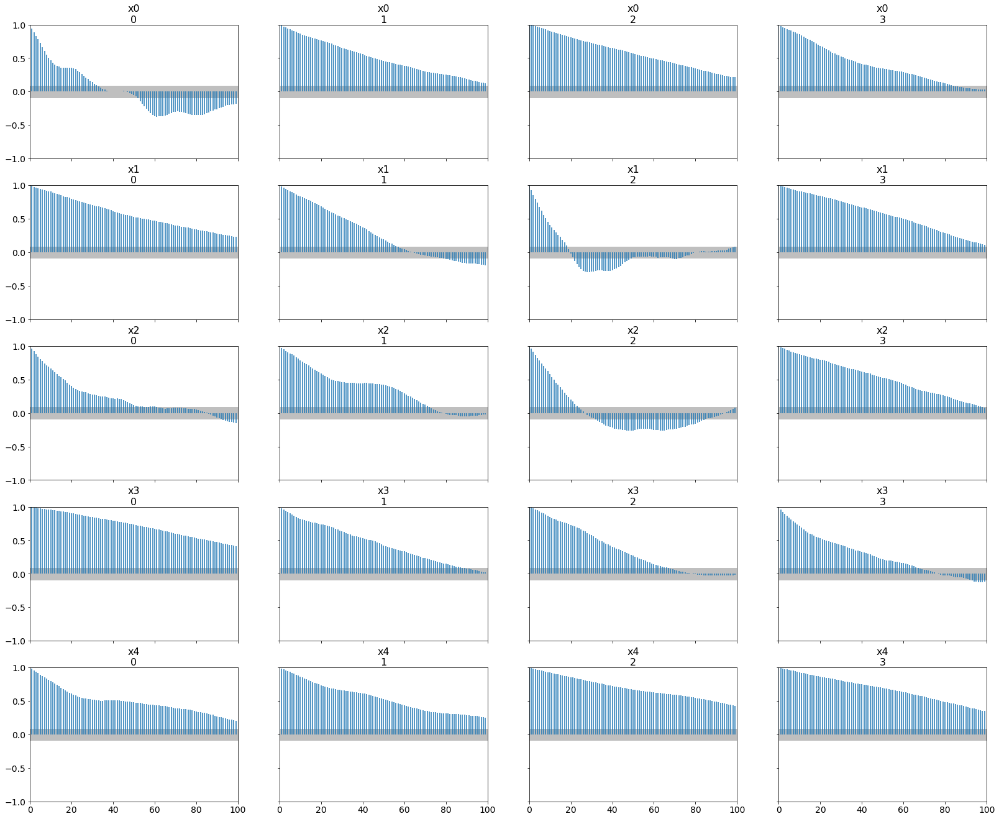

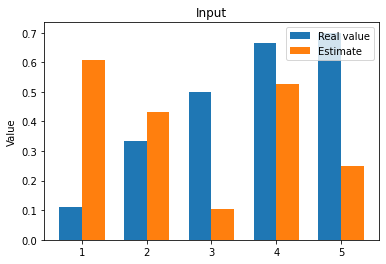

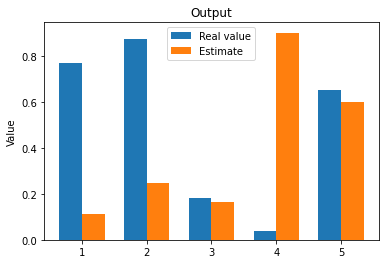

The function inverse took 823.0519914627075 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.eye(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.3 *3# voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise**2*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations,algo="CN")
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.35: 100%|██████████| 1000/1000 [02:39<00:00,  6.27it/s]


Sampling chain 2/4


Running chain, α = 0.38: 100%|██████████| 1000/1000 [02:42<00:00,  6.14it/s]


Sampling chain 3/4


Running chain, α = 0.30: 100%|██████████| 1000/1000 [02:54<00:00,  5.72it/s]


Sampling chain 4/4


Running chain, α = 0.31: 100%|██████████| 1000/1000 [02:51<00:00,  5.84it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.24  0.076 0.268 0.243 0.181]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.240  0.332  -0.258    0.923      0.045    0.035      54.0      39.0   
x1  0.076  0.412  -0.844    0.792      0.127    0.092      12.0      42.0   
x2  0.268  0.380  -0.206    1.088      0.071    0.061      23.0      47.0   
x3  0.243  0.238  -0.096    0.747      0.029    0.022      72.0      51.0   
x4  0.181  0.321  -0.685    0.711      0.084    0.061      21.0      13.0   

    r_hat  
x0   1.05  
x1   1.25  
x2   1.13  
x3   1.02  
x4   1.14  
Autocorrelation...
[0.12766 0.257   0.232   0.422   0.519  ]


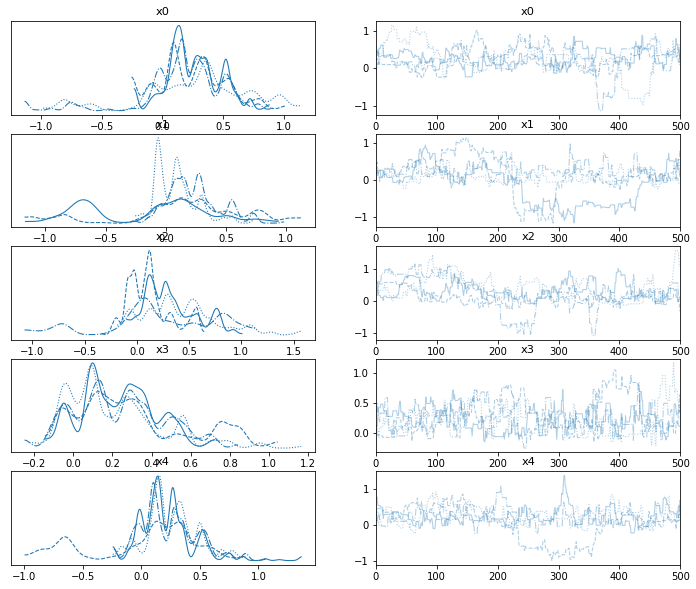

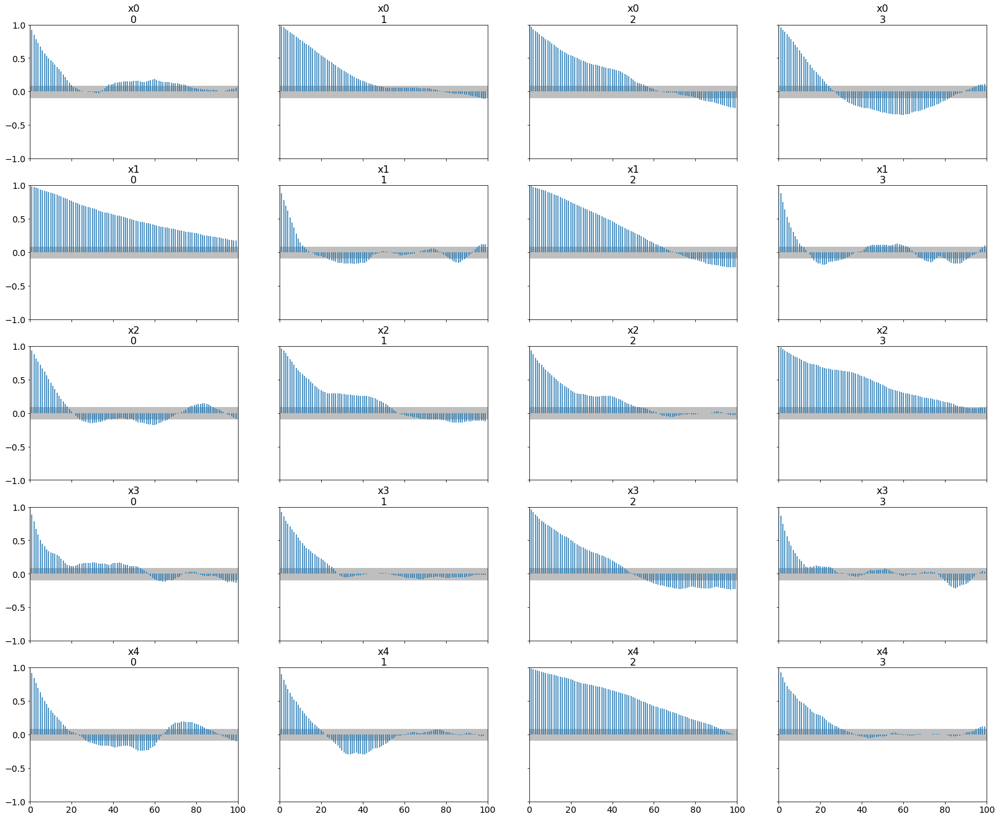

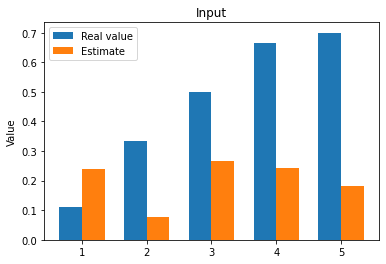

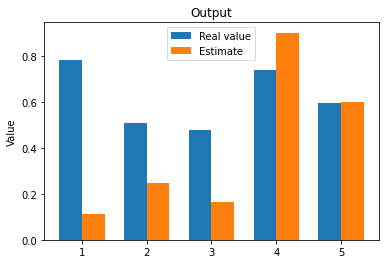

The function inverse took 735.5034279823303 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.eye(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.3 *3# voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = True
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise**2*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations,algo="CN")
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.23: 100%|██████████| 1000/1000 [02:54<00:00,  5.74it/s]


Sampling chain 2/4


Running chain, α = 0.23: 100%|██████████| 1000/1000 [02:59<00:00,  5.58it/s]


Sampling chain 3/4


Running chain, α = 0.21: 100%|██████████| 1000/1000 [02:54<00:00,  5.73it/s]


Sampling chain 4/4


Running chain, α = 0.17: 100%|██████████| 1000/1000 [02:50<00:00,  5.86it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.535 0.597 0.531 0.506 0.574]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.535  0.387  -0.076    1.233      0.044    0.031      78.0     104.0   
x1  0.597  0.372   0.078    1.390      0.048    0.041      62.0      69.0   
x2  0.531  0.358  -0.087    1.147      0.037    0.026      92.0     165.0   
x3  0.506  0.414  -0.083    1.273      0.057    0.041      61.0      46.0   
x4  0.574  0.364  -0.094    1.174      0.039    0.029      88.0      96.0   

    r_hat  
x0   1.05  
x1   1.08  
x2   1.08  
x3   1.07  
x4   1.04  
Autocorrelation...
[0.42266 0.264   0.031   0.159   0.126  ]


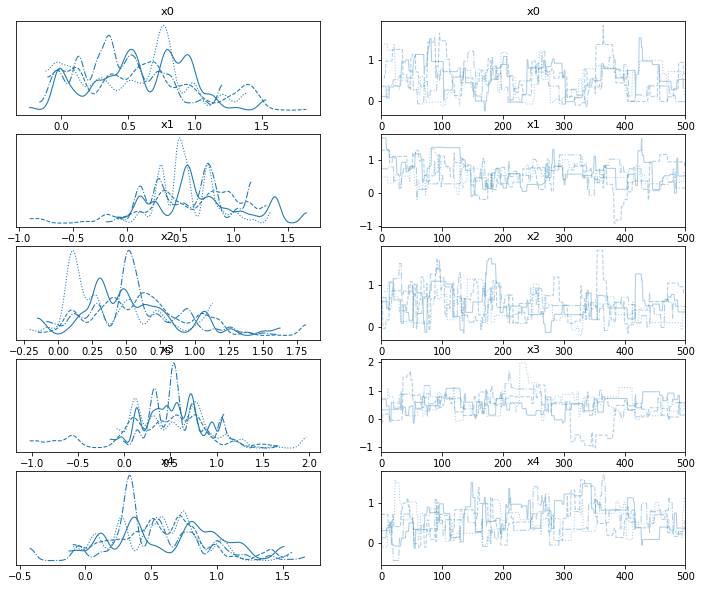

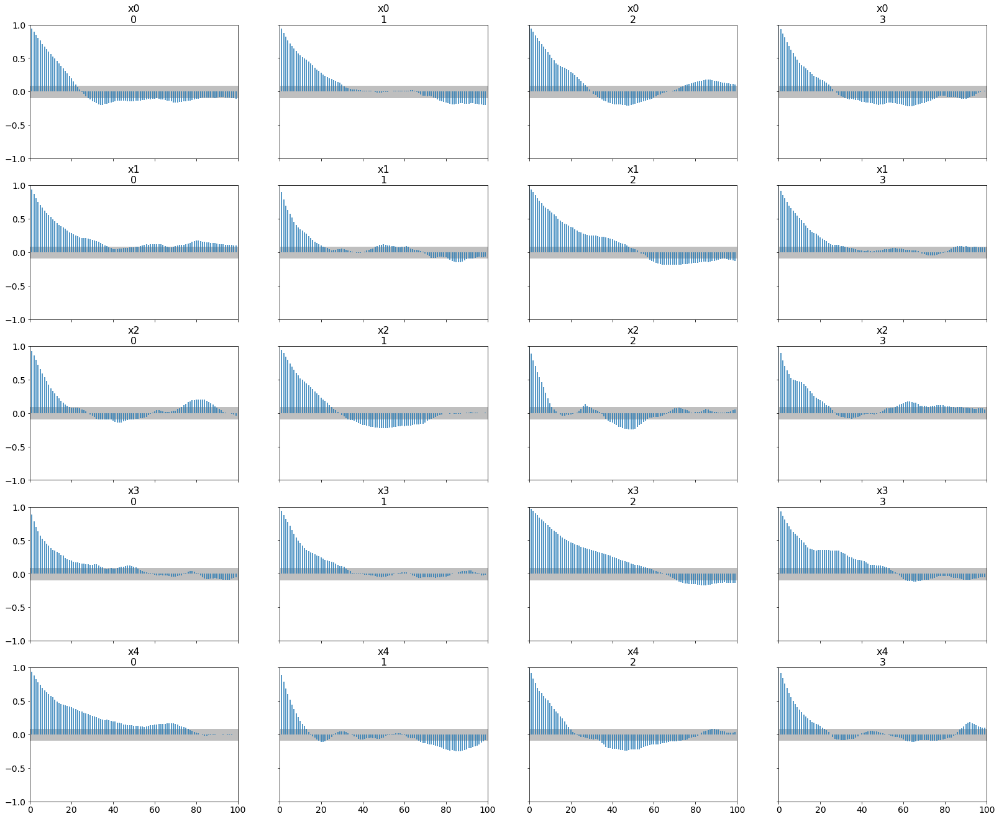

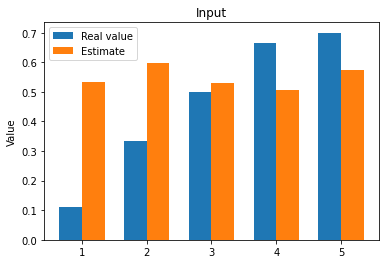

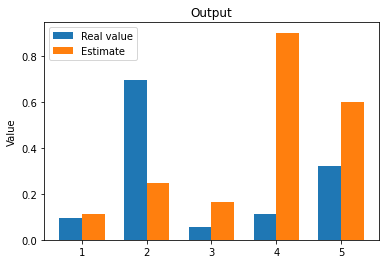

The function inverse took 767.4292497634888 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.eye(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.3 *3# voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise**2*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations,algo="DREAMZ")
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.26: 100%|██████████| 1000/1000 [02:48<00:00,  5.95it/s]


Sampling chain 2/4


Running chain, α = 0.19: 100%|██████████| 1000/1000 [02:56<00:00,  5.67it/s]


Sampling chain 3/4


Running chain, α = 0.16: 100%|██████████| 1000/1000 [02:55<00:00,  5.69it/s]


Sampling chain 4/4


Running chain, α = 0.20: 100%|██████████| 1000/1000 [02:47<00:00,  5.98it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.545 0.531 0.545 0.586 0.509]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.545  0.369  -0.045    1.217      0.039    0.028      93.0     106.0   
x1  0.531  0.292   0.040    1.060      0.033    0.023      79.0      80.0   
x2  0.545  0.345  -0.058    1.151      0.041    0.029      74.0      59.0   
x3  0.586  0.382  -0.016    1.222      0.053    0.037      57.0      96.0   
x4  0.509  0.365   0.062    1.222      0.040    0.028      87.0      99.0   

    r_hat  
x0   1.02  
x1   1.05  
x2   1.04  
x3   1.08  
x4   1.06  
Autocorrelation...
[0.43266 0.198   0.045   0.079   0.191  ]


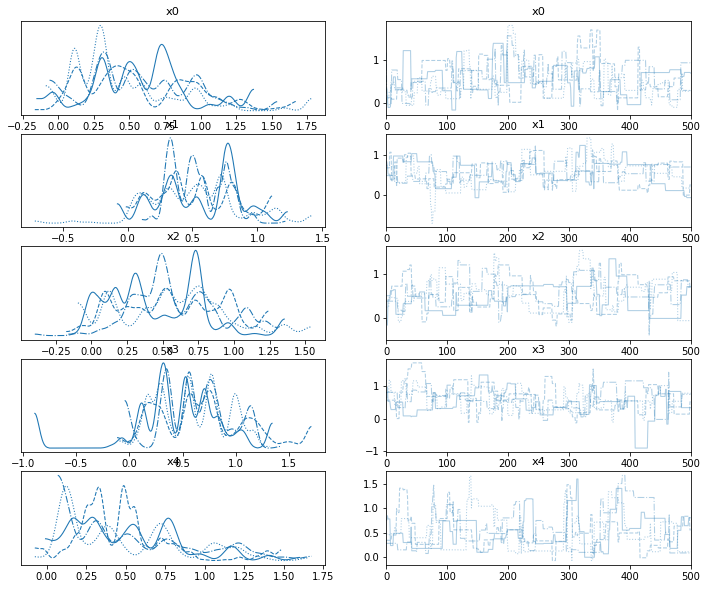

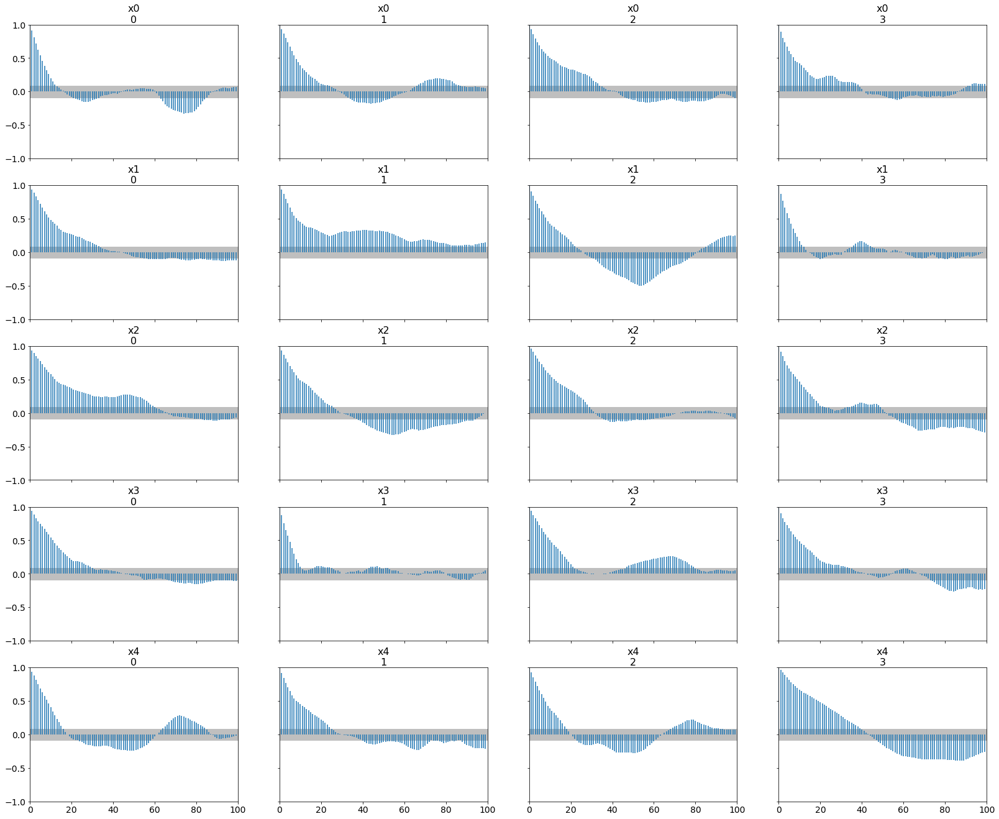

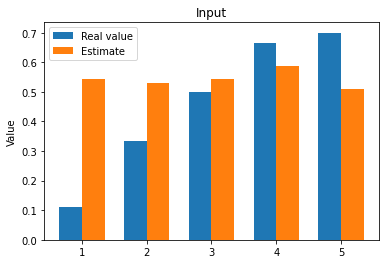

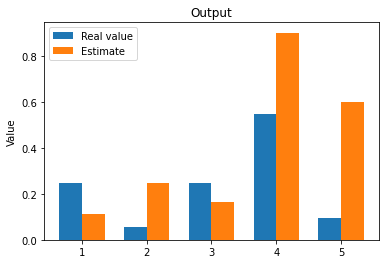

The function inverse took 780.7938289642334 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.eye(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.3 *3# voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = True
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise**2*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations,algo="DREAMZ")
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 1.00:   0%|          | 0/1000 [00:00<?, ?it/s]

Running chain, α = 0.16: 100%|██████████| 1000/1000 [02:39<00:00,  6.28it/s]


Sampling chain 2/4


Running chain, α = 0.11: 100%|██████████| 1000/1000 [02:13<00:00,  7.49it/s]


Sampling chain 3/4


Running chain, α = 0.29: 100%|██████████| 1000/1000 [02:10<00:00,  7.65it/s]


Sampling chain 4/4


Running chain, α = 0.18: 100%|██████████| 1000/1000 [02:11<00:00,  7.59it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\utils.py:187: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


estimated values are [0.503 0.484 0.465 0.618 0.439]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.503  0.243   0.116    0.828      0.106    0.080       6.0      11.0   
x1  0.484  0.206   0.104    0.804      0.096    0.075       5.0      24.0   
x2  0.465  0.101   0.286    0.581      0.040    0.030       8.0      78.0   
x3  0.618  0.296   0.096    1.097      0.145    0.111       4.0      13.0   
x4  0.439  0.173   0.089    0.734      0.074    0.055       6.0      14.0   

    r_hat  
x0   1.93  
x1   2.23  
x2   1.43  
x3   3.61  
x4   1.71  


c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\utils.py:187: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


Autocorrelation...
[0.503 0.484 0.465 0.618 0.439]
[0.11234 0.333   0.5     0.665   0.7    ]


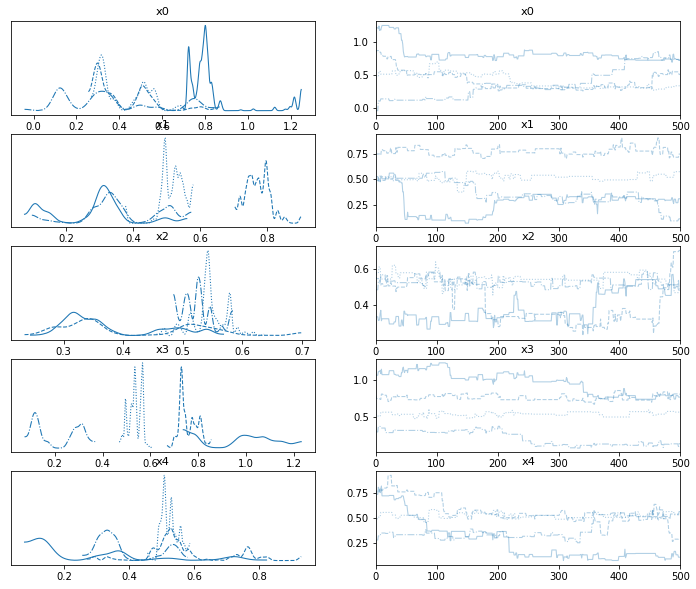

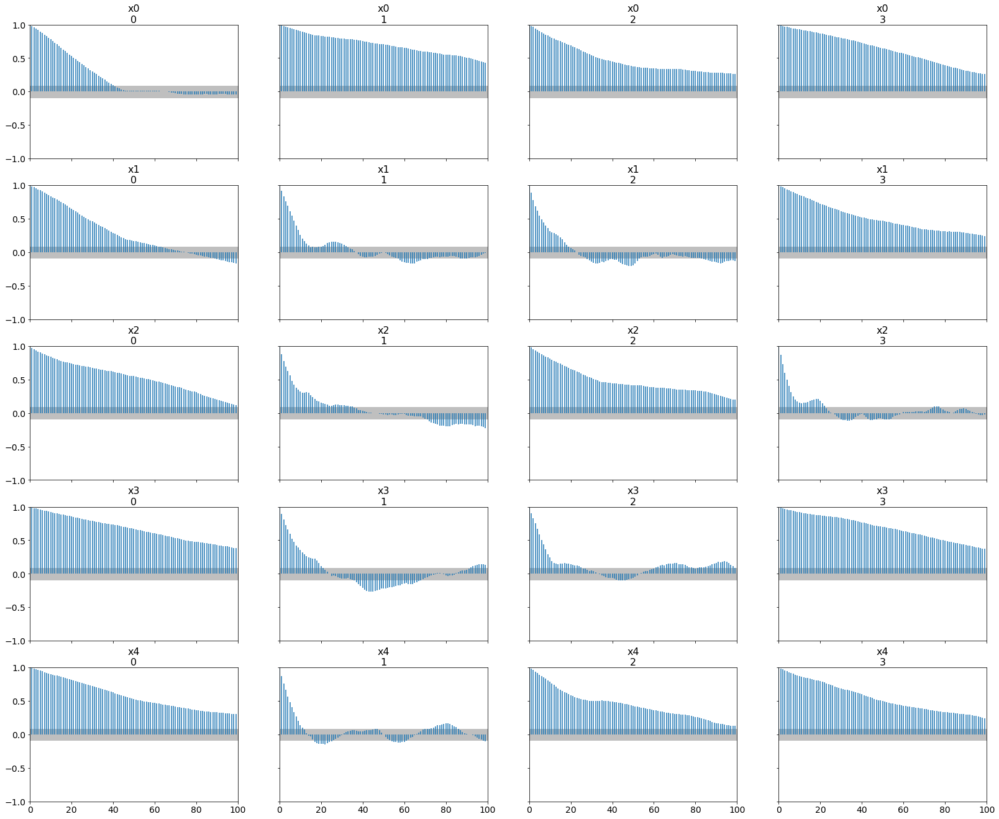

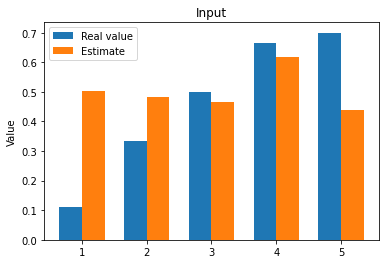

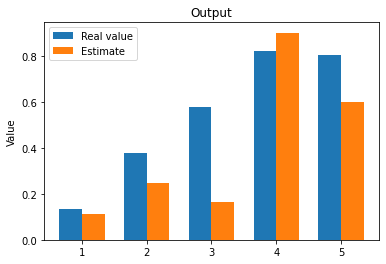

The function inverse took 562.0243139266968 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)
    

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.40: 100%|██████████| 3000/3000 [07:47<00:00,  6.41it/s]


Sampling chain 2/4


Running chain, α = 0.47: 100%|██████████| 3000/3000 [08:00<00:00,  6.24it/s]


Sampling chain 3/4


Running chain, α = 0.44: 100%|██████████| 3000/3000 [08:05<00:00,  6.18it/s]


Sampling chain 4/4


Running chain, α = 0.43: 100%|██████████| 3000/3000 [08:11<00:00,  6.10it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.51  0.457 0.579 0.475 0.662]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.510  0.329  -0.083    1.121      0.095    0.069      12.0      43.0   
x1  0.457  0.254  -0.070    0.847      0.043    0.031      36.0      61.0   
x2  0.579  0.313  -0.043    1.121      0.109    0.080       8.0      49.0   
x3  0.475  0.320  -0.060    1.089      0.068    0.056      25.0      43.0   
x4  0.662  0.343   0.074    1.340      0.137    0.106       7.0      14.0   

    r_hat  
x0   1.27  
x1   1.10  
x2   1.45  
x3   1.23  
x4   1.60  
Autocorrelation...
[0.51  0.457 0.579 0.475 0.662]
[0.11234 0.333   0.5     0.665   0.7    ]


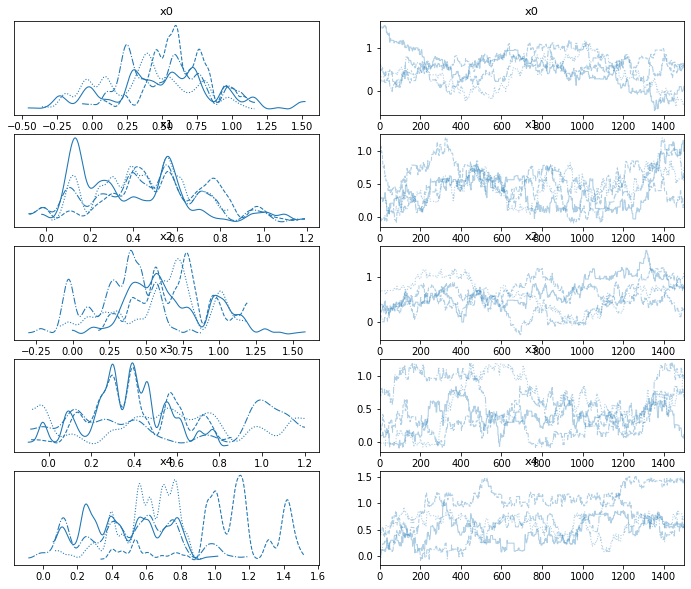

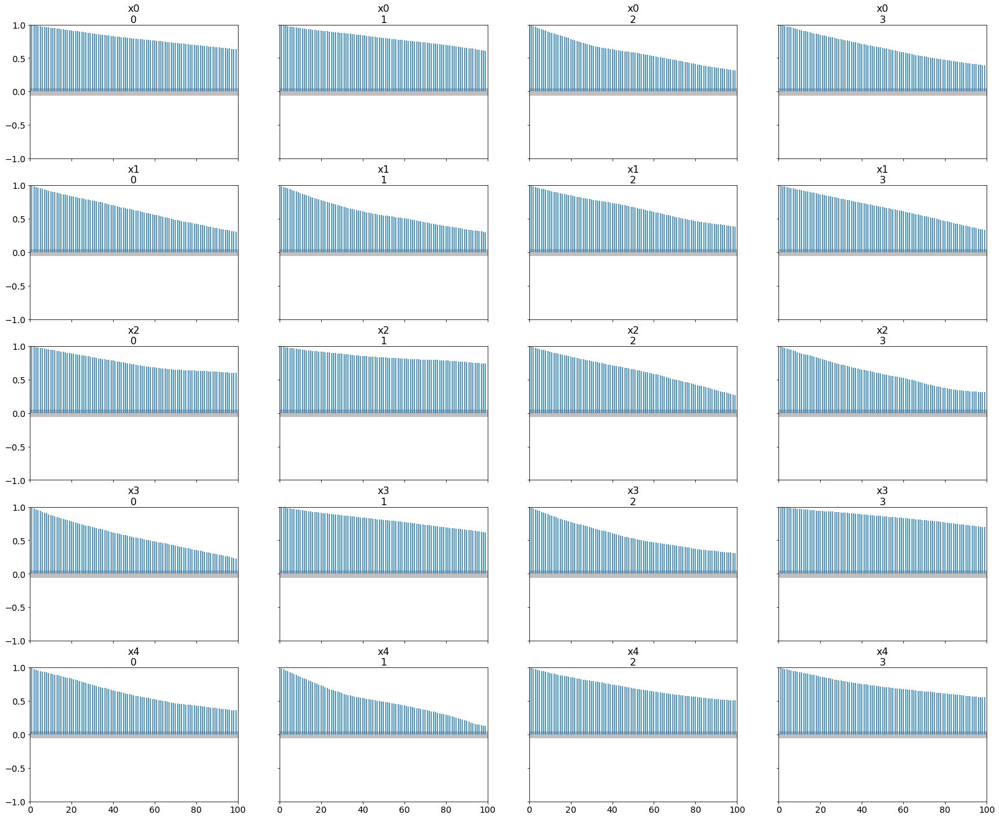

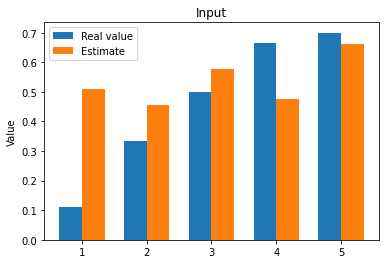

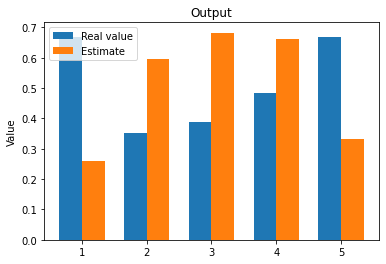

The function inverse took 1936.1948635578156 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
iterations=3000
burnin=1500
for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)
    

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/10


Running chain, α = 0.05: 100%|██████████| 1000/1000 [02:49<00:00,  5.89it/s]


Sampling chain 2/10


Running chain, α = 0.17: 100%|██████████| 1000/1000 [02:44<00:00,  6.08it/s]


Sampling chain 3/10


Running chain, α = 0.13: 100%|██████████| 1000/1000 [02:46<00:00,  6.02it/s]


Sampling chain 4/10


Running chain, α = 0.14: 100%|██████████| 1000/1000 [04:13<00:00,  3.95it/s]


Sampling chain 5/10


Running chain, α = 0.24: 100%|██████████| 1000/1000 [02:39<00:00,  6.29it/s]


Sampling chain 6/10


Running chain, α = 0.05: 100%|██████████| 1000/1000 [02:27<00:00,  6.78it/s]


Sampling chain 7/10


Running chain, α = 0.26: 100%|██████████| 1000/1000 [02:43<00:00,  6.13it/s]


Sampling chain 8/10


Running chain, α = 0.09: 100%|██████████| 1000/1000 [02:45<00:00,  6.02it/s]


Sampling chain 9/10


Running chain, α = 0.02: 100%|██████████| 1000/1000 [02:56<00:00,  5.68it/s]


Sampling chain 10/10


Running chain, α = 0.14: 100%|██████████| 1000/1000 [02:55<00:00,  5.70it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.571 0.541 0.489 0.651 0.484]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.571  0.286   0.091    1.021      0.085    0.062      12.0      21.0   
x1  0.541  0.427  -0.038    1.179      0.130    0.095      11.0      15.0   
x2  0.489  0.219   0.095    0.800      0.062    0.045      14.0      32.0   
x3  0.651  0.349   0.119    1.178      0.105    0.077      12.0      15.0   
x4  0.484  0.309  -0.069    1.078      0.094    0.068      11.0      13.0   

    r_hat  
x0   2.68  
x1   3.33  
x2   2.02  
x3   2.55  
x4   3.52  
Autocorrelation...


c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\plots\plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (50) in plot_autocorr, generating only 40 plots
  warnings.warn(


[0.571 0.541 0.489 0.651 0.484]
[0.11234 0.333   0.5     0.665   0.7    ]


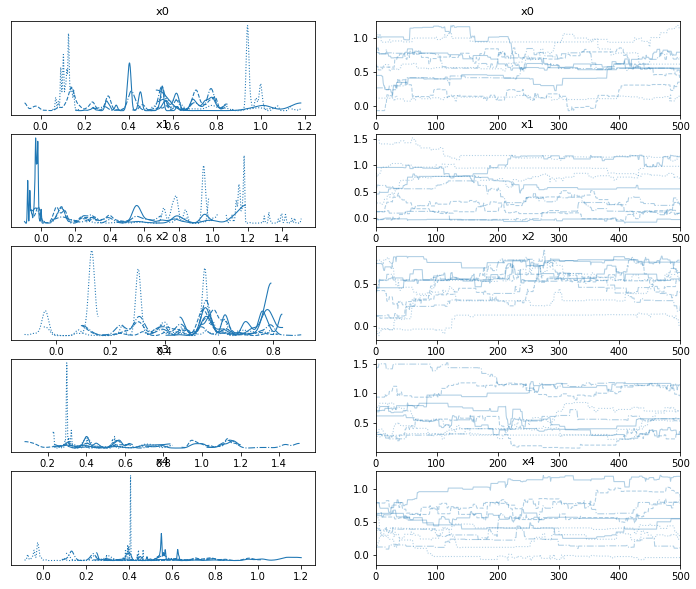

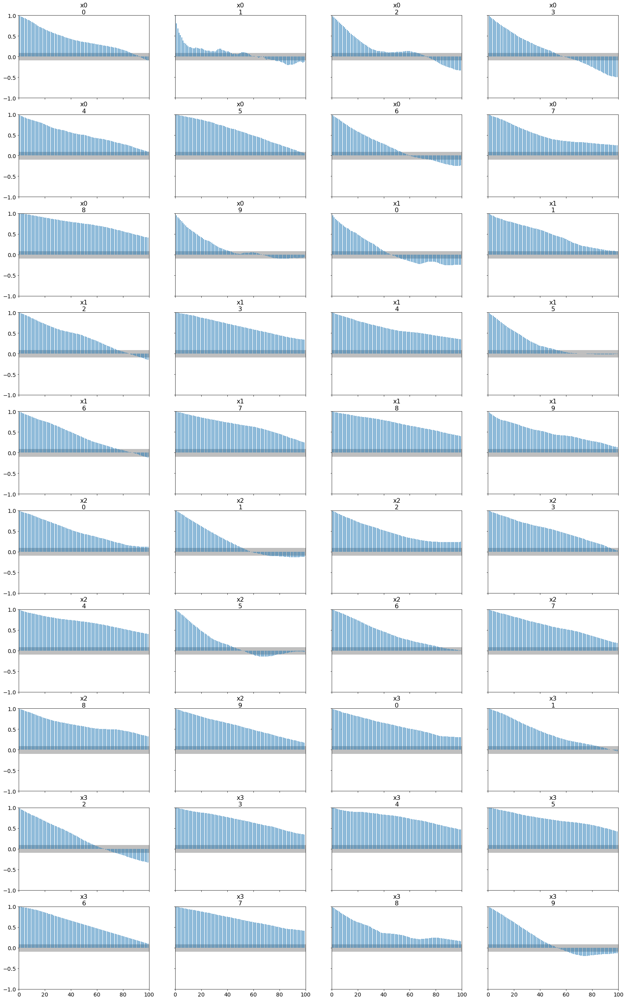

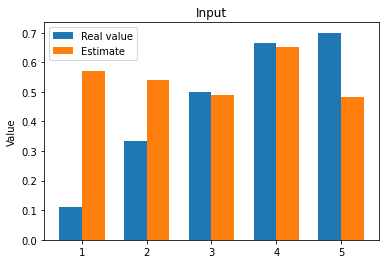

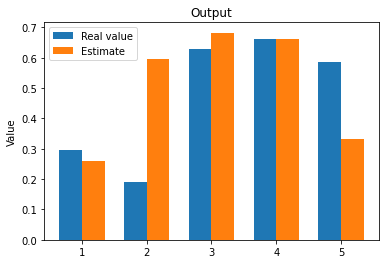

The function inverse took 1752.8812668323517 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
iterations=1000
burnin=500
n_chains=10
for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.58: 100%|██████████| 1000/1000 [02:57<00:00,  5.63it/s]


Sampling chain 2/4


Running chain, α = 0.58: 100%|██████████| 1000/1000 [03:12<00:00,  5.21it/s]


Sampling chain 3/4


Running chain, α = 0.57: 100%|██████████| 1000/1000 [02:52<00:00,  5.79it/s]


Sampling chain 4/4


Running chain, α = 0.60: 100%|██████████| 1000/1000 [03:04<00:00,  5.43it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.294 0.765 0.449 0.75  0.307]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.294  0.739  -0.809    1.836      0.335    0.253       5.0      13.0   
x1  0.765  0.687  -0.614    2.124      0.312    0.236       5.0      17.0   
x2  0.449  0.409  -0.092    1.517      0.145    0.108       9.0      17.0   
x3  0.750  0.636  -0.084    2.051      0.289    0.218       5.0      18.0   
x4  0.307  0.394  -0.379    1.076      0.156    0.116       6.0      15.0   

    r_hat  
x0   2.19  
x1   2.37  
x2   1.42  
x3   2.12  
x4   1.68  
Autocorrelation...
[0.294 0.765 0.449 0.75  0.307]
[0.11234 0.333   0.5     0.665   0.7    ]


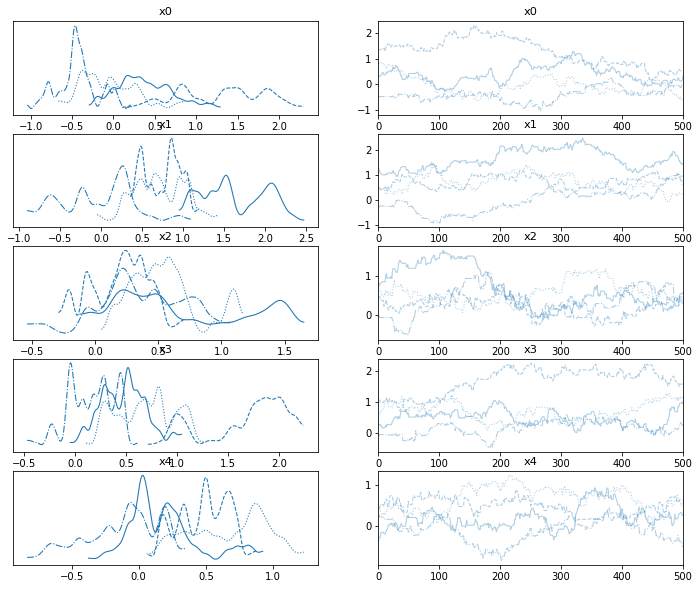

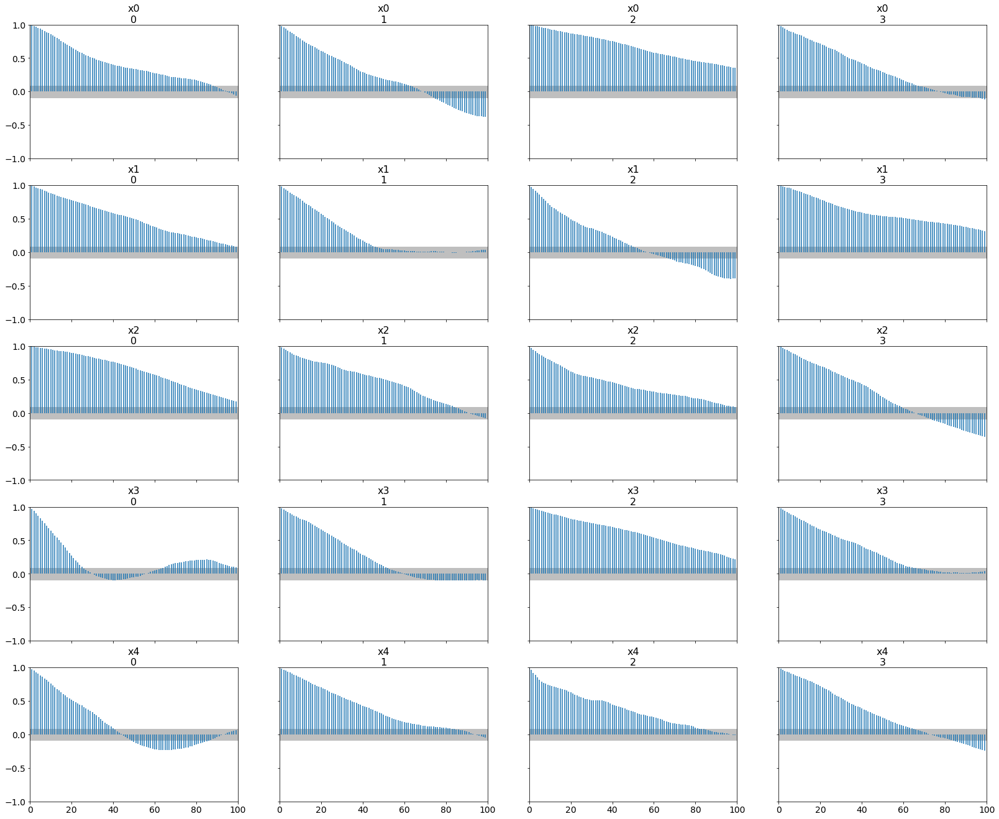

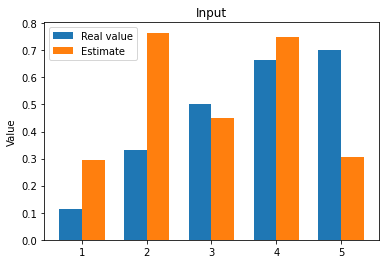

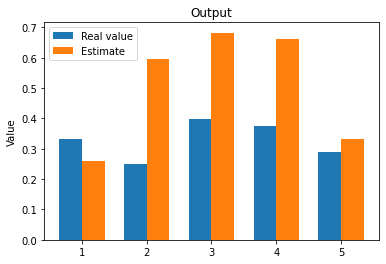

The function inverse took 732.2816848754883 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.ones(dim)*0.1*3  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.1*3 # voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=1000#4000#8000
burnin=500#2000#4000
n_chains=4

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/6


Running chain, α = 0.32: 100%|██████████| 1500/1500 [03:32<00:00,  7.05it/s]


Sampling chain 2/6


Running chain, α = 0.55: 100%|██████████| 1500/1500 [03:40<00:00,  6.80it/s]


Sampling chain 3/6


Running chain, α = 0.35: 100%|██████████| 1500/1500 [03:33<00:00,  7.02it/s]


Sampling chain 4/6


Running chain, α = 0.32: 100%|██████████| 1500/1500 [03:54<00:00,  6.41it/s]


Sampling chain 5/6


Running chain, α = 0.42: 100%|██████████| 1500/1500 [03:38<00:00,  6.88it/s]


Sampling chain 6/6


Running chain, α = 0.23: 100%|██████████| 1500/1500 [03:53<00:00,  6.42it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.684 0.235 0.521 0.209 0.67 ]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.684  0.367   0.063    1.237      0.119    0.087      10.0      25.0   
x1  0.235  0.582  -1.229    0.860      0.221    0.163      10.0      24.0   
x2  0.521  0.762  -1.079    1.552      0.300    0.222       7.0      21.0   
x3  0.209  0.570  -0.993    1.118      0.212    0.157      10.0      24.0   
x4  0.670  0.420  -0.098    1.310      0.151    0.111       8.0      35.0   

    r_hat  
x0   1.67  
x1   1.62  
x2   2.57  
x3   1.66  
x4   2.02  
Autocorrelation...
[0.684 0.235 0.521 0.209 0.67 ]
[0.11234 0.333   0.5     0.665   0.7    ]


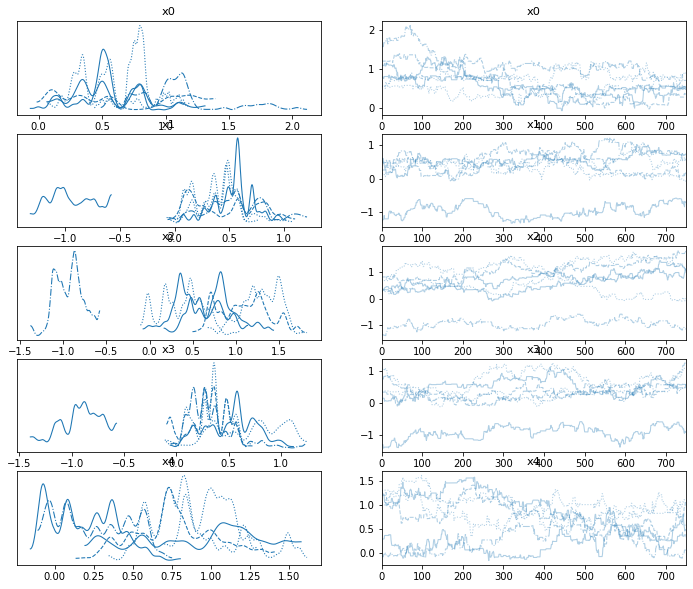

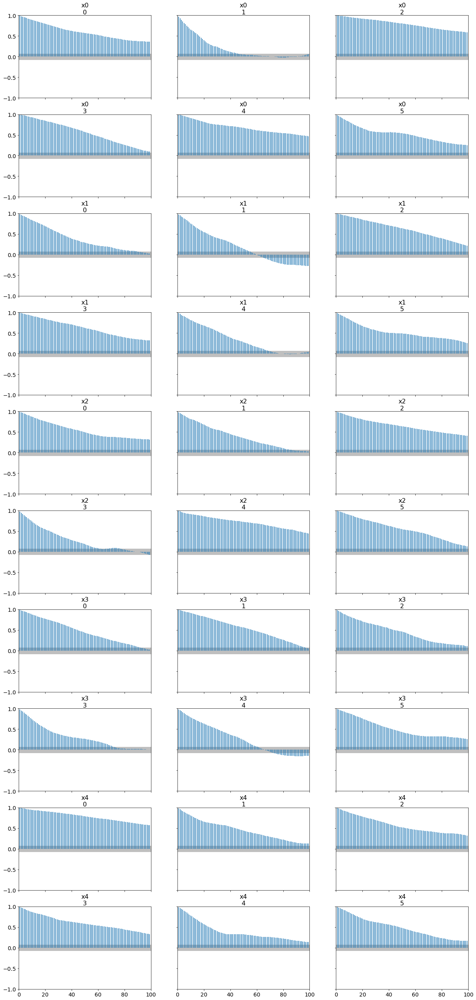

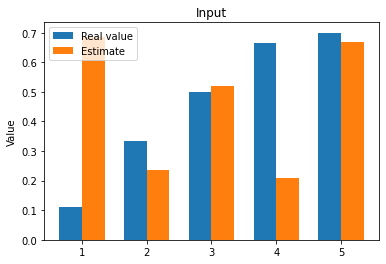

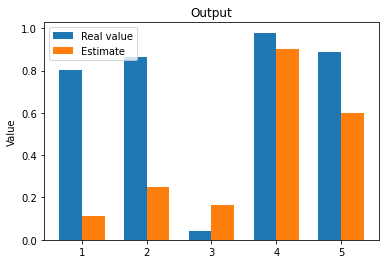

The function inverse took 1341.2048208713531 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.ones(dim)*0.1*3  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.1*3 # voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*1.5 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.05
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=1500#4000#8000
burnin=750#2000#4000
n_chains=6

for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.ones(dim)*0.1*2#*3  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.05 # covariance of the noise added to the known data
sigma_noise=0.05#*3 # voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*4 # covarianza della distribuzione di proposta!   <- elemento principale da regolare per modificare parametro di accettazione
rmwh_scaling = 0.1
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=1500#4000#8000
burnin=750#2000#4000
n_chains=2
# alfa indica acceptance rejection, mi aspetto valori tra 0.3 e 0.5 che si riducano (mi sto avvicinando a valore vero, per cui prob piu alta)
for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/2


Running chain, α = 0.00:  28%|██▊       | 421/1500 [01:11<03:02,  5.91it/s]


KeyboardInterrupt: 

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.75: 100%|██████████| 3000/3000 [07:24<00:00,  6.75it/s]


Sampling chain 2/4


Running chain, α = 0.64: 100%|██████████| 3000/3000 [07:07<00:00,  7.02it/s]


Sampling chain 3/4


Running chain, α = 0.66: 100%|██████████| 3000/3000 [07:29<00:00,  6.67it/s]


Sampling chain 4/4


Running chain, α = 0.58: 100%|██████████| 3000/3000 [08:08<00:00,  6.15it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\utils.py:187: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


estimated values are [0.39  0.434 0.243 0.506 0.562]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.390  0.278  -0.095    0.794      0.135    0.103       5.0      21.0   
x1  0.434  0.239   0.082    0.795      0.118    0.090       5.0      33.0   
x2  0.243  0.192  -0.071    0.547      0.092    0.070       5.0      18.0   
x3  0.506  0.356   0.069    1.098      0.174    0.133       5.0      13.0   
x4  0.562  0.208   0.257    0.826      0.099    0.075       5.0      60.0   

    r_hat  
x0   2.77  
x1   2.86  
x2   2.30  
x3   2.57  
x4   1.99  


c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\utils.py:187: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


Autocorrelation...
[0.39  0.434 0.243 0.506 0.562]
[0.11234 0.333   0.5     0.665   0.7    ]


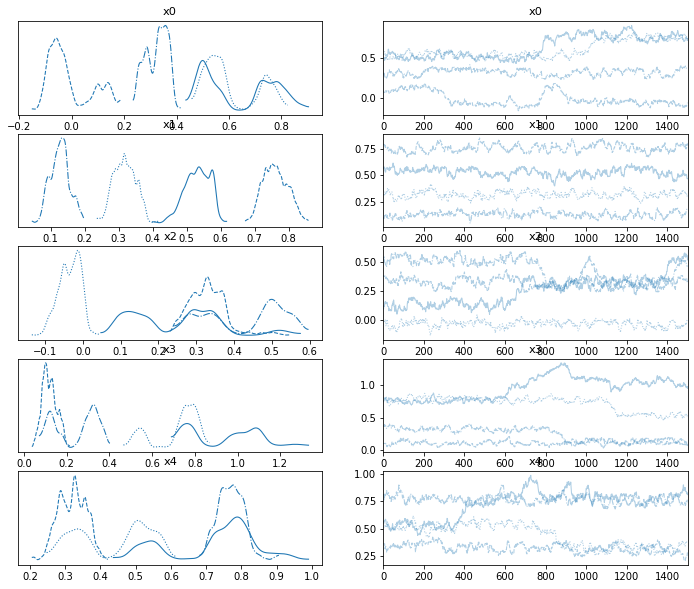

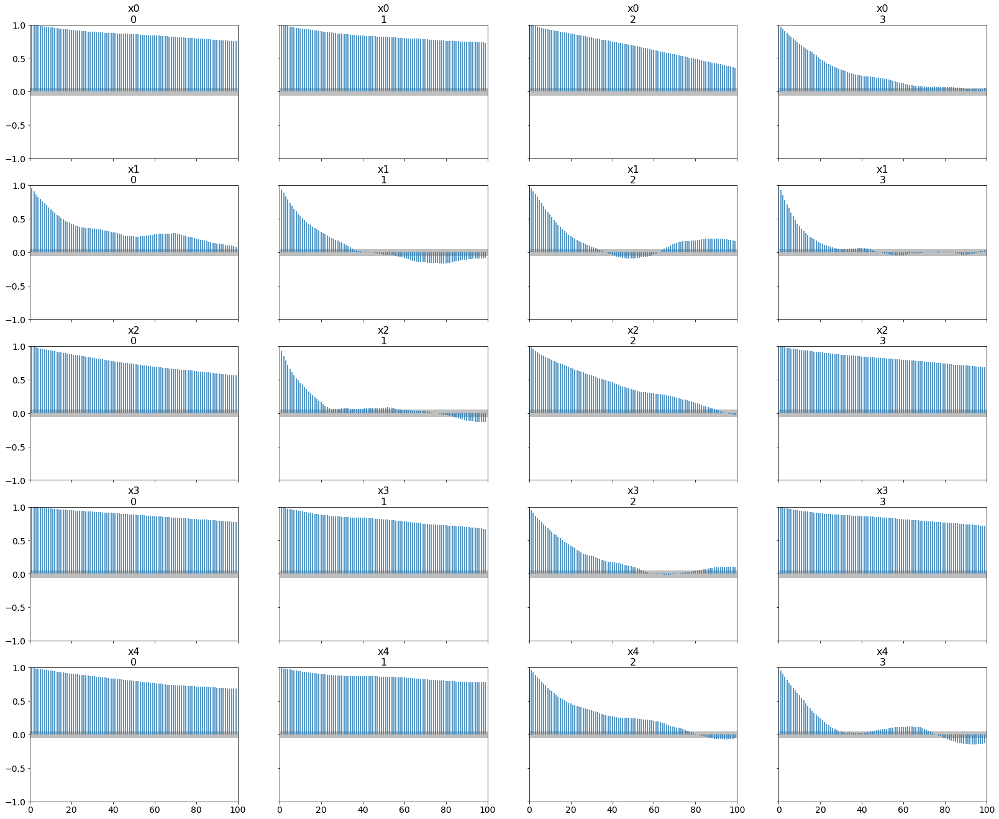

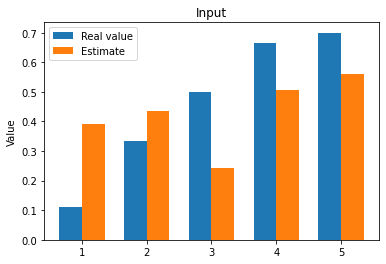

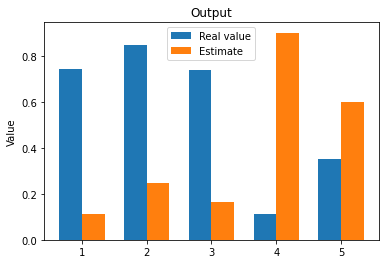

The function inverse took 1821.0441436767578 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.ones(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.1*4 # voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.01
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=3000#4000#8000
burnin=1500#2000#4000
n_chains=4
for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
  

adaptive case
real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/4


Running chain, α = 0.33: 100%|██████████| 3000/3000 [08:18<00:00,  6.02it/s]


Sampling chain 2/4


Running chain, α = 0.29: 100%|██████████| 3000/3000 [08:07<00:00,  6.15it/s]


Sampling chain 3/4


Running chain, α = 0.33: 100%|██████████| 3000/3000 [09:29<00:00,  5.27it/s]  


Sampling chain 4/4


Running chain, α = 0.25: 100%|██████████| 3000/3000 [07:44<00:00,  6.46it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


estimated values are [0.55  0.597 0.566 0.594 0.602]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.550  0.335  -0.092    1.115      0.022    0.015     242.0     395.0   
x1  0.597  0.364  -0.066    1.191      0.026    0.018     205.0     265.0   
x2  0.566  0.375  -0.039    1.225      0.028    0.020     181.0     410.0   
x3  0.594  0.381  -0.071    1.280      0.033    0.023     139.0     328.0   
x4  0.602  0.374   0.048    1.287      0.032    0.023     138.0     380.0   

    r_hat  
x0   1.01  
x1   1.02  
x2   1.03  
x3   1.03  
x4   1.03  
Autocorrelation...
[0.55  0.597 0.566 0.594 0.602]
[0.11234 0.333   0.5     0.665   0.7    ]


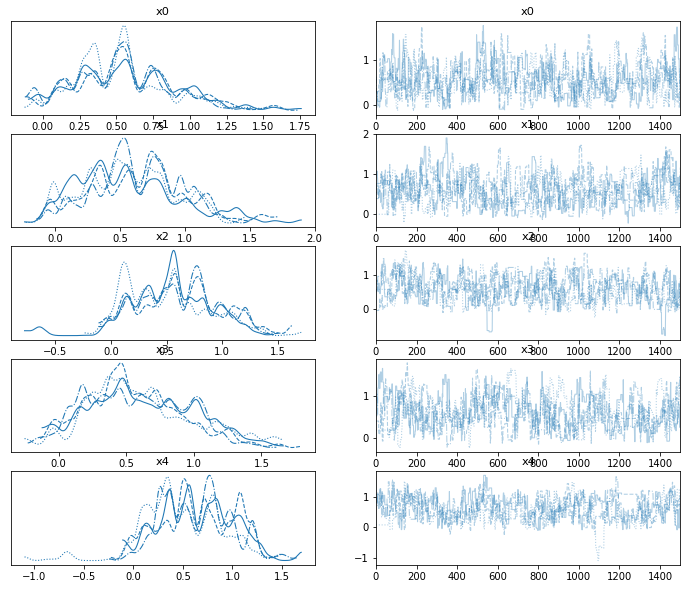

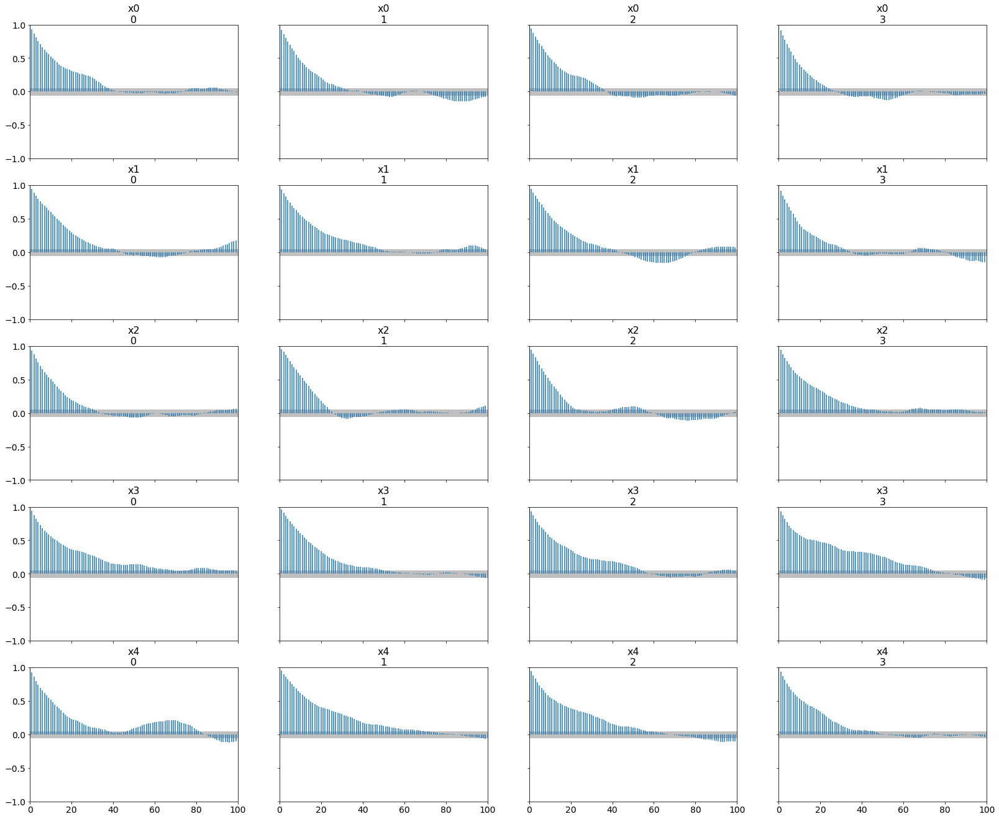

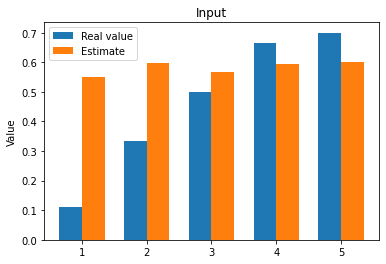

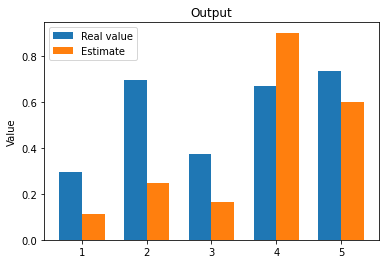

The function inverse took 2030.943510055542 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
print(("adaptive case"))
mean_prior = np.ones(dim)*0.5
cov_prior = np.ones(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.1*4 # voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*2 # covarianza della distribuzione di proposta!
rmwh_scaling = 0.01
rwmh_adaptive = True
#iterations =20000
#burnin = 5000
iterations=3000#4000#8000
burnin=1500#2000#4000
n_chains=4
for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
  

adaptive case
real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/1


Running chain, α = 0.15: 100%|██████████| 3000/3000 [08:09<00:00,  6.13it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(
arviz - WARNING - Shape validation failed: input_shape: (1, 1501), minimum_shape: (chains=2, draws=4)
arviz - WARNING - Shape validation failed: input_shape: (1, 1501), minimum_shape: (chains=2, draws=4)


estimated values are [0.572 0.625 0.558 0.608 0.574]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  0.572  0.379  -0.009    1.343      0.073    0.052      28.0     100.0   
x1  0.625  0.452  -0.111    1.325      0.116    0.083      13.0      35.0   
x2  0.558  0.385  -0.131    1.199      0.051    0.038      57.0      71.0   
x3  0.608  0.354   0.016    1.279      0.064    0.051      31.0      57.0   
x4  0.574  0.343  -0.090    1.107      0.052    0.037      45.0      89.0   

    r_hat  
x0    NaN  
x1    NaN  
x2    NaN  
x3    NaN  
x4    NaN  
Autocorrelation...
[0.572 0.625 0.558 0.608 0.574]
[0.11234 0.333   0.5     0.665   0.7    ]


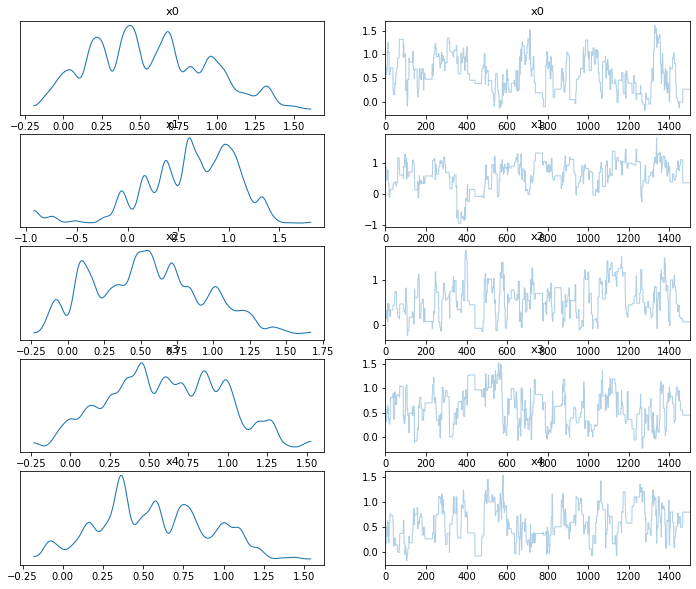

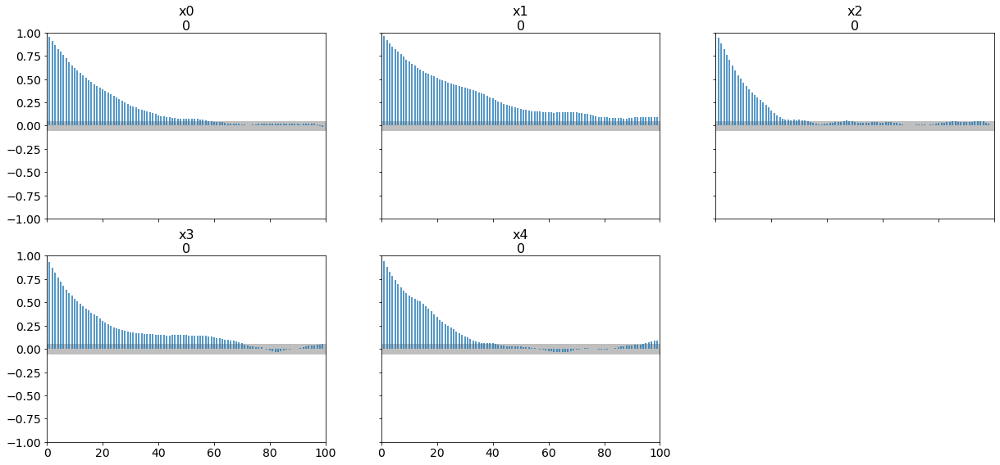

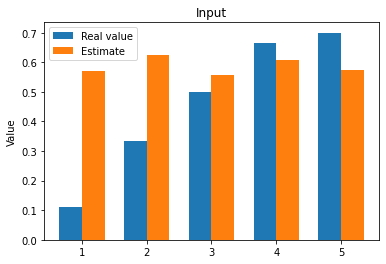

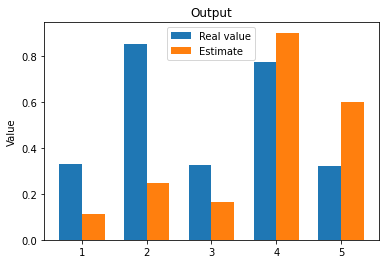

The function inverse took 492.39684987068176 seconds.


AttributeError: 'int' object has no attribute 'inverse'

In [ ]:
print(("adaptive case"))
mean_prior = np.ones(dim)*0.5
cov_prior = np.ones(dim)*0.1*1.5  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.1 # covariance of the noise added to the known data
sigma_noise=0.1*4 # voceriance of the likelihood
rwmh_cov = np.eye(len(real_x)) # covarianza della distribuzione di proposta!
rmwh_scaling = 0.01
rwmh_adaptive = True
#iterations =20000
#burnin = 5000
iterations=3000#4000#8000
burnin=1500#2000#4000
n_chains=1
for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
  

In [ ]:
mean_prior = np.ones(dim)*0.5
cov_prior = np.ones(dim)*0.1*1.5#*3  # covariance of the prior # like Manzoni paper -> 1% of the width of the ranges 
sigma=0.05 # covariance of the noise added to the known data
sigma_noise=0.05#*3 # voceriance of the likelihood
rwmh_cov = np.eye(len(real_x))*4 # covarianza della distribuzione di proposta!   <- elemento principale da regolare per modificare parametro di accettazione
rmwh_scaling = 0.05
rwmh_adaptive = False
#iterations =20000
#burnin = 5000
iterations=3000#4000#8000
burnin=1500#2000#4000
n_chains=2
# alfa indica acceptance rejection, mi aspetto valori tra 0.3 e 0.5 che si riducano (mi sto avvicinando a valore vero, per cui prob piu alta)
for j in range(len(model_list)):
    estimate_MF=model_list[j].inverse(mean_prior, cov_prior=cov_prior, cov_noise=sigma, cov_likelihood=sigma_noise*np.eye(real_x.shape[0]), y_obs=nearest_U, x_real=real_x, number_chains=n_chains, N=iterations, burn_in=burnin, diagnostic=True,rwmh_cov=rwmh_cov,rmwh_scaling=rmwh_scaling,rwmh_adaptive=rwmh_adaptive,transformation=transformations)
    #estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

real values are [[0.11234]
 [0.333  ]
 [0.5    ]
 [0.665  ]
 [0.7    ]]
Sampling chain 1/2


Running chain, α = 0.07:   1%|▏         | 42/3000 [00:07<09:27,  5.21it/s]Exception ignored in: <function UniquePtr.__del__ at 0x000001F463F0B130>
Traceback (most recent call last):
  File "c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow\python\framework\c_api_util.py", line 74, in __del__
    self.deleter(obj)
KeyboardInterrupt: 
Running chain, α = 0.01:   3%|▎         | 101/3000 [00:19<08:25,  5.74it/s]

In [ ]:
for j in range(len(model_list)):
    estimate2=model_list[j].inverse_cuqi(real_x,nearest_U)

ValueError: setting an array element with a sequence.